# Advanced Regression  - Assignment

## Problem Statement

A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them on at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file below.

The company is looking at prospective properties to buy to enter the market. You are required to build a regression model using regularisation in order to predict the actual value of the prospective properties and decide whether to invest in them or not.

The company wants to know the following things about the prospective properties:

Which variables are significant in predicting the price of a house, and

How well those variables describe the price of a house.

Also, determine the optimal value of lambda for ridge and lasso regression

## Business Goal 

You are required to model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for management to understand the pricing dynamics of a new market.

### Approach:
1. Importing Packages
2. Reading & Understanding Data
3. Data Cleaning
4. Exploratory Data Analysis
5. Data Preparation
6. Model Building
7. Data Evaluation
8. Ridge & Lasso Regression

## 1. Importing required packages

In [1]:
# Importing necessary packages required for the assignment
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# importing warnings to supress warnings
import warnings
warnings.filterwarnings('ignore')

# Importing required libraries for the advanced linear regression modelling
from sklearn.preprocessing import StandardScaler , MinMaxScaler
from sklearn.linear_model import LinearRegression , Ridge, Lasso
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from sklearn.feature_selection import RFE
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV

In [2]:
# Configuring set_option to view the columns & rows of the dataframe

pd.set_option("display.max_columns", 300)
pd.set_option("display.max_rows", 500)

## 2. Reading & Understanding the Data

In [3]:
# Reading the train.csv as housing_dataset dataframe
housing_dataset = pd.read_csv("train.csv")

In [4]:
# Check the head of the housing_dataset
housing_dataset.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [5]:
# Check the tail of the housing_dataset
housing_dataset.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,Y,FuseA,1078,0,0,1078,1,0,1,0,2,1,Gd,5,Typ,0,NaN,Attchd,1950.0,Unf,1,240,TA,TA,Y,366,0,112,0,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75.0,9937,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,5,6,1965,1965,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,TA,TA,No,BLQ,830,LwQ,290,136,1256,GasA,Gd,Y,SBrkr,1256,0,0,1256,1,0,1,1,3,1,TA,6,Typ,0,NaN,Attchd,1965.0,Fin,1,276,TA,TA,Y,736,68,0,0,0,0,NaN,NaN,NaN,0,6,2008,WD,Normal,147500


In [6]:
# Check the shape of the housing_dataset
housing_dataset.shape

(1460, 81)

In [7]:
# Check the columns of the dataset
housing_dataset.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [8]:
# Check the number of rows, columns, data types , not null counts of the dataset
housing_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [9]:
# Check the statistical summary of the dataset
housing_dataset.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Id,1460,NaN,NaN,NaN,730.5,421.61,1,365.75,730.5,1095.25,1460
MSSubClass,1460,NaN,NaN,NaN,56.8973,42.3006,20,20,50,70,190
MSZoning,1460,5,RL,1151,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LotFrontage,1201,NaN,NaN,NaN,70.05,24.2848,21,59,69,80,313
LotArea,1460,NaN,NaN,NaN,10516.8,9981.26,1300,7553.5,9478.5,11601.5,215245
Street,1460,2,Pave,1454,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Alley,91,2,Grvl,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LotShape,1460,4,Reg,925,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LandContour,1460,4,Lvl,1311,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Utilities,1460,2,AllPub,1459,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Observations:
- There are many missing values in many columns.
- We can impute missing categorical variables with mode or Other_column_name
- We can impute missing Continuous variables with mean or median of the column.

## 3. Data Cleaning

#### Let's check the missing values in all the variables

In [10]:
# Checking the total missing values percentages in each columns
round((housing_dataset.isnull().sum()/len(housing_dataset.index)* 100),2).sort_values(ascending = False)

PoolQC           99.52
MiscFeature      96.30
Alley            93.77
Fence            80.75
FireplaceQu      47.26
LotFrontage      17.74
GarageCond        5.55
GarageType        5.55
GarageYrBlt       5.55
GarageFinish      5.55
GarageQual        5.55
BsmtExposure      2.60
BsmtFinType2      2.60
BsmtFinType1      2.53
BsmtCond          2.53
BsmtQual          2.53
MasVnrArea        0.55
MasVnrType        0.55
Electrical        0.07
Utilities         0.00
YearRemodAdd      0.00
MSSubClass        0.00
Foundation        0.00
ExterCond         0.00
ExterQual         0.00
Exterior2nd       0.00
Exterior1st       0.00
RoofMatl          0.00
RoofStyle         0.00
YearBuilt         0.00
LotConfig         0.00
OverallCond       0.00
OverallQual       0.00
HouseStyle        0.00
BldgType          0.00
Condition2        0.00
BsmtFinSF1        0.00
MSZoning          0.00
LotArea           0.00
Street            0.00
Condition1        0.00
Neighborhood      0.00
LotShape          0.00
LandContour

There are many columns with missing values & lets drop all the columns with missing values above 45% and impute with respective values for the missing values less than 45%

#### Lets drop all the columns with missig values / Nan greater than 45% as thaose columns will not be helpful in giving better modelling

In [11]:
# Dropping all the columns having missing values > 45

for col in housing_dataset.columns:
    if ((housing_dataset[col].isnull().sum()/len(housing_dataset.index)* 100) >= 45):
        housing_dataset.drop(col, axis = 1, inplace = True)

In [12]:
# Lets check the total missing values percentages in each columns
round((housing_dataset.isnull().sum()/len(housing_dataset.index)* 100),2).sort_values(ascending = False)

LotFrontage      17.74
GarageFinish      5.55
GarageType        5.55
GarageCond        5.55
GarageQual        5.55
GarageYrBlt       5.55
BsmtExposure      2.60
BsmtFinType2      2.60
BsmtFinType1      2.53
BsmtCond          2.53
BsmtQual          2.53
MasVnrType        0.55
MasVnrArea        0.55
Electrical        0.07
RoofStyle         0.00
RoofMatl          0.00
SalePrice         0.00
Exterior1st       0.00
Exterior2nd       0.00
YearBuilt         0.00
ExterQual         0.00
ExterCond         0.00
Foundation        0.00
YearRemodAdd      0.00
BldgType          0.00
OverallCond       0.00
OverallQual       0.00
HouseStyle        0.00
Condition2        0.00
Condition1        0.00
Neighborhood      0.00
LandSlope         0.00
LotConfig         0.00
Utilities         0.00
LandContour       0.00
LotShape          0.00
Street            0.00
LotArea           0.00
MSZoning          0.00
MSSubClass        0.00
BsmtFinSF1        0.00
TotalBsmtSF       0.00
BsmtFinSF2        0.00
EnclosedPor

#### Lets check the continuous columns & impute with the mean values:

In [13]:
# Lets check the continuous columns mean values.
missing_value_columns = []
for col in housing_dataset.columns:
    if ((housing_dataset[col].isnull().sum()/len(housing_dataset.index)* 100) > 0):
        missing_value_columns.append(col)
housing_dataset[missing_value_columns].describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
LotFrontage,1201,NaN,NaN,NaN,70.05,24.2848,21,59,69,80,313
MasVnrType,1452,4,None,864,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MasVnrArea,1452,NaN,NaN,NaN,103.685,181.066,0,0,0,166,1600
BsmtQual,1423,4,TA,649,NaN,NaN,NaN,NaN,NaN,NaN,NaN
BsmtCond,1423,4,TA,1311,NaN,NaN,NaN,NaN,NaN,NaN,NaN
BsmtExposure,1422,4,No,953,NaN,NaN,NaN,NaN,NaN,NaN,NaN
BsmtFinType1,1423,6,Unf,430,NaN,NaN,NaN,NaN,NaN,NaN,NaN
BsmtFinType2,1422,6,Unf,1256,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Electrical,1459,5,SBrkr,1334,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GarageType,1379,6,Attchd,870,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Lets check the Categorical Columns & impute the missing values with other_Category :

In [14]:
# Lets create a function to print value counts for each categori sub class& plot count plot

def categorical_value_counts(col):
    # To print the value counts including null counts for each category
    print("Categorical Sub-Class Value Counts - ", col)
    print(housing_dataset[col].value_counts(dropna = False , normalize = True) * 100)
    print("\n")
    print("CountPlot for - ", col)
    print("\n")
    
    # Count Plot Function
    plt.figure(figsize = (15,5))
    sns.countplot(housing_dataset[col])
    plt.xticks(rotation = 90)
    plt.show()

In [15]:
# Lets print the mean vlaues for the Continuous columns with missig values > 0

for col in housing_dataset.select_dtypes('number').columns:
    if ((housing_dataset[col].isnull().sum()/len(housing_dataset.index)* 100) > 0):
        print(col)
        print("Mean :", housing_dataset[col].mean())
        print("Median :", housing_dataset[col].median())
        print("\n")

LotFrontage
Mean : 70.04995836802665
Median : 69.0


MasVnrArea
Mean : 103.68526170798899
Median : 0.0


GarageYrBlt
Mean : 1978.5061638868744
Median : 1980.0




Categorical Sub-Class Value Counts -  MasVnrType
None       59.178082
BrkFace    30.479452
Stone       8.767123
BrkCmn      1.027397
NaN         0.547945
Name: MasVnrType, dtype: float64


CountPlot for -  MasVnrType




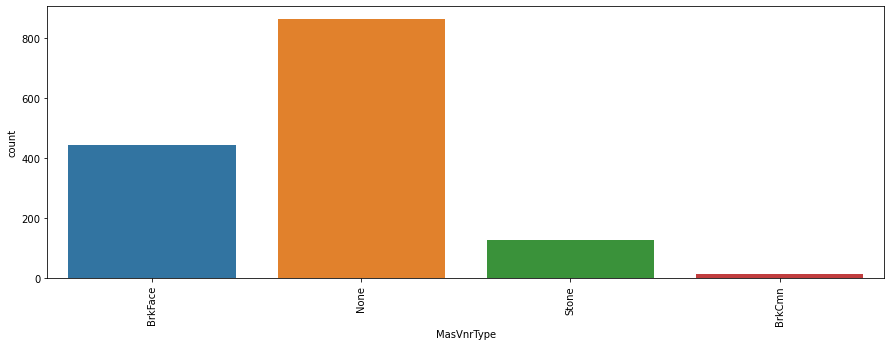

Categorical Sub-Class Value Counts -  BsmtQual
TA     44.452055
Gd     42.328767
Ex      8.287671
NaN     2.534247
Fa      2.397260
Name: BsmtQual, dtype: float64


CountPlot for -  BsmtQual




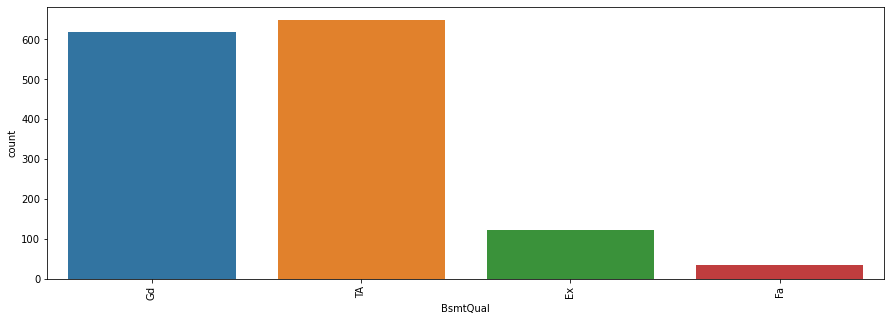

Categorical Sub-Class Value Counts -  BsmtCond
TA     89.794521
Gd      4.452055
Fa      3.082192
NaN     2.534247
Po      0.136986
Name: BsmtCond, dtype: float64


CountPlot for -  BsmtCond




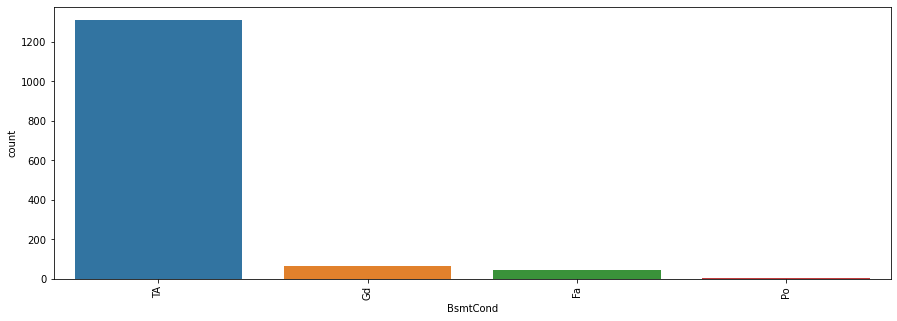

Categorical Sub-Class Value Counts -  BsmtExposure
No     65.273973
Av     15.136986
Gd      9.178082
Mn      7.808219
NaN     2.602740
Name: BsmtExposure, dtype: float64


CountPlot for -  BsmtExposure




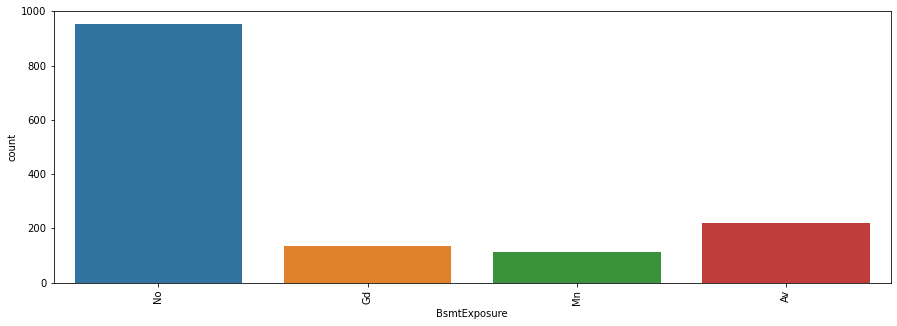

Categorical Sub-Class Value Counts -  BsmtFinType1
Unf    29.452055
GLQ    28.630137
ALQ    15.068493
BLQ    10.136986
Rec     9.109589
LwQ     5.068493
NaN     2.534247
Name: BsmtFinType1, dtype: float64


CountPlot for -  BsmtFinType1




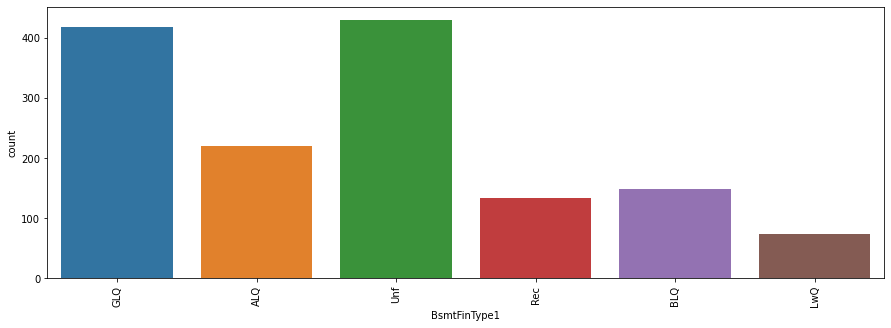

Categorical Sub-Class Value Counts -  BsmtFinType2
Unf    86.027397
Rec     3.698630
LwQ     3.150685
NaN     2.602740
BLQ     2.260274
ALQ     1.301370
GLQ     0.958904
Name: BsmtFinType2, dtype: float64


CountPlot for -  BsmtFinType2




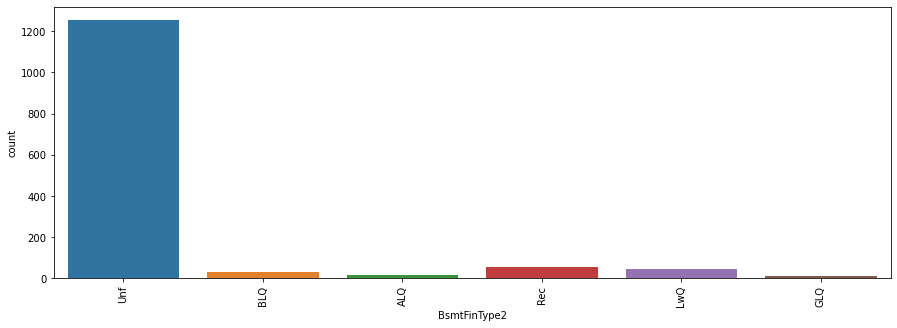

Categorical Sub-Class Value Counts -  Electrical
SBrkr    91.369863
FuseA     6.438356
FuseF     1.849315
FuseP     0.205479
Mix       0.068493
NaN       0.068493
Name: Electrical, dtype: float64


CountPlot for -  Electrical




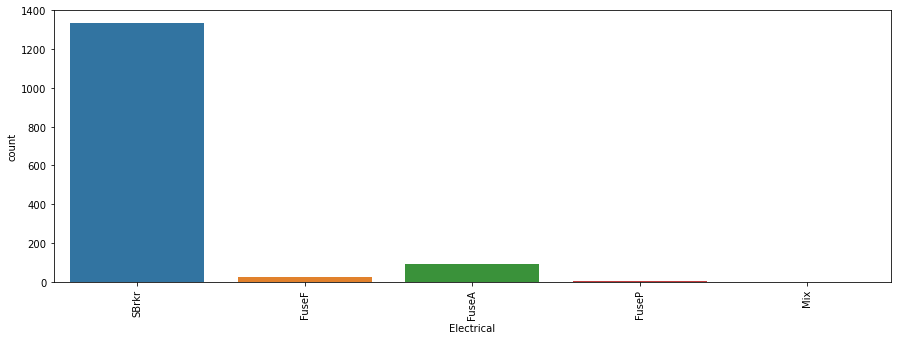

Categorical Sub-Class Value Counts -  GarageType
Attchd     59.589041
Detchd     26.506849
BuiltIn     6.027397
NaN         5.547945
Basment     1.301370
CarPort     0.616438
2Types      0.410959
Name: GarageType, dtype: float64


CountPlot for -  GarageType




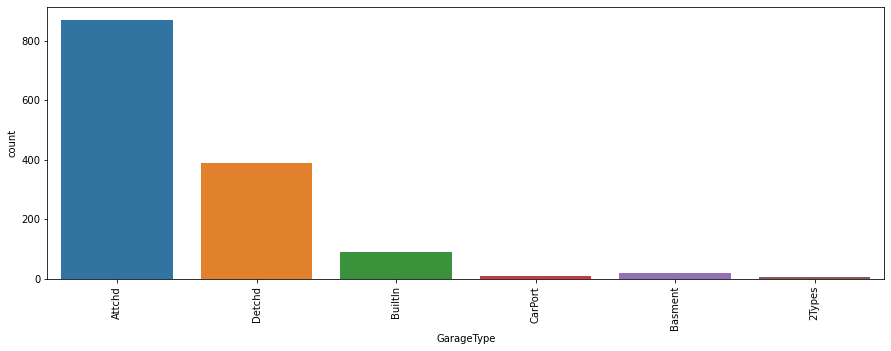

Categorical Sub-Class Value Counts -  GarageFinish
Unf    41.438356
RFn    28.904110
Fin    24.109589
NaN     5.547945
Name: GarageFinish, dtype: float64


CountPlot for -  GarageFinish




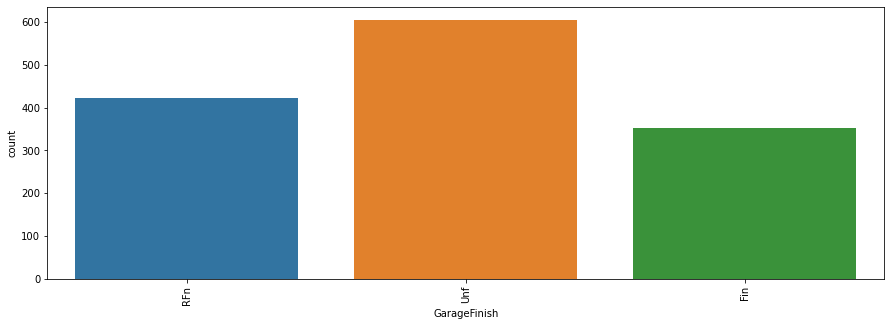

Categorical Sub-Class Value Counts -  GarageQual
TA     89.794521
NaN     5.547945
Fa      3.287671
Gd      0.958904
Po      0.205479
Ex      0.205479
Name: GarageQual, dtype: float64


CountPlot for -  GarageQual




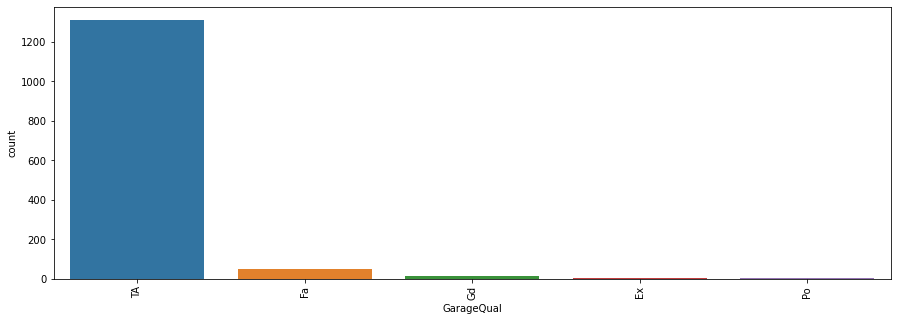

Categorical Sub-Class Value Counts -  GarageCond
TA     90.821918
NaN     5.547945
Fa      2.397260
Gd      0.616438
Po      0.479452
Ex      0.136986
Name: GarageCond, dtype: float64


CountPlot for -  GarageCond




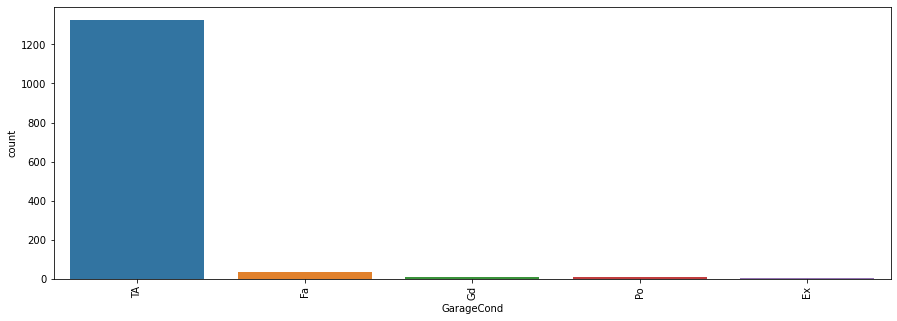

In [16]:
# Lets print the value counts & Count plot for all the columns with missig values > 0

for col in housing_dataset.select_dtypes('object').columns:
    if ((housing_dataset[col].isnull().sum()/len(housing_dataset.index)* 100) > 0):
        categorical_value_counts(col)

In [17]:
# Replace/ impute all the missing values for Continuous columns with the mean values
housing_dataset['LotFrontage'].fillna(housing_dataset['LotFrontage'].mean(), inplace = True)
housing_dataset['MasVnrArea'].fillna(housing_dataset['MasVnrArea'].mean(), inplace = True)
housing_dataset['GarageYrBlt'].fillna(housing_dataset['GarageYrBlt'].median(), inplace = True)

# Replace/ impute Nan , No & None for Categorical columns with "No_Column_name':

housing_dataset['MasVnrType'].fillna(housing_dataset['MasVnrType'][0], inplace = True)
housing_dataset['BsmtQual'].fillna('No_Basement', inplace = True)
housing_dataset['BsmtCond'].fillna('No_Basement', inplace = True)
housing_dataset['BsmtExposure'].fillna('No_Basement', inplace = True)
housing_dataset['BsmtFinType1'].fillna('No_Basement', inplace = True)
housing_dataset['BsmtFinType2'].fillna('No_Basement', inplace = True)

housing_dataset['Electrical'].fillna(housing_dataset['Electrical'].mode()[0], inplace = True)

housing_dataset['GarageType'].fillna('No_Garage', inplace = True)
housing_dataset['GarageFinish'].fillna('No_Garage', inplace = True)
housing_dataset['GarageQual'].fillna('No_Garage', inplace = True)
housing_dataset['GarageCond'].fillna('No_Garage', inplace = True)

In [18]:
# Lets check the missing values count after imputation

round((housing_dataset.isnull().sum()/len(housing_dataset.index)* 100),2).sort_values(ascending = False)

SalePrice        0.0
ExterCond        0.0
RoofStyle        0.0
RoofMatl         0.0
Exterior1st      0.0
Exterior2nd      0.0
MasVnrType       0.0
MasVnrArea       0.0
ExterQual        0.0
Foundation       0.0
SaleCondition    0.0
BsmtQual         0.0
BsmtCond         0.0
BsmtExposure     0.0
BsmtFinType1     0.0
BsmtFinSF1       0.0
BsmtFinType2     0.0
BsmtFinSF2       0.0
YearRemodAdd     0.0
YearBuilt        0.0
OverallCond      0.0
OverallQual      0.0
MSSubClass       0.0
MSZoning         0.0
LotFrontage      0.0
LotArea          0.0
Street           0.0
LotShape         0.0
LandContour      0.0
Utilities        0.0
LotConfig        0.0
LandSlope        0.0
Neighborhood     0.0
Condition1       0.0
Condition2       0.0
BldgType         0.0
HouseStyle       0.0
BsmtUnfSF        0.0
TotalBsmtSF      0.0
Heating          0.0
GarageYrBlt      0.0
GarageCars       0.0
GarageArea       0.0
GarageQual       0.0
GarageCond       0.0
PavedDrive       0.0
WoodDeckSF       0.0
OpenPorchSF  

#### Let's check the Duplicated records count 

In [19]:
# Lets check the Duplicate values in the dataset
housing_dataset.duplicated().sum()

0

No duplicated records are present in the housing dataset

#### Lets check the value counts for all categorical columns to drop the highly Skewed columns above 99% or combine the sub classes less than 1% to one category

In [20]:
def categorical_col_value_counts(col):
    # To print the value counts including null counts for each category
    print("Categorical Sub-Class Value Counts - ", col)
    print(housing_dataset[col].value_counts(dropna = False , normalize = True) * 100)
    print("\n")

In [21]:
categorical_columns = housing_dataset.select_dtypes('object').columns
for col in categorical_columns:
    categorical_col_value_counts(col)

Categorical Sub-Class Value Counts -  MSZoning
RL         78.835616
RM         14.931507
FV          4.452055
RH          1.095890
C (all)     0.684932
Name: MSZoning, dtype: float64


Categorical Sub-Class Value Counts -  Street
Pave    99.589041
Grvl     0.410959
Name: Street, dtype: float64


Categorical Sub-Class Value Counts -  LotShape
Reg    63.356164
IR1    33.150685
IR2     2.808219
IR3     0.684932
Name: LotShape, dtype: float64


Categorical Sub-Class Value Counts -  LandContour
Lvl    89.794521
Bnk     4.315068
HLS     3.424658
Low     2.465753
Name: LandContour, dtype: float64


Categorical Sub-Class Value Counts -  Utilities
AllPub    99.931507
NoSeWa     0.068493
Name: Utilities, dtype: float64


Categorical Sub-Class Value Counts -  LotConfig
Inside     72.054795
Corner     18.013699
CulDSac     6.438356
FR2         3.219178
FR3         0.273973
Name: LotConfig, dtype: float64


Categorical Sub-Class Value Counts -  LandSlope
Gtl    94.657534
Mod     4.452055
Sev     0.

#### Lets combine subclass less than 1% as Other_Category

In [22]:
housing_dataset['Neighborhood'].replace(['ClearCr', 'SWISU', 'StoneBr', 'Blmngtn' , 'MeadowV' , 'BrDale' , 
                                         'Veenker','NPkVill', 'Blueste'] , 'Other_Neighborhood' , inplace = True)
housing_dataset['Condition1'].replace(['RRAe' , 'PosA' , 'RRNn' , 'RRNe'] , 'Other_Condition1' , inplace = True)
housing_dataset['Condition2'].replace(['Feedr' , 'RRNn' , 'Artery' , 'PosN' , 'PosA' , 'RRAe' , 'RRAn'] , 
                                      'Other_Condition2' , inplace = True)
housing_dataset['HouseStyle'].replace(['1.5Unf' , '2.5Unf' , '2.5Fin'] , 'Other_HouseStyle' , inplace = True)
housing_dataset['RoofStyle'].replace(['Flat' , 'Gambrel' , 'Mansard' , 'Shed'] , 'Other_RoofStyle' , inplace = True)
housing_dataset['RoofMatl'].replace(['Tar&Grv' , 'WdShngl' , 'WdShake' , 'Metal' , 'ClyTile' , 'Roll' , 'Membran'] ,
                                    'Other_RoofMatl' , inplace = True)
housing_dataset['Exterior1st'].replace(['Stone' , 'BrkComm' , 'CBlock' , 'ImStucc' , 'AsphShn'] ,
                                    'Other_Exterior1st' , inplace = True)
housing_dataset['Exterior2nd'].replace(['ImStucc' , 'Brk Cmn' , 'Stone' , 'AsphShn' , 'CBlock' , 'Other'] ,
                                    'Other_Exterior2nd' , inplace = True)
housing_dataset['ExterCond'].replace(['Ex' , 'Po'] , 'Other_ExterCond' , inplace = True)
housing_dataset['Foundation'].replace(['Stone' , 'Wood'] , 'Other_Foundation' , inplace = True)
housing_dataset['Heating'].replace(['Grav' , 'Wall' , 'OthW' , 'Floor'] , 'Other_Heating' , inplace = True)
housing_dataset['Electrical'].replace(['FuseP' , 'Mix'] , 'Other_ElectricalHeating' , inplace = True)
housing_dataset['Functional'].replace(['Maj1' , 'Maj2' , 'Sev'] , 'Other_Functional' , inplace = True)
housing_dataset['GarageType'].replace(['CarPort' , '2Types'] , 'Other_GarageType' , inplace = True)
housing_dataset['GarageQual'].replace(['Gd' , 'Po' , 'Ex'] , 'Other_GarageQual' , inplace = True)
housing_dataset['GarageCond'].replace(['Gd' , 'Po' , 'Ex'] , 'Other_GarageCond' , inplace = True)
housing_dataset['SaleType'].replace(['ConLD' , 'ConLI' , 'ConLw' , 'CWD' , 'Oth' , 'Con'] , 
                                    'Other_SaleType' , inplace = True)
housing_dataset['SaleCondition'].replace(['Alloca' , 'AdjLand'] , 'Other_SaleCondition' , inplace = True)

In [23]:
categorical_columns = housing_dataset.select_dtypes('object').columns
for col in categorical_columns:
    categorical_col_value_counts(col)

Categorical Sub-Class Value Counts -  MSZoning
RL         78.835616
RM         14.931507
FV          4.452055
RH          1.095890
C (all)     0.684932
Name: MSZoning, dtype: float64


Categorical Sub-Class Value Counts -  Street
Pave    99.589041
Grvl     0.410959
Name: Street, dtype: float64


Categorical Sub-Class Value Counts -  LotShape
Reg    63.356164
IR1    33.150685
IR2     2.808219
IR3     0.684932
Name: LotShape, dtype: float64


Categorical Sub-Class Value Counts -  LandContour
Lvl    89.794521
Bnk     4.315068
HLS     3.424658
Low     2.465753
Name: LandContour, dtype: float64


Categorical Sub-Class Value Counts -  Utilities
AllPub    99.931507
NoSeWa     0.068493
Name: Utilities, dtype: float64


Categorical Sub-Class Value Counts -  LotConfig
Inside     72.054795
Corner     18.013699
CulDSac     6.438356
FR2         3.219178
FR3         0.273973
Name: LotConfig, dtype: float64


Categorical Sub-Class Value Counts -  LandSlope
Gtl    94.657534
Mod     4.452055
Sev     0.

#### Lets create list to drop highly skewed columns 

In [24]:
# Create a list of highly skewed columns above 99% as skewed_cols
skewed_cols = ['Street', 'Utilities' ]

In [25]:
# Drop the skewed columns from the dataset
housing_dataset.drop(skewed_cols , axis = 1 , inplace = True)

#### Converting year columns to age columns

In [26]:
housing_dataset.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Reg,Lvl,FR2,Gtl,Other_Neighborhood,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,IR1,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,IR1,Lvl,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,IR1,Lvl,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000


####  Lets convert the 'YearBuilt' , 'YearRemodAdd', 'GarageYrBlt' , 'YrSold' to age as per the current yeat 2021

In [27]:
housing_dataset['YearBuilt'] = 2021 - housing_dataset['YearBuilt']
housing_dataset['YearRemodAdd'] = 2021 - housing_dataset['YearRemodAdd']
housing_dataset['GarageYrBlt'] = 2021 - housing_dataset['GarageYrBlt']
housing_dataset['YrSold'] = 2021 - housing_dataset['YrSold']

#### Converting ordinal type continuous variables to Categorical

In [28]:
# Creating a list for all the Variablesto be converted to categorical
variables_conversion = ['MSSubClass', 'OverallQual' , 'OverallCond', 'BsmtFullBath','BsmtHalfBath','FullBath',
                       'HalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageCars']

# Converting the columns to 'object' type
for col in variables_conversion:
    housing_dataset[col] = housing_dataset[col].astype('object')

In [29]:
housing_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 74 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   object 
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1460 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   LotShape       1460 non-null   object 
 6   LandContour    1460 non-null   object 
 7   LotConfig      1460 non-null   object 
 8   LandSlope      1460 non-null   object 
 9   Neighborhood   1460 non-null   object 
 10  Condition1     1460 non-null   object 
 11  Condition2     1460 non-null   object 
 12  BldgType       1460 non-null   object 
 13  HouseStyle     1460 non-null   object 
 14  OverallQual    1460 non-null   object 
 15  OverallCond    1460 non-null   object 
 16  YearBuilt      1460 non-null   int64  
 17  YearRemodAdd   1460 non-null   int64  
 18  RoofStyl

#### Check for Outliers

In [30]:
# Lets create a function for boxplot 

def outliers_check(col_name):
    # Box Plot Function
    print(col, "- Boxplot")
    print("\n")
    plt.figure(figsize = (15,5))
    sns.boxplot(housing_dataset[col])
    plt.xticks(rotation = 90)
    plt.show() 

Id - Boxplot




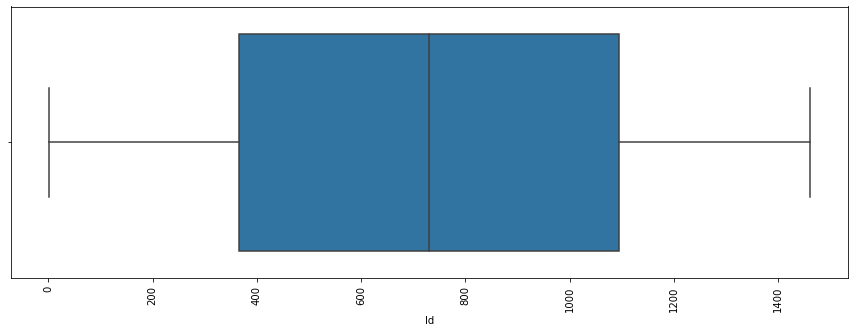

LotFrontage - Boxplot




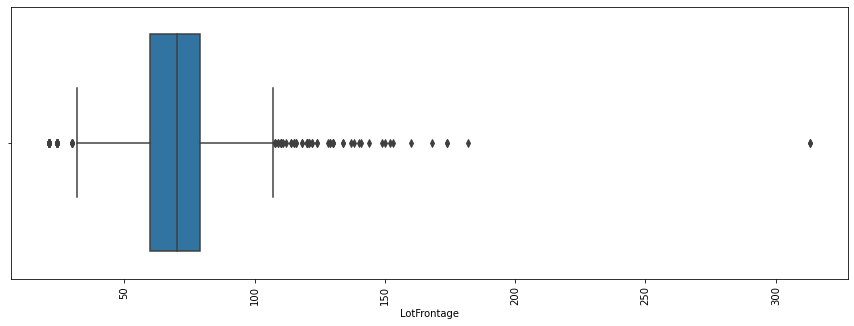

LotArea - Boxplot




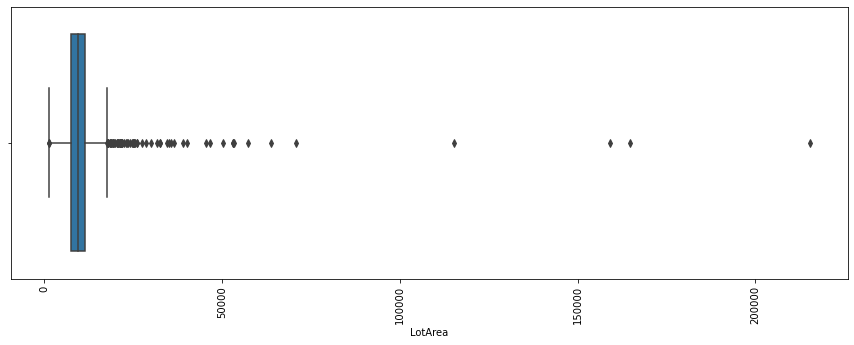

YearBuilt - Boxplot




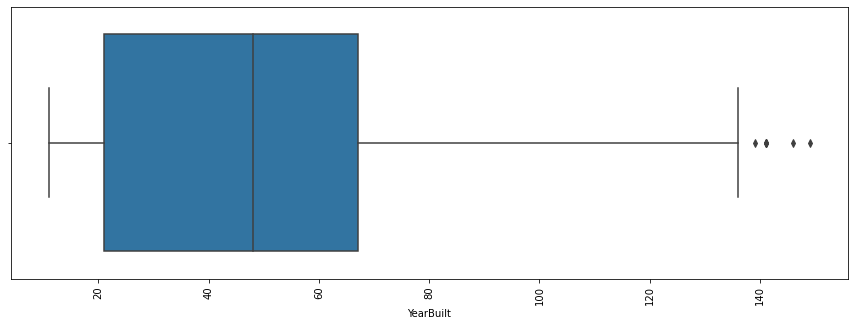

YearRemodAdd - Boxplot




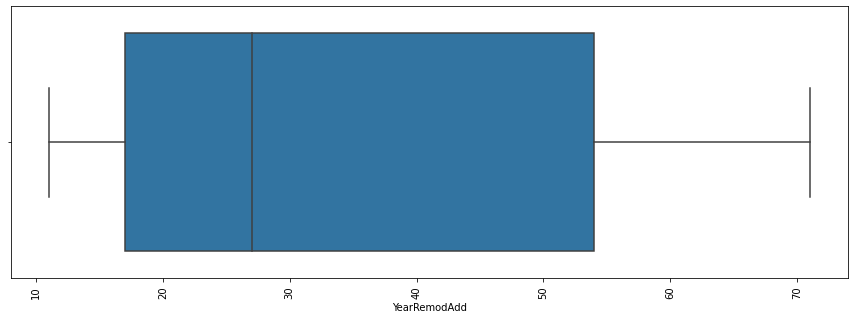

MasVnrArea - Boxplot




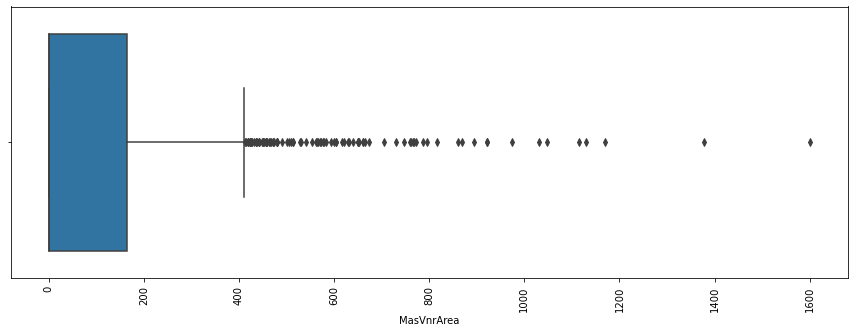

BsmtFinSF1 - Boxplot




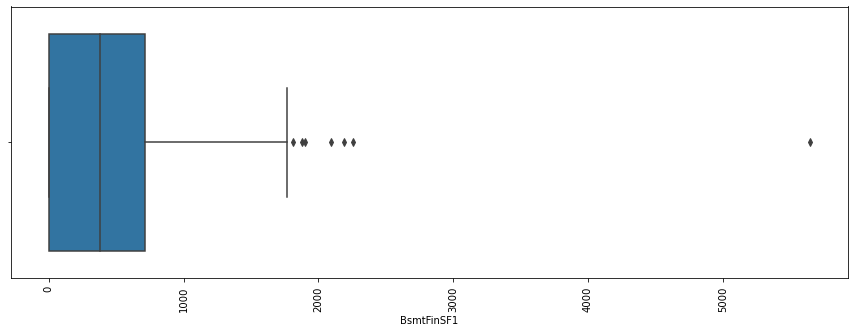

BsmtFinSF2 - Boxplot




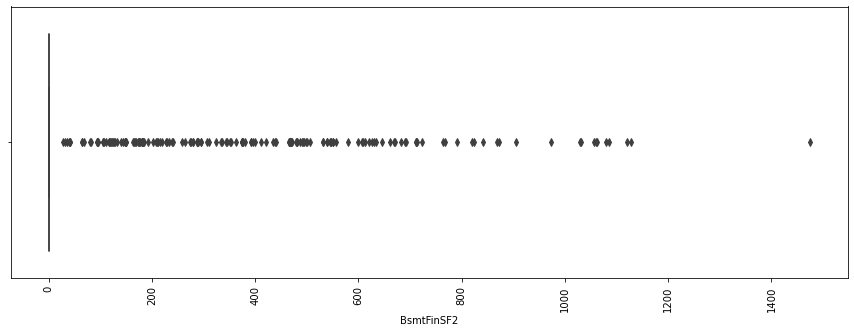

BsmtUnfSF - Boxplot




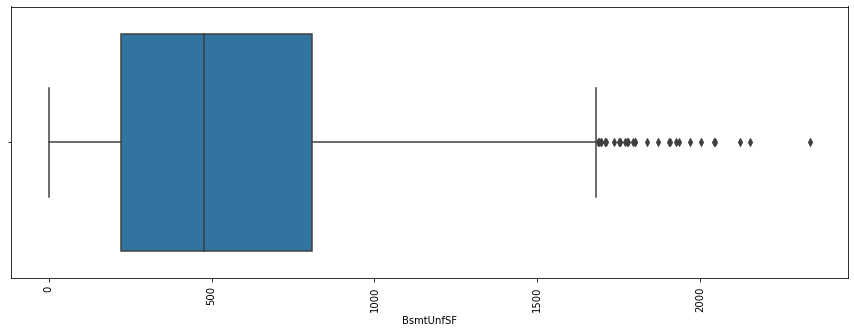

TotalBsmtSF - Boxplot




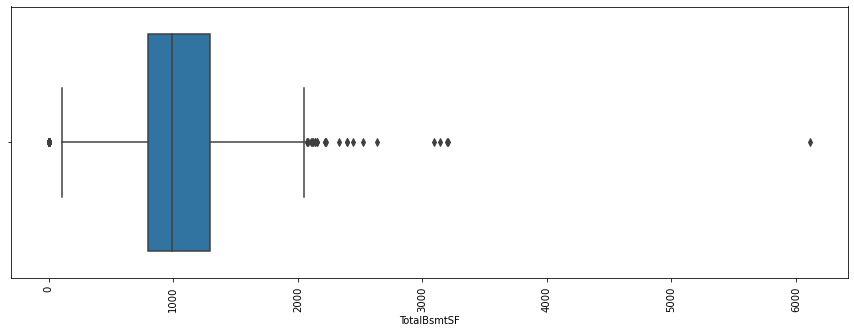

1stFlrSF - Boxplot




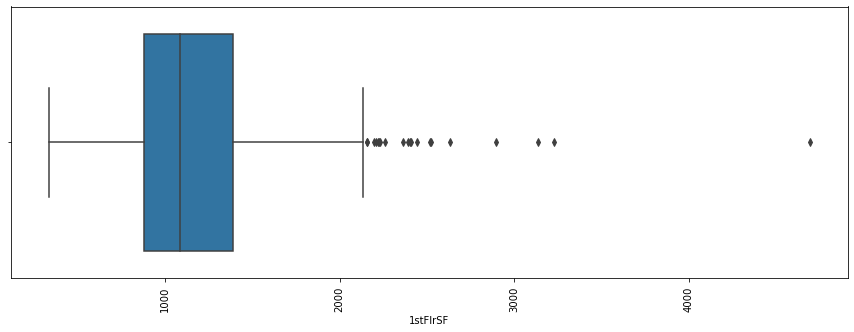

2ndFlrSF - Boxplot




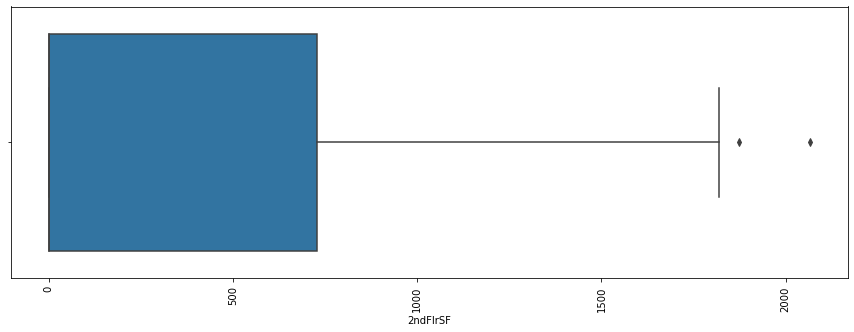

LowQualFinSF - Boxplot




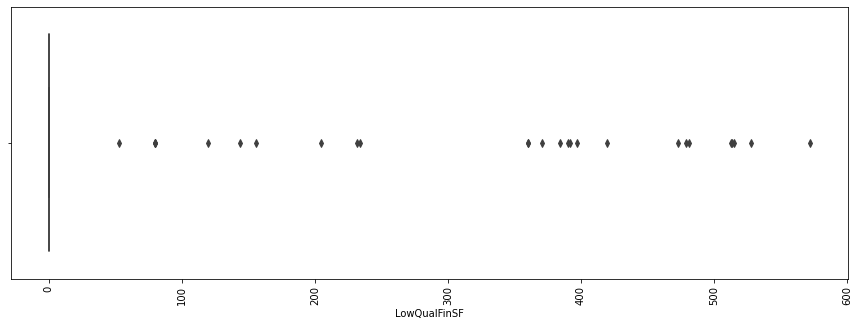

GrLivArea - Boxplot




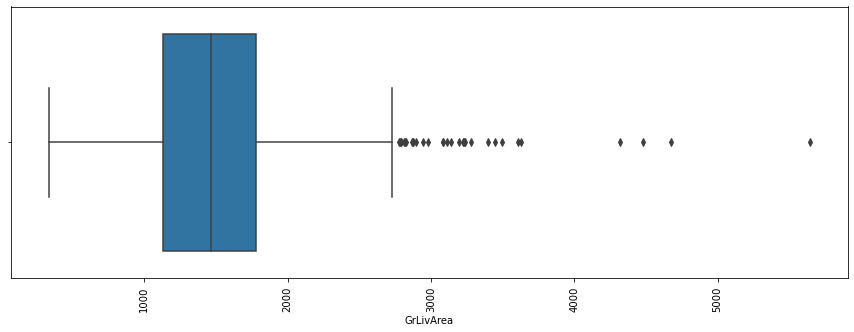

GarageYrBlt - Boxplot




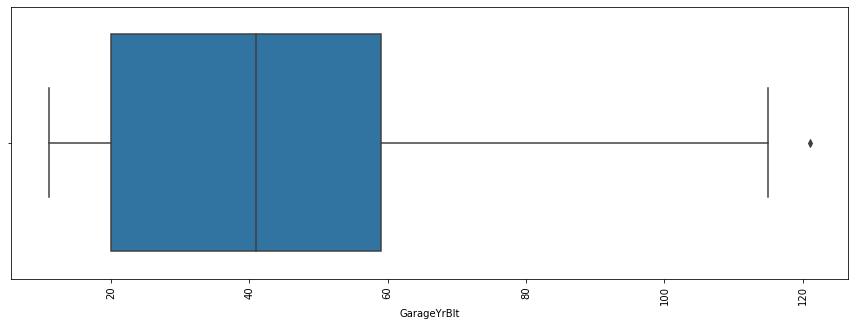

GarageArea - Boxplot




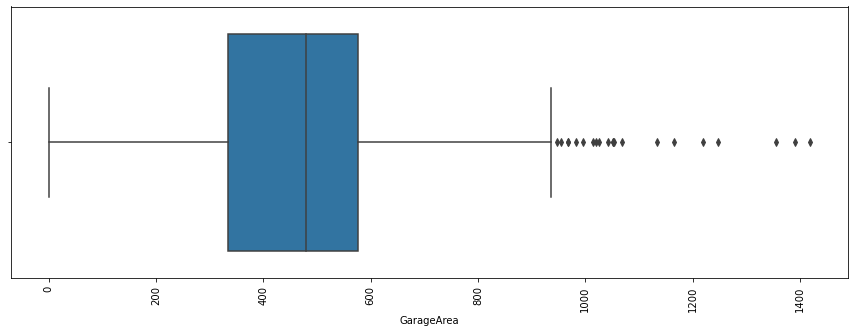

WoodDeckSF - Boxplot




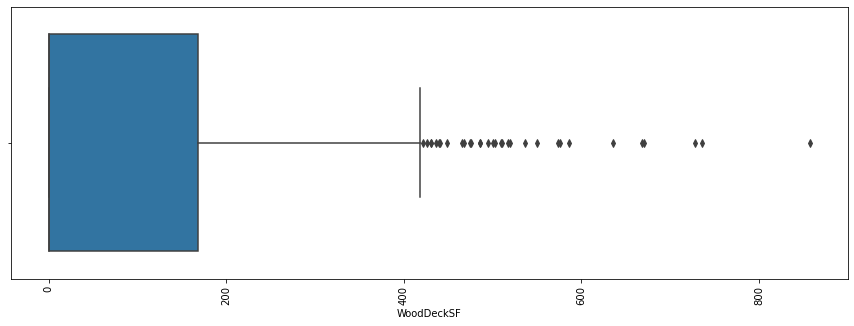

OpenPorchSF - Boxplot




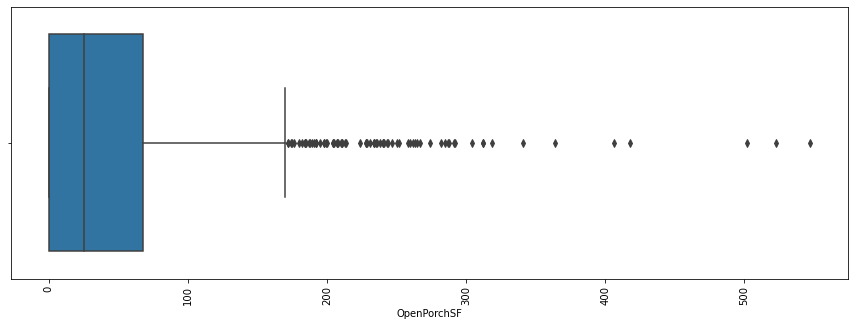

EnclosedPorch - Boxplot




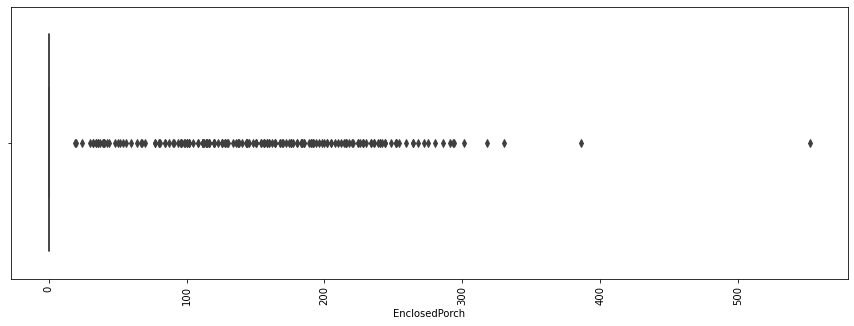

3SsnPorch - Boxplot




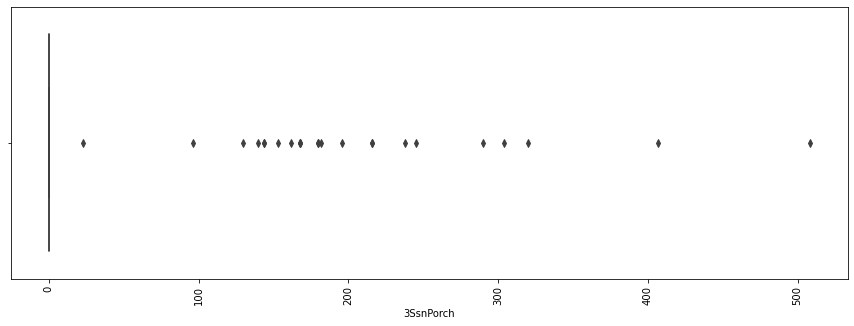

ScreenPorch - Boxplot




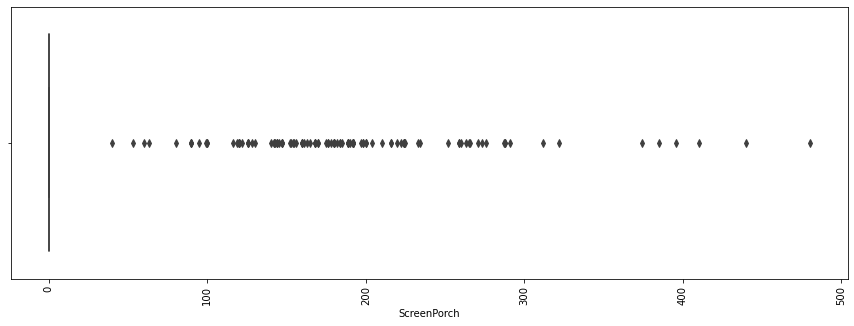

PoolArea - Boxplot




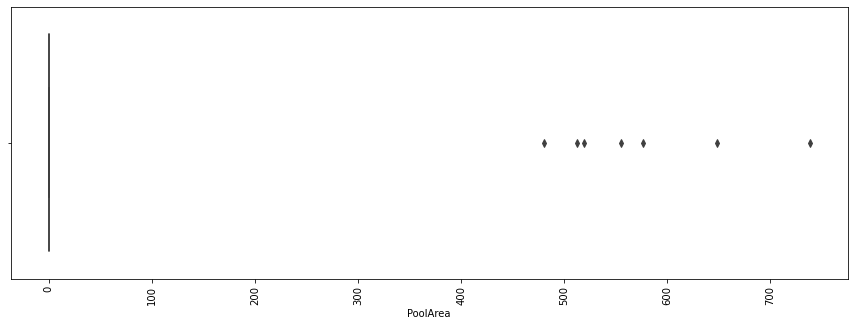

MiscVal - Boxplot




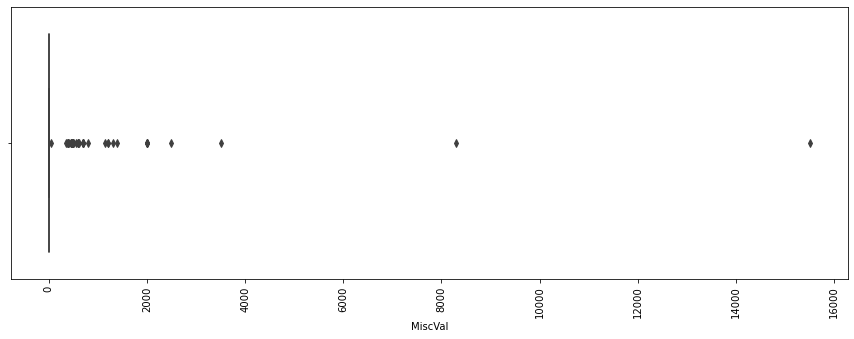

MoSold - Boxplot




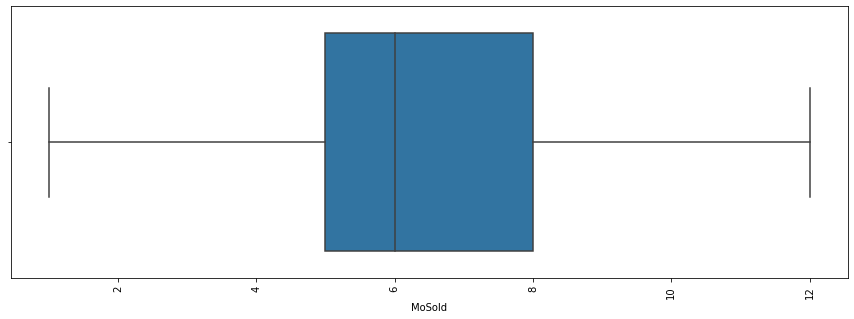

YrSold - Boxplot




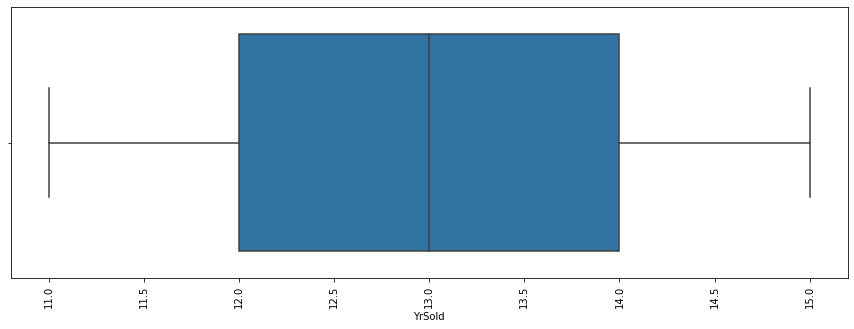

SalePrice - Boxplot




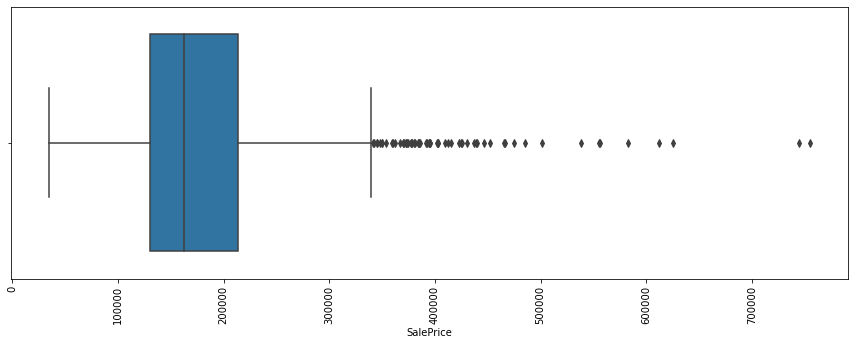

In [31]:
# Lets check Outliers by plotting box plot
continuous_cols = housing_dataset.select_dtypes('number').columns

for col in continuous_cols:
    outliers_check(col)

#### Observations:
- Outliers present for -LotFrontage,LotArea,YearBuilt,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageYrBlt,GarageArea ,WoodDeckSF,OpenPorchSF, EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea ,MiscVal,MoSold,SalePrice

- No Outliers - YearRemodAdd,YrSold

- Outliers for the continuous variables will be handled by the Scaler.
- Target variable SalesPrice has outliers & needs to be handled by log transformation as in real time the housing prices dynamically changes.

In [32]:
housing_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 74 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   object 
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1460 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   LotShape       1460 non-null   object 
 6   LandContour    1460 non-null   object 
 7   LotConfig      1460 non-null   object 
 8   LandSlope      1460 non-null   object 
 9   Neighborhood   1460 non-null   object 
 10  Condition1     1460 non-null   object 
 11  Condition2     1460 non-null   object 
 12  BldgType       1460 non-null   object 
 13  HouseStyle     1460 non-null   object 
 14  OverallQual    1460 non-null   object 
 15  OverallCond    1460 non-null   object 
 16  YearBuilt      1460 non-null   int64  
 17  YearRemodAdd   1460 non-null   int64  
 18  RoofStyl

In [33]:
housing_dataset.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,18,18,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Attchd,18.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,13,WD,Normal,208500
1,2,20,RL,80.0,9600,Reg,Lvl,FR2,Gtl,Other_Neighborhood,Feedr,Norm,1Fam,1Story,6,8,45,45,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,Attchd,45.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,14,WD,Normal,181500
2,3,60,RL,68.0,11250,IR1,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,20,19,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,Attchd,20.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,13,WD,Normal,223500
3,4,70,RL,60.0,9550,IR1,Lvl,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,106,51,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Detchd,23.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,15,WD,Abnorml,140000
4,5,60,RL,84.0,14260,IR1,Lvl,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,21,21,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,Attchd,21.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,13,WD,Normal,250000


## 4. Exploratory Data Analysis

### Univariate Analysis 

#### Target Variable - 'SalesPrice' distribution plot

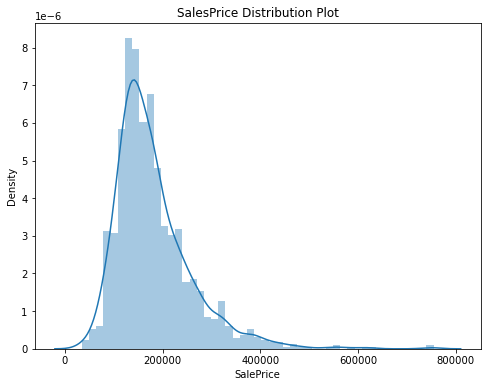

In [34]:
plt.figure(figsize = (8,6))
plt.title("SalesPrice Distribution Plot")
sns.distplot(housing_dataset['SalePrice'])
plt.show()

Target variable SalesPrice is right skewed and needs to transformed.

#### Categorical Analysis

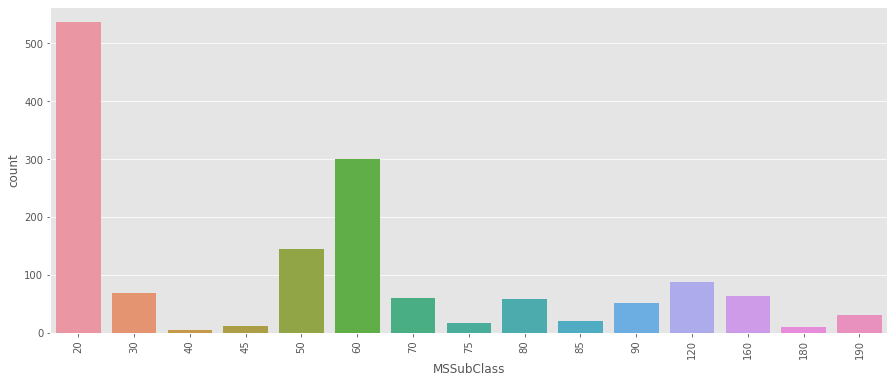

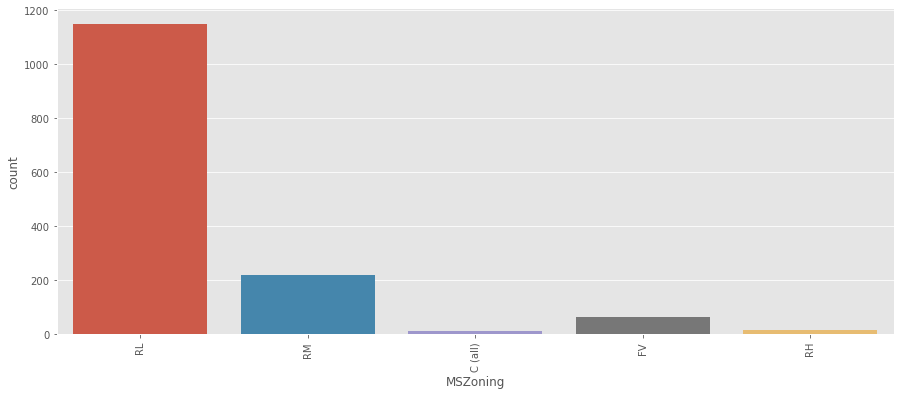

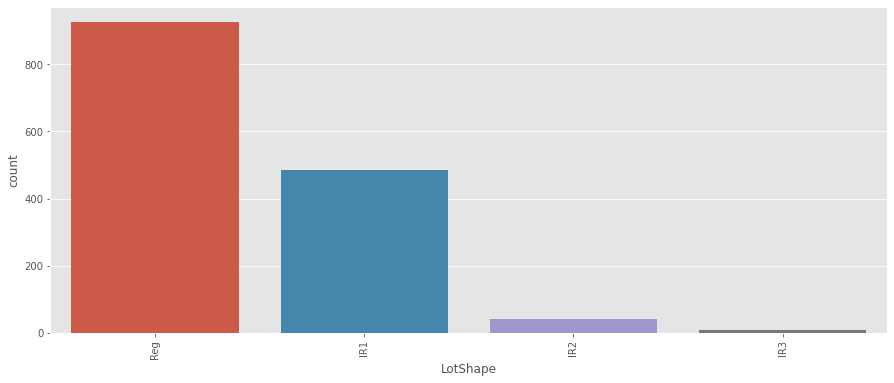

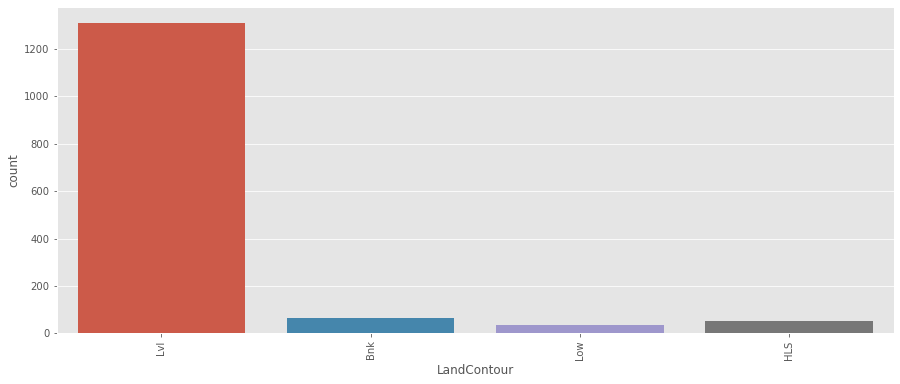

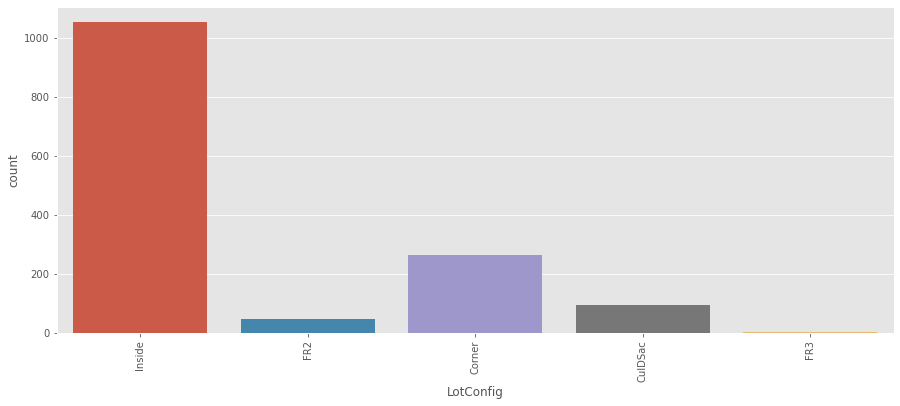

...

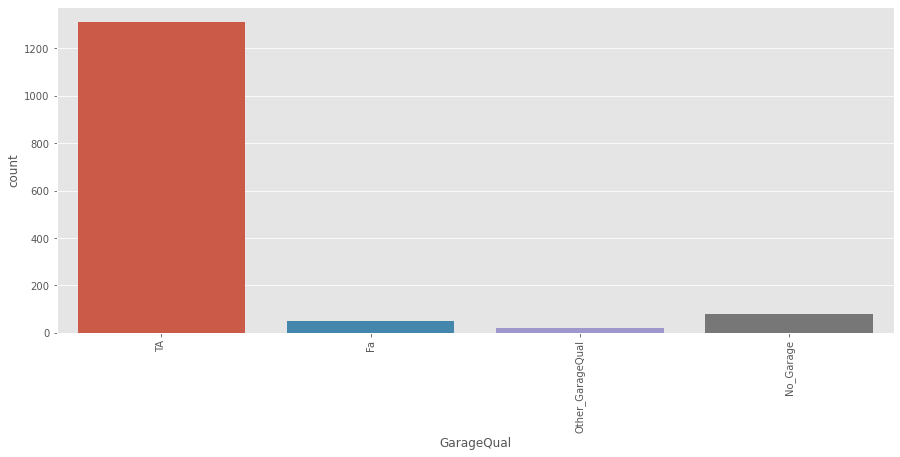

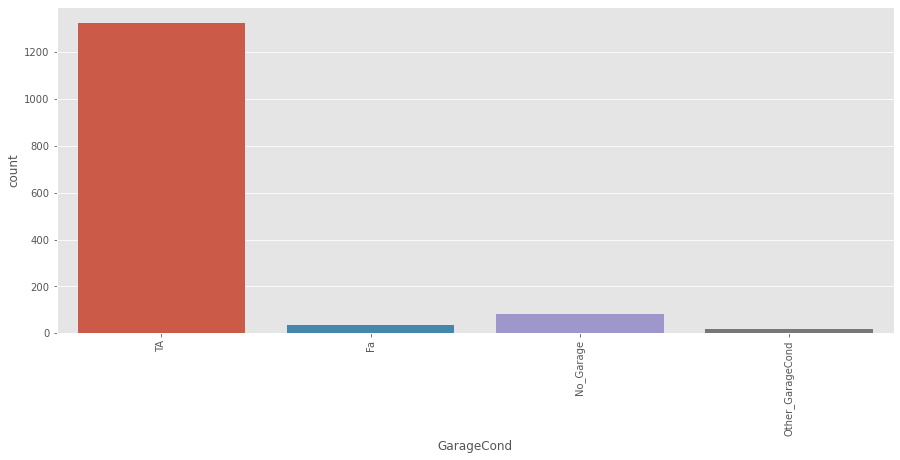

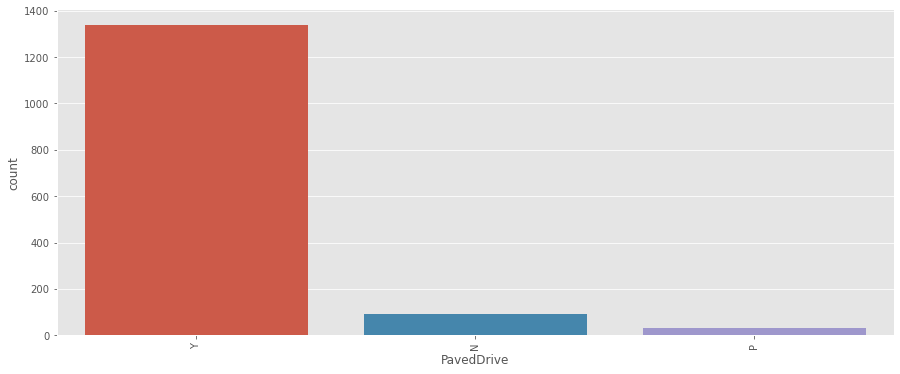

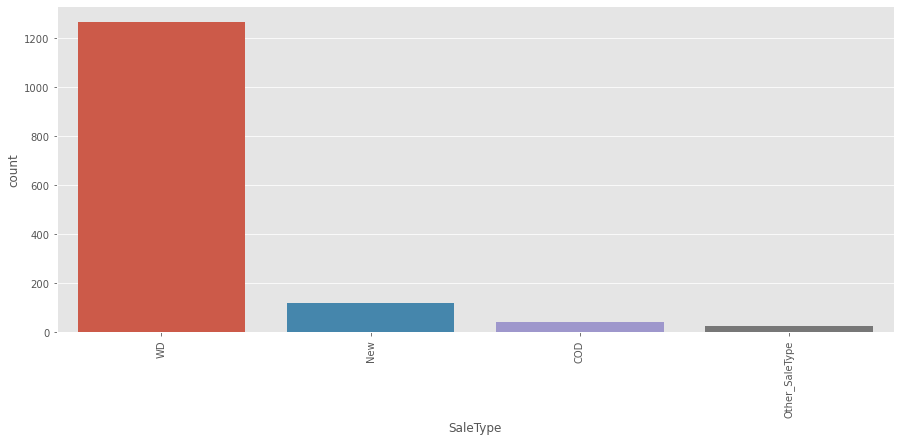

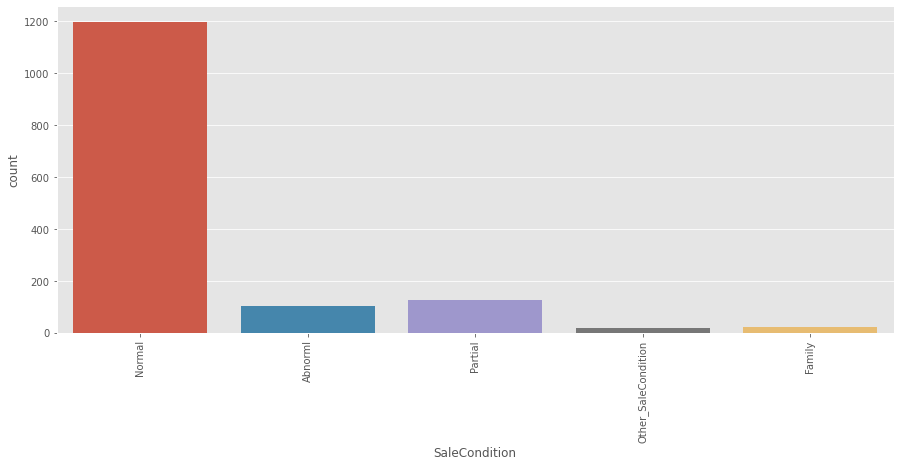

In [35]:
# Creating a function to plot categorical count plot

def univariate_countplot(col):
    
    plt.style.use('ggplot')
    plt.figure(figsize = (15,6))
    sns.countplot(housing_dataset[col])
    plt.xticks(rotation = 90)
    plt.show()

# lets print the coutplot for all tge categorical columns

for col in housing_dataset.select_dtypes('object').columns:
    univariate_countplot(col)

#### Observations:
- Most of the Houses are in 
- 'MSSubClass' are of subclass 20 - 1-STORY 1946 & NEWER ALL STYLES , 
- 'MSZoning' are 'RL' - Residential Low Density.
- 'LotShape' are 'Reg' - Regular
- 'Landcontour' are 'Lvl' - Near Flat Level.
- 'LotConfig' are 'Inside.
- 'LandSlope' is 'Gtl'- Gentle Slope.
- 'Neighbourhood is NAmes - North Ames
- 'Condition1' & 'Condition2' is Nom - Normal
-  BldgType is '1Fam' - Single-Family detatched
- 'HouseStyle' - 1Story
- 'OverallQual' is 5 - 'Average' , 'OverallCond' is 5 - 'Average'
- RoofStyle is Gable , RoofMtl is 'CompShg' - Standard (Composite) Shingle
- Exterior1st & Exterior2nd is VinylSd - Vinyl Siding
- MasVnrType is 'None'
- ExterQual ,ExterCond is TA - Average/ Typical
- Foundation is PConc is Poured Contrete
- BsmtQual, BsmtCond is Typical, BsmtExposure is No, BsmtFinType1,BsmtFinType2 is Unf - Unfinished
- Heating is GasA - Gas Forced Warm Air furnace
- Central Air - Yes
- Full Bath 2 is required
- Bedroom - 3, Kitchen - 1 & Kitchen Quality - TA
- GarageType - Attached, GarageFinish - Unf- Unfinished, GarageCars- 2, GarageQual & GarageCond- Typical, 
- PavedDrive- Yes,
- SaleType - WD- Warranty Deed (Conventional), Sale COndition - Normal

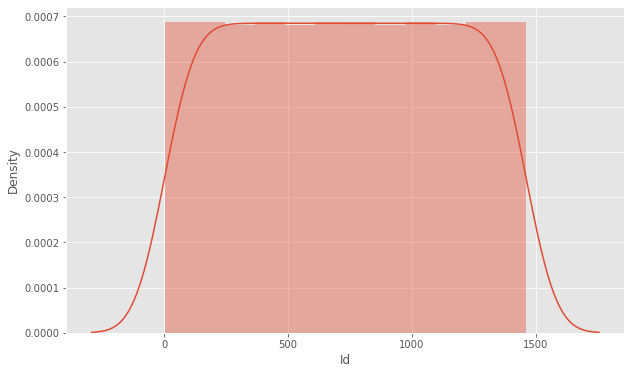

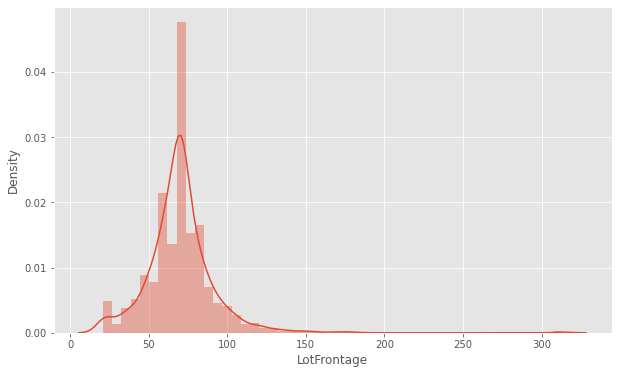

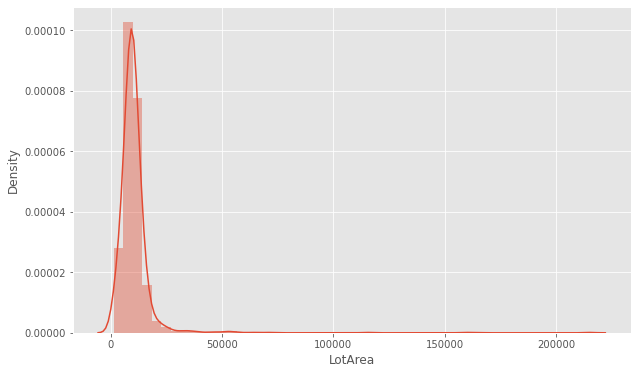

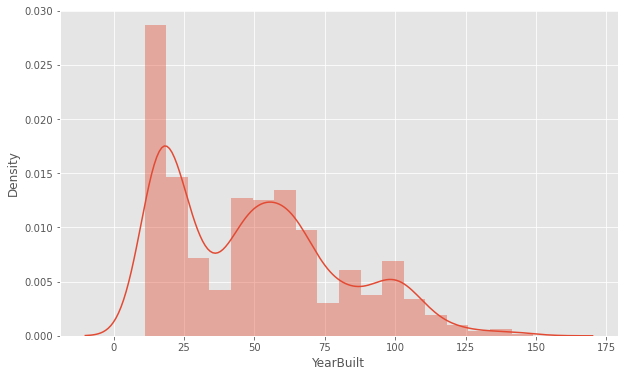

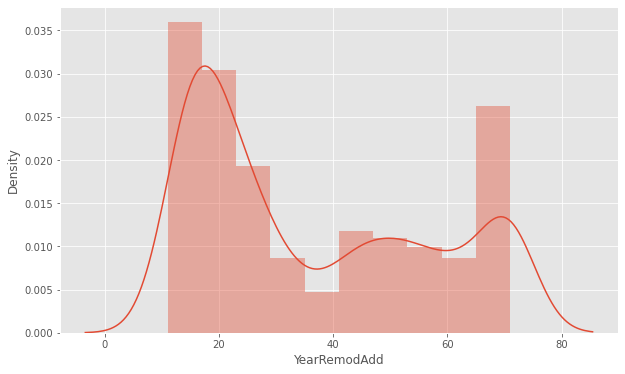

...

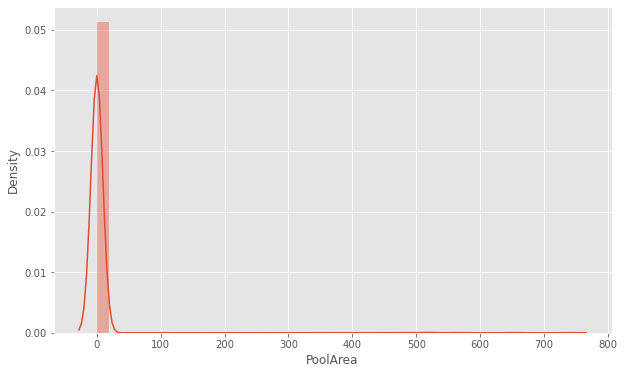

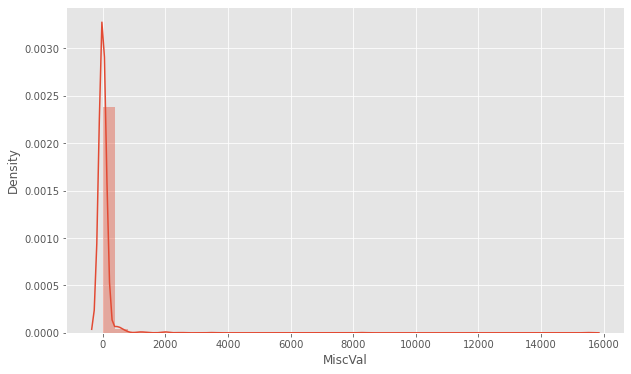

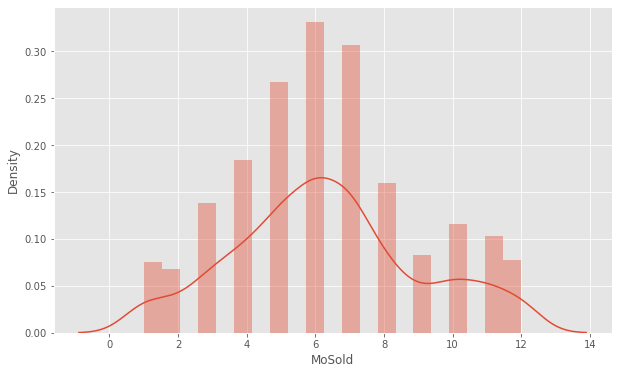

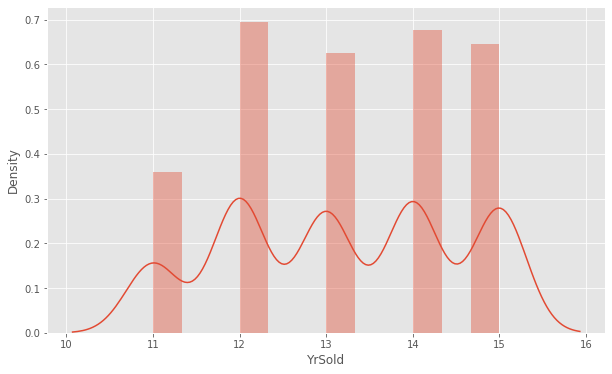

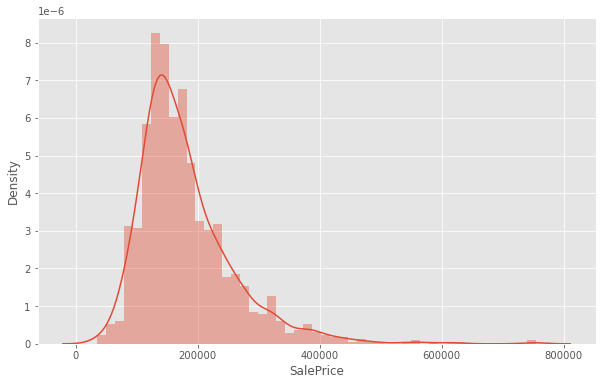

In [36]:
# Create function for distplot for Continuous Analysis

def univariate_distplot(col):
    plt.style.use('ggplot')
    plt.figure(figsize=(10,6))
    sns.distplot(housing_dataset[col])
    plt.show()
    
# Distplot for Continuous variables

for col in housing_dataset.select_dtypes('number').columns:
    univariate_distplot(col)

#### Observations:
##### Variables that are Right Skewed & Normally Distributed are 
- LotFrontage ,LotArea, BsmtFinSF2,BsmtUnfSF,1stFlrSF,LowQualFinSF,GrLivArea,OpenporchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea, MiscVal, SalePrice

##### Variables that are Right Skewed & Multimodal - YearBuilt,YearRemodAdd,MasVnrArea,GarageYrBlt,GarageArea, YrSold,
- Right Skewed & Bimodal - BsmtFinSF1,TotalBsmtSF,2ndFlrSF,WoodDeckSF

##### Variables that are Normally Distributed are
- MoSold

### Bivariate Analysis

#### Continuous-Continuous joint plot

-------------------------------------- Id - Jointplot--------------------------------------


<Figure size 576x432 with 0 Axes>

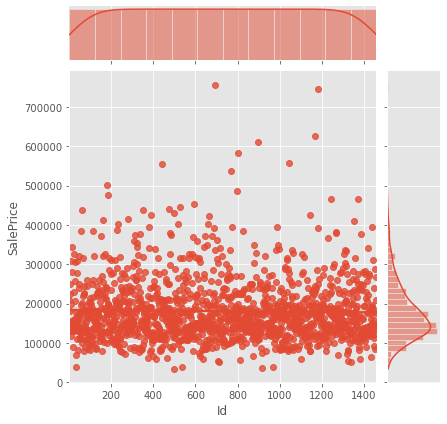

-------------------------------------- LotFrontage - Jointplot--------------------------------------


<Figure size 576x432 with 0 Axes>

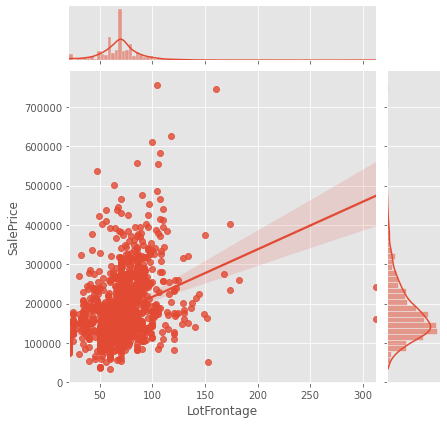

-------------------------------------- LotArea - Jointplot--------------------------------------


<Figure size 576x432 with 0 Axes>

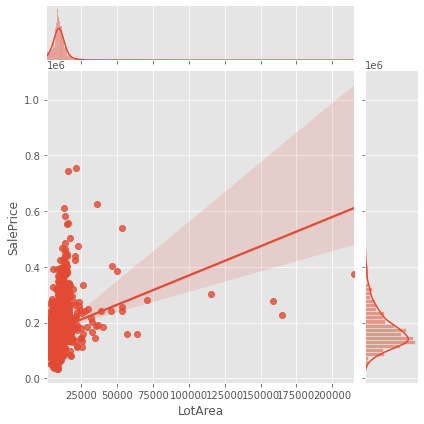

-------------------------------------- YearBuilt - Jointplot--------------------------------------


<Figure size 576x432 with 0 Axes>

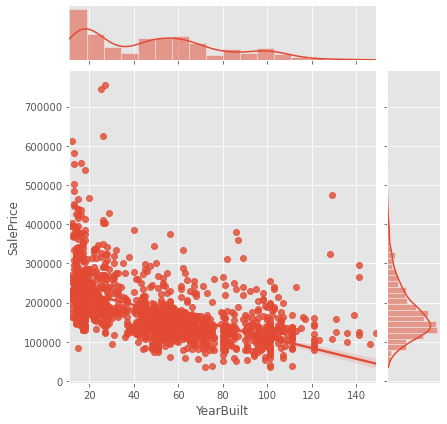

-------------------------------------- YearRemodAdd - Jointplot--------------------------------------


<Figure size 576x432 with 0 Axes>

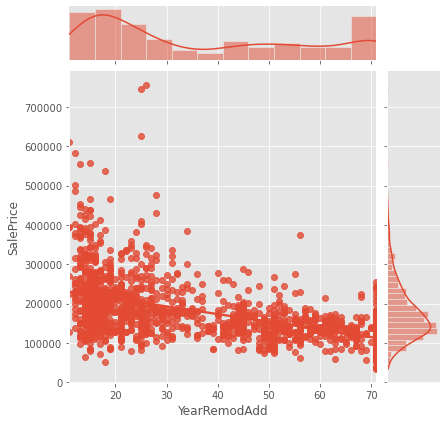

-------------------------------------- MasVnrArea - Jointplot--------------------------------------


<Figure size 576x432 with 0 Axes>

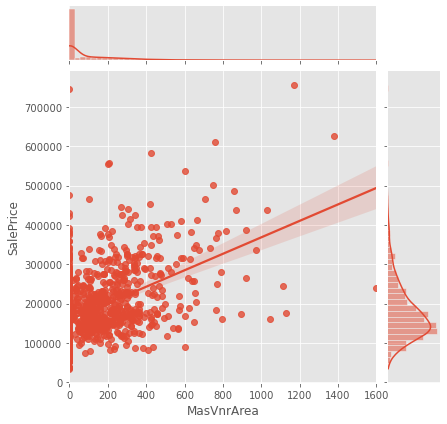

-------------------------------------- BsmtFinSF1 - Jointplot--------------------------------------


<Figure size 576x432 with 0 Axes>

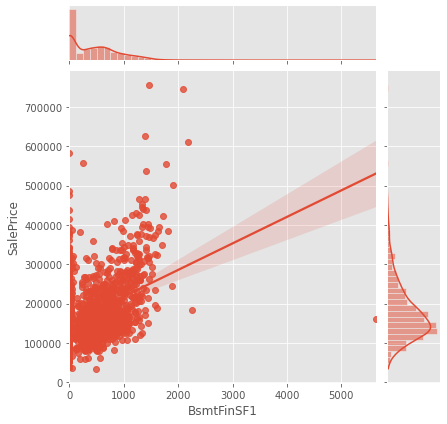

-------------------------------------- BsmtFinSF2 - Jointplot--------------------------------------


<Figure size 576x432 with 0 Axes>

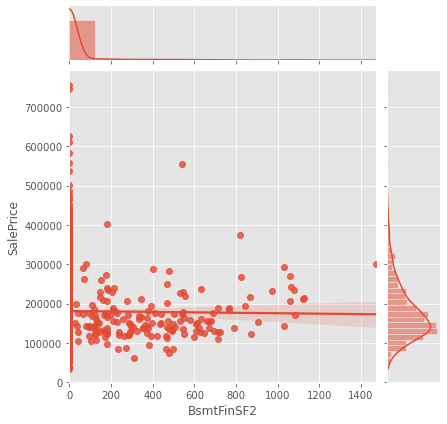

-------------------------------------- BsmtUnfSF - Jointplot--------------------------------------


<Figure size 576x432 with 0 Axes>

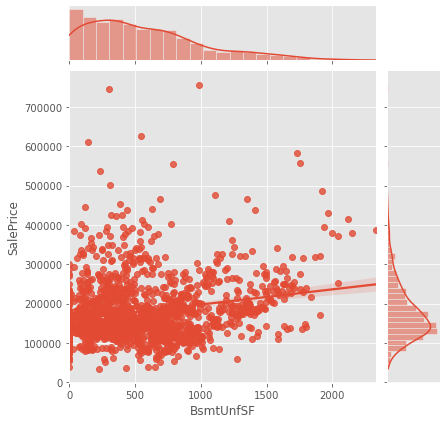

-------------------------------------- TotalBsmtSF - Jointplot--------------------------------------


<Figure size 576x432 with 0 Axes>

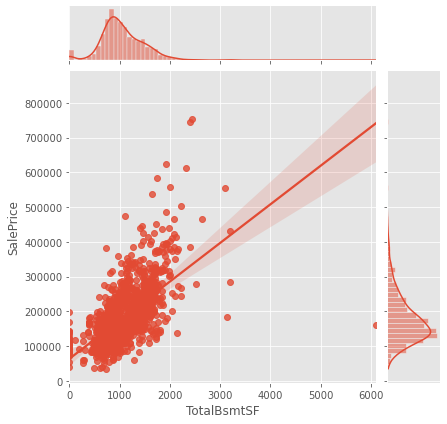

-------------------------------------- 1stFlrSF - Jointplot--------------------------------------


<Figure size 576x432 with 0 Axes>

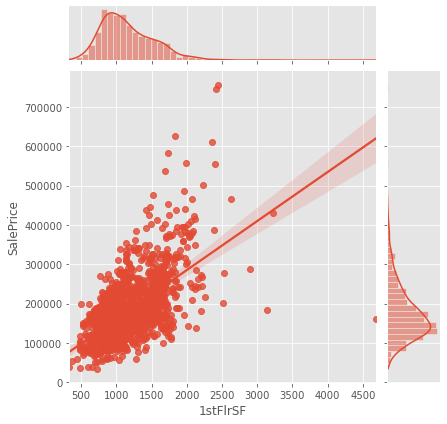

-------------------------------------- 2ndFlrSF - Jointplot--------------------------------------


<Figure size 576x432 with 0 Axes>

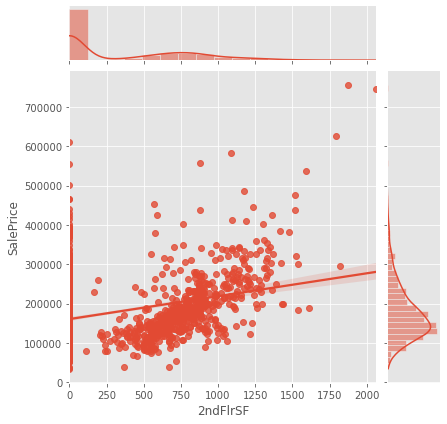

-------------------------------------- LowQualFinSF - Jointplot--------------------------------------


<Figure size 576x432 with 0 Axes>

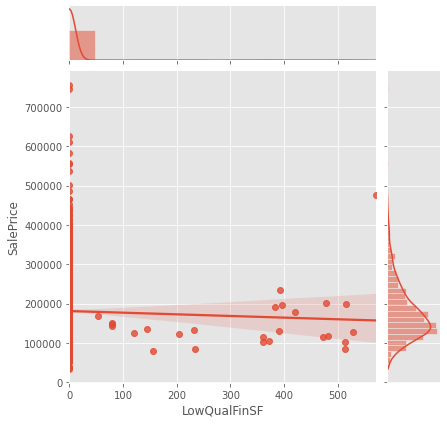

-------------------------------------- GrLivArea - Jointplot--------------------------------------


<Figure size 576x432 with 0 Axes>

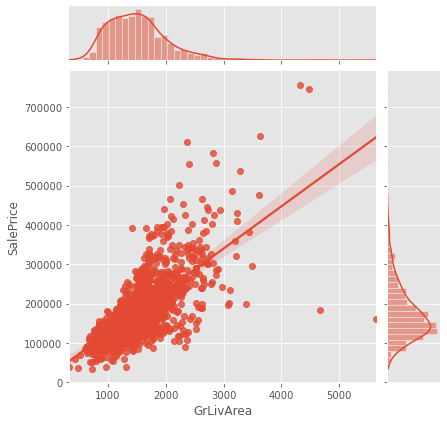

-------------------------------------- GarageYrBlt - Jointplot--------------------------------------


<Figure size 576x432 with 0 Axes>

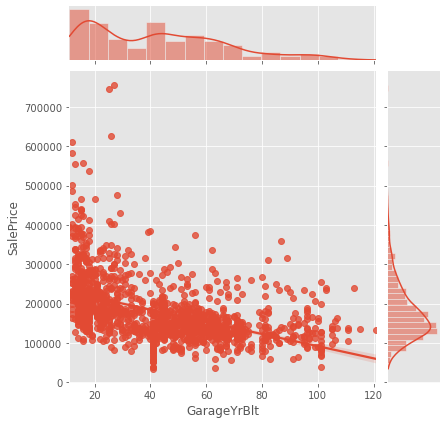

-------------------------------------- GarageArea - Jointplot--------------------------------------


<Figure size 576x432 with 0 Axes>

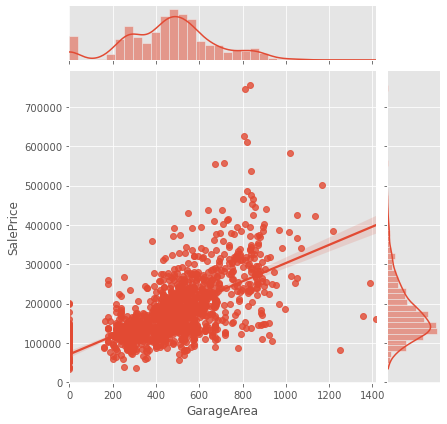

-------------------------------------- WoodDeckSF - Jointplot--------------------------------------


<Figure size 576x432 with 0 Axes>

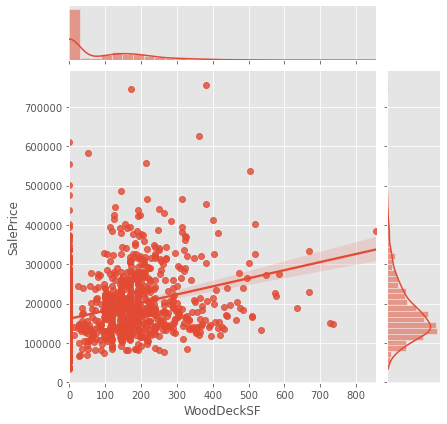

-------------------------------------- OpenPorchSF - Jointplot--------------------------------------


<Figure size 576x432 with 0 Axes>

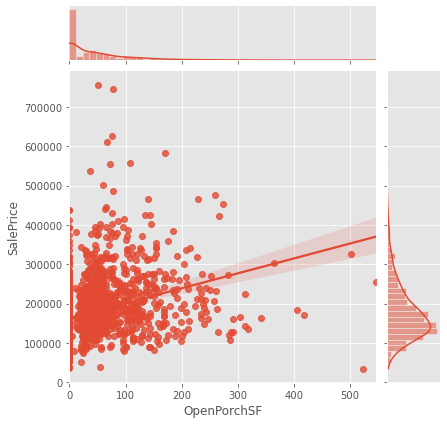

-------------------------------------- EnclosedPorch - Jointplot--------------------------------------


<Figure size 576x432 with 0 Axes>

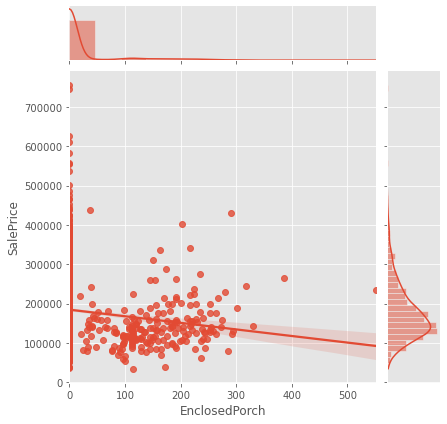

-------------------------------------- 3SsnPorch - Jointplot--------------------------------------


<Figure size 576x432 with 0 Axes>

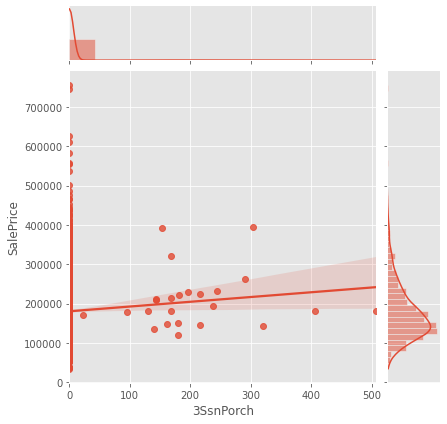

-------------------------------------- ScreenPorch - Jointplot--------------------------------------


<Figure size 576x432 with 0 Axes>

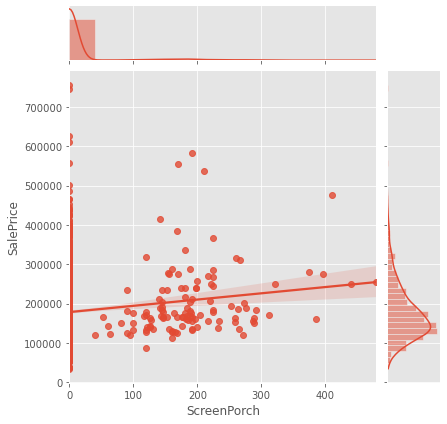

-------------------------------------- PoolArea - Jointplot--------------------------------------


<Figure size 576x432 with 0 Axes>

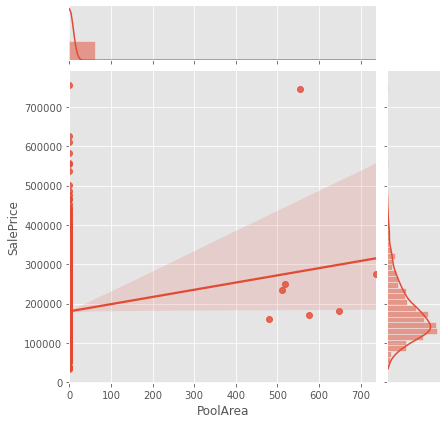

-------------------------------------- MiscVal - Jointplot--------------------------------------


<Figure size 576x432 with 0 Axes>

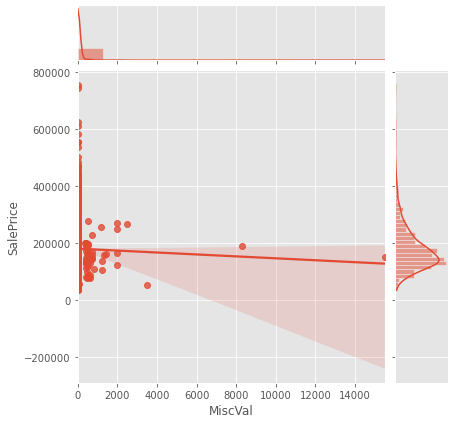

-------------------------------------- MoSold - Jointplot--------------------------------------


<Figure size 576x432 with 0 Axes>

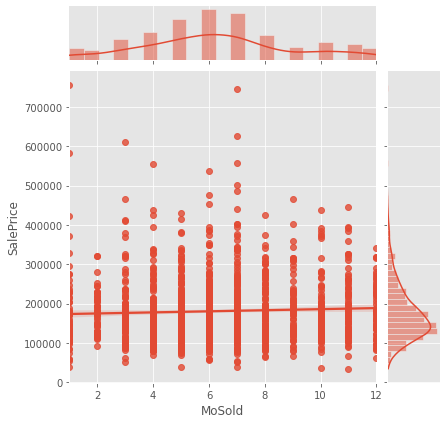

-------------------------------------- YrSold - Jointplot--------------------------------------


<Figure size 576x432 with 0 Axes>

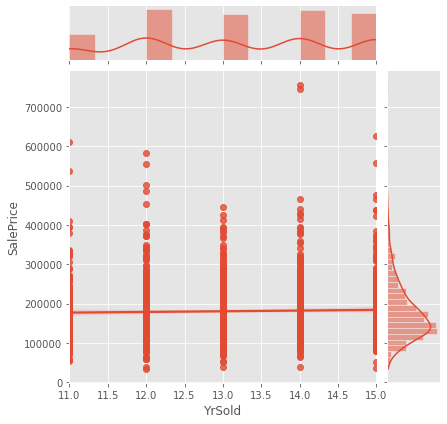

-------------------------------------- SalePrice - Jointplot--------------------------------------


<Figure size 576x432 with 0 Axes>

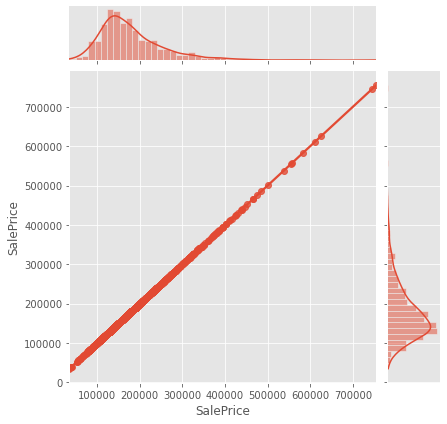

In [37]:
# Creating Bivariate Jointplot function

def bivariate_jointplot(col):
    print("--------------------------------------",col,"- Jointplot--------------------------------------")
    plt.style.use('ggplot')
    plt.figure(figsize = (8,6))
    sns.jointplot(x = col, y = 'SalePrice',data = housing_dataset , kind = 'reg')
    plt.show()
    
# Jointplot for continuous-Continuous Variables

for col in housing_dataset.select_dtypes('number').columns:
    bivariate_jointplot(col)

#### Observations :
##### Clustered & No Linear relationship: VAriables for which the data is scattered with respect to SalesPrice is 
- LotFronage,LotArea,MasVnrArea,BsmtFinSF1,BsmtUnfSF, TotalBsmtSF,1stFlrSF, 2ndFlrSF,GrLivArea, GarageArea, WoodDeckSF,
- OpenPorchSF,MoSold,YrSold, 

##### Scattered & No relatinship with SalesPrice
- BsmtFinSF2, 3SsnPorch,ScreenPorch,PoolArea

##### Clustered & Negative Linear relationship with SalePrice
- YearBuilt,YearRemodAdd, LowQualFinSF,MiscVal

##### Scattered & Negative Linear relationship Data with SalePrice
- GarageYrBlt, EnclosedPorch,

#### Categorical-Continuous Boxplots

-------------------------------------- MSSubClass - SalePrice Boxplot--------------------------------------


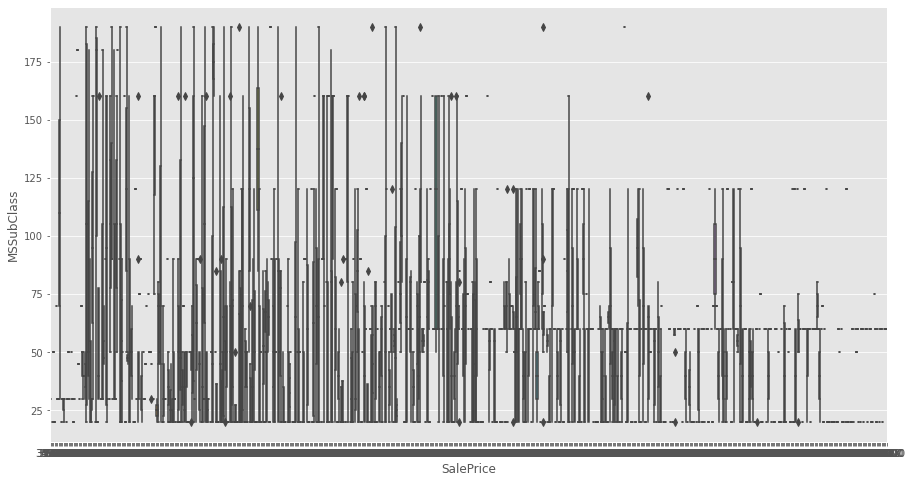

-------------------------------------- MSZoning - SalePrice Boxplot--------------------------------------


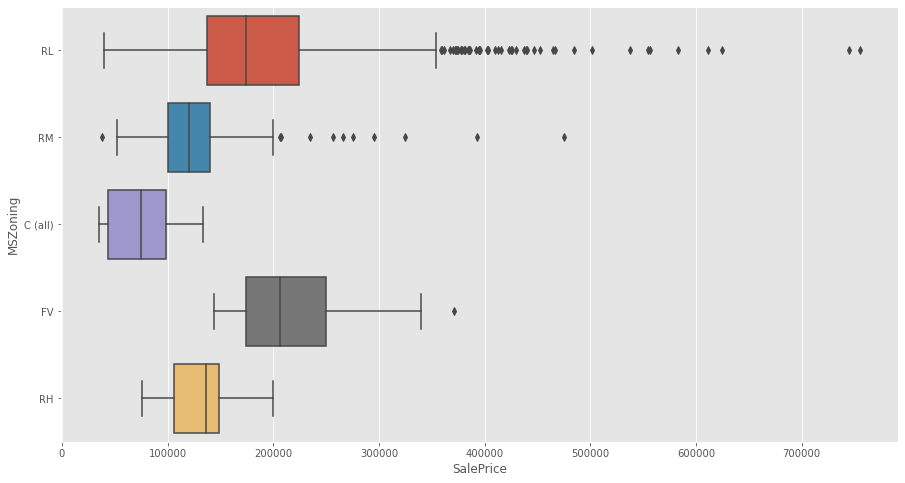

-------------------------------------- LotShape - SalePrice Boxplot--------------------------------------


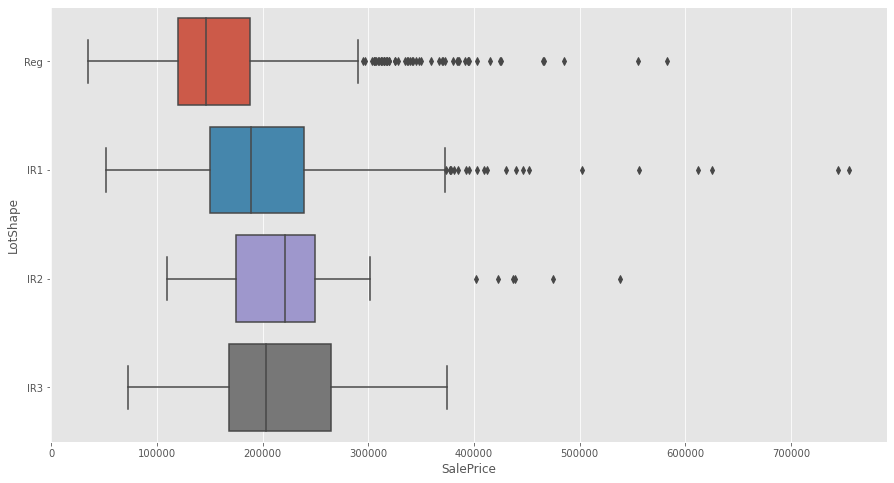

-------------------------------------- LandContour - SalePrice Boxplot--------------------------------------


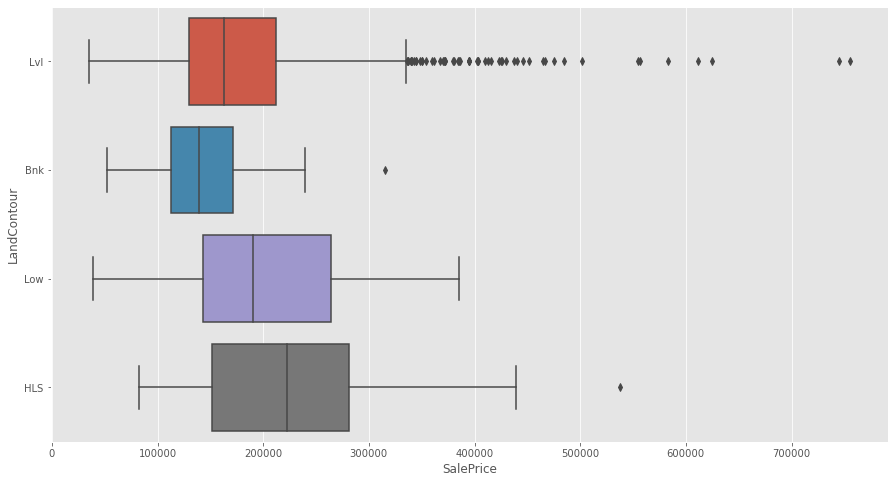

-------------------------------------- LotConfig - SalePrice Boxplot--------------------------------------


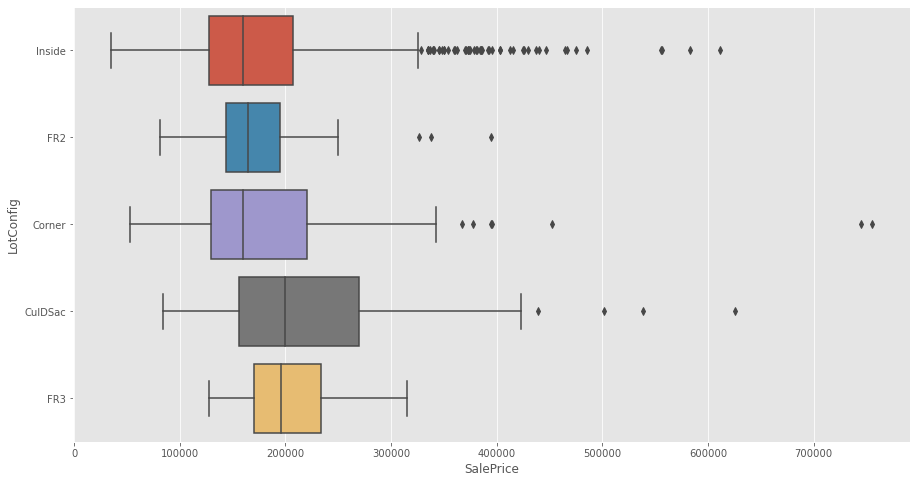

-------------------------------------- LandSlope - SalePrice Boxplot--------------------------------------


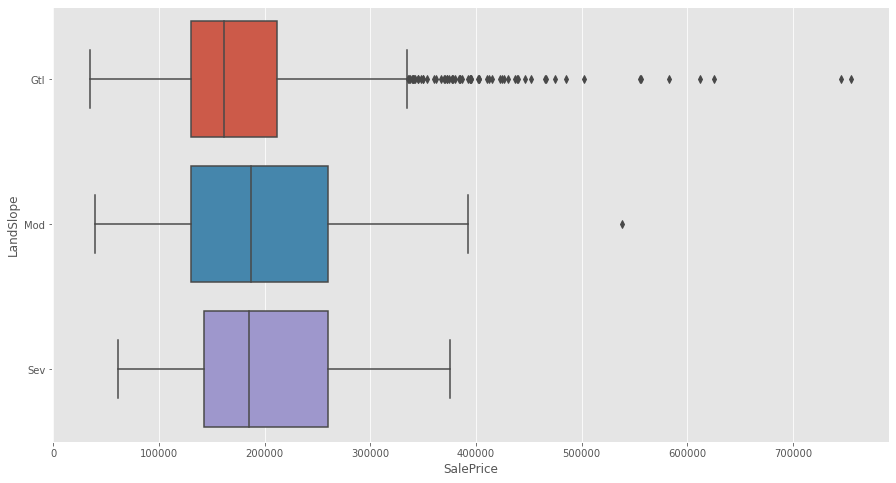

-------------------------------------- Neighborhood - SalePrice Boxplot--------------------------------------


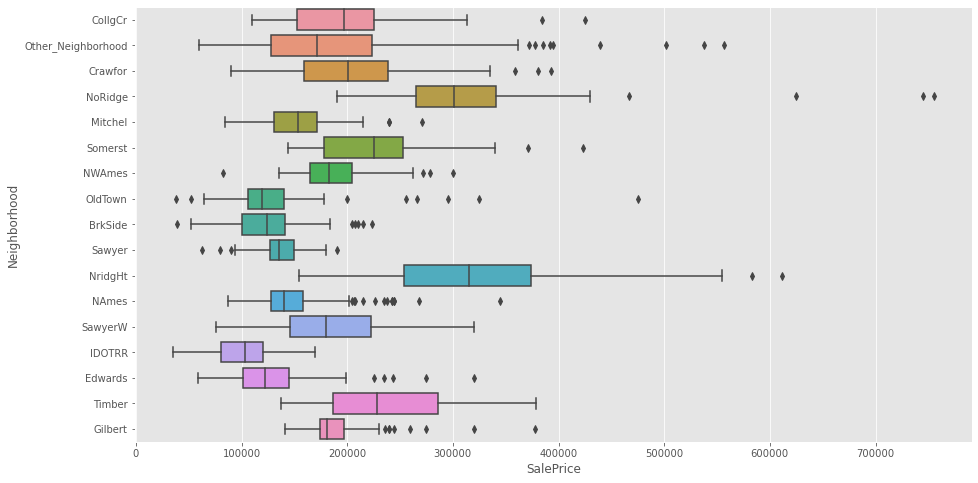

-------------------------------------- Condition1 - SalePrice Boxplot--------------------------------------


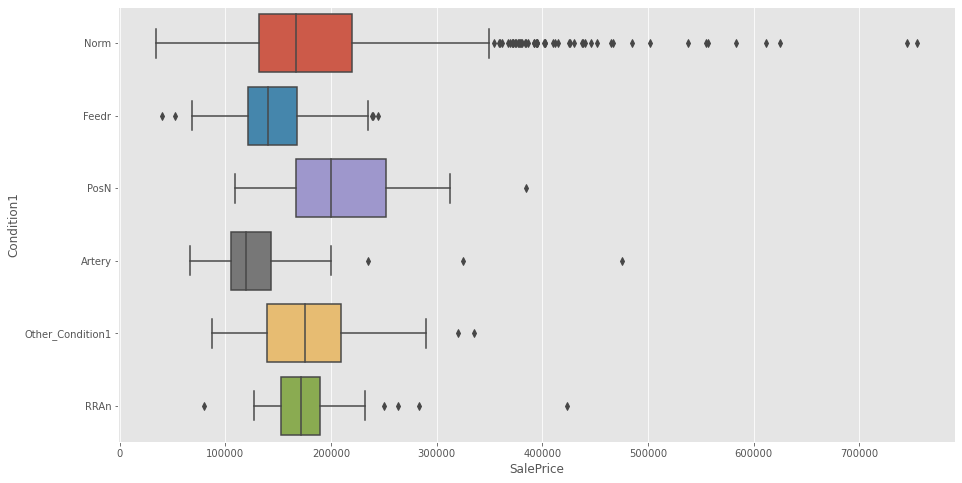

-------------------------------------- Condition2 - SalePrice Boxplot--------------------------------------


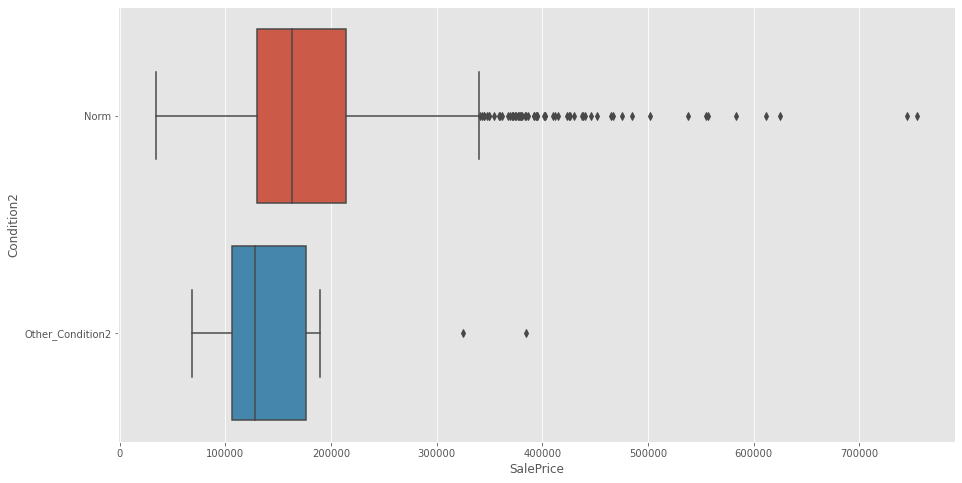

-------------------------------------- BldgType - SalePrice Boxplot--------------------------------------


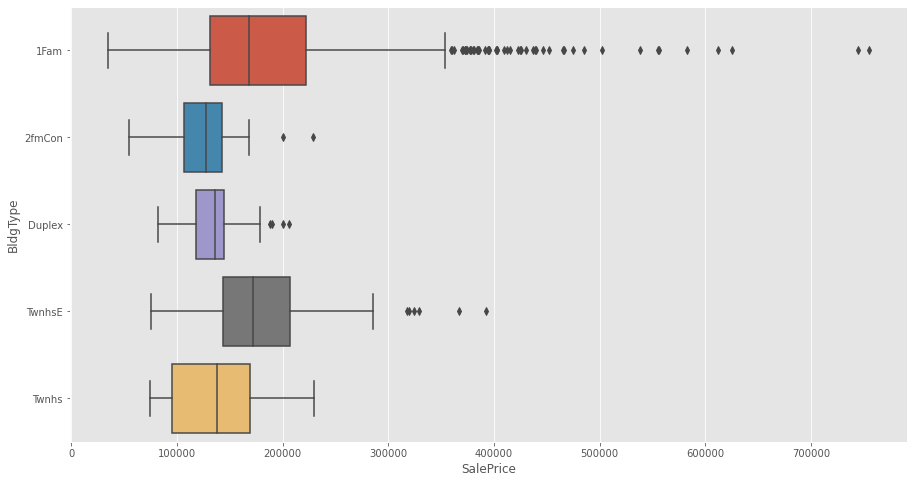

-------------------------------------- HouseStyle - SalePrice Boxplot--------------------------------------


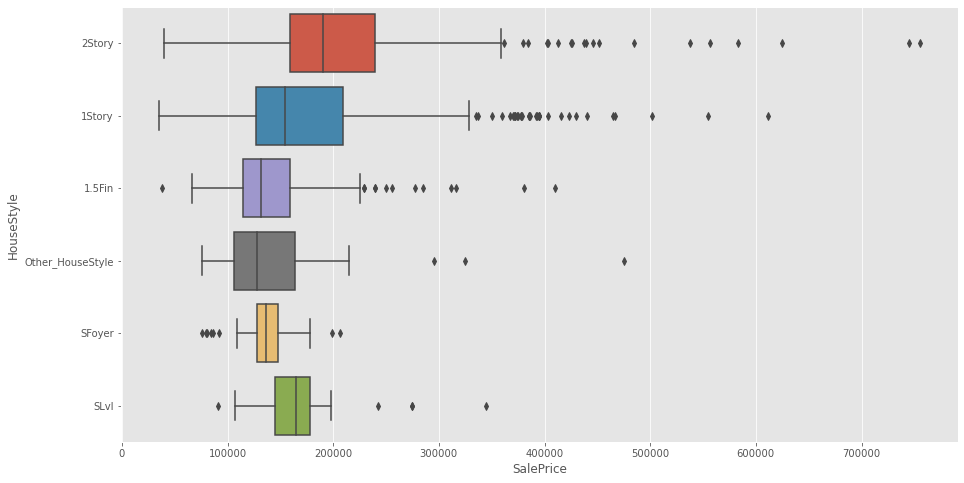

-------------------------------------- OverallQual - SalePrice Boxplot--------------------------------------


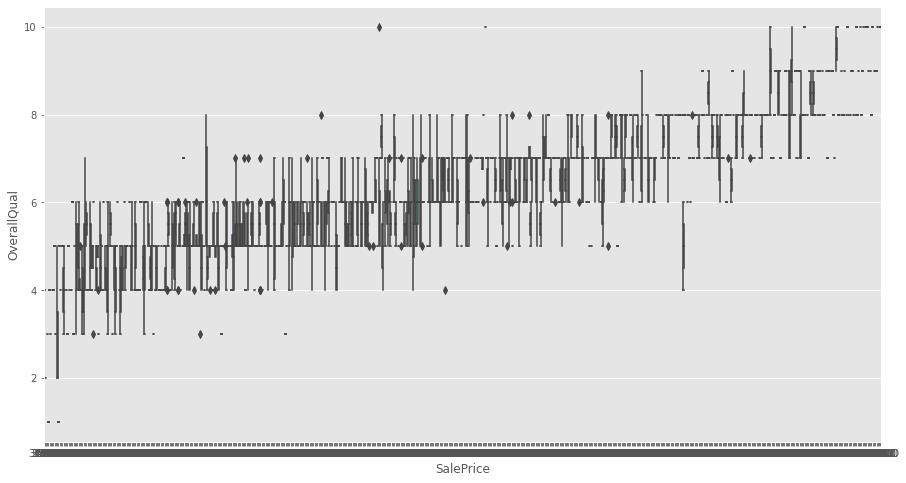

-------------------------------------- OverallCond - SalePrice Boxplot--------------------------------------


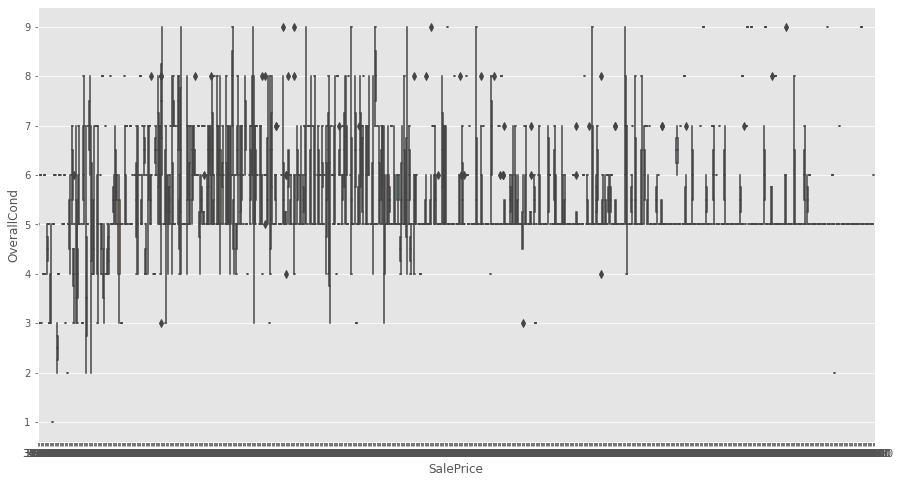

-------------------------------------- RoofStyle - SalePrice Boxplot--------------------------------------


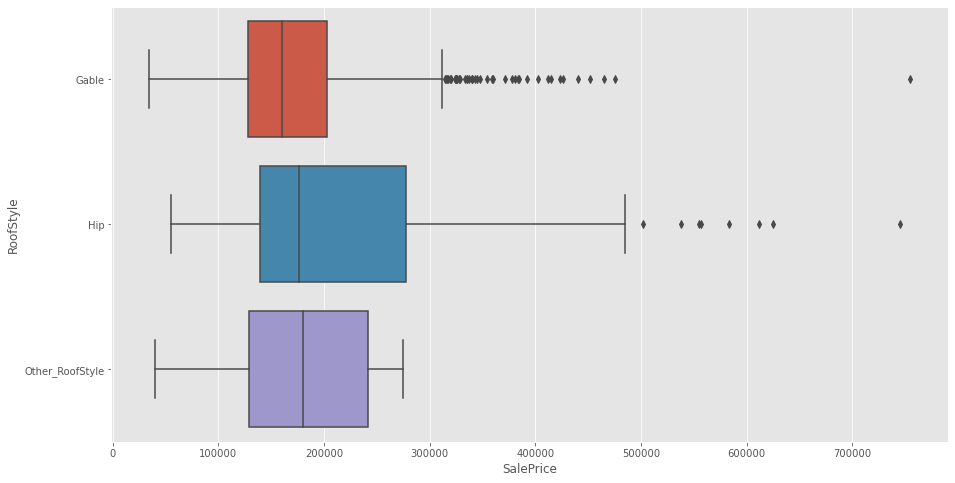

-------------------------------------- RoofMatl - SalePrice Boxplot--------------------------------------


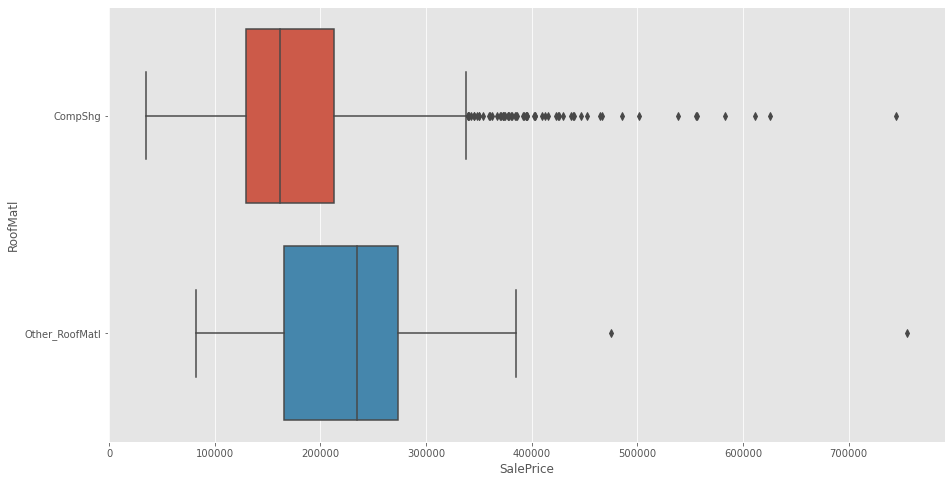

-------------------------------------- Exterior1st - SalePrice Boxplot--------------------------------------


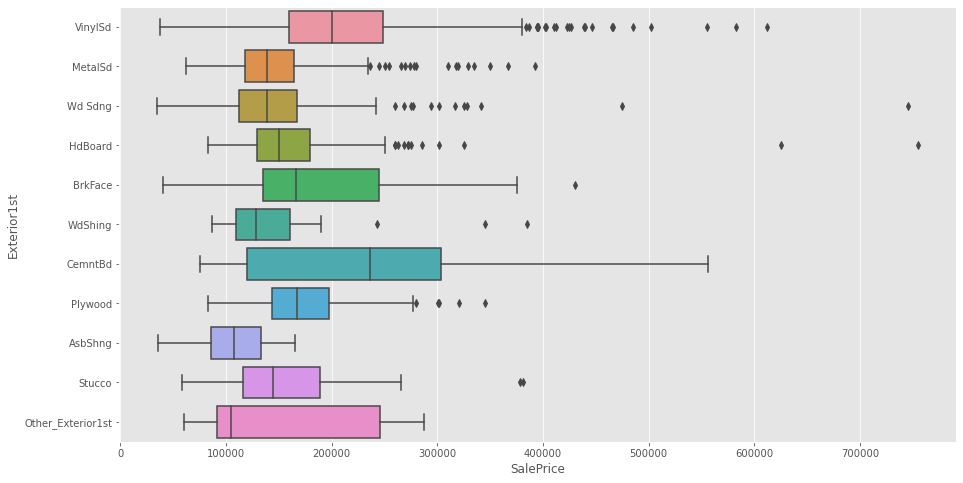

-------------------------------------- Exterior2nd - SalePrice Boxplot--------------------------------------


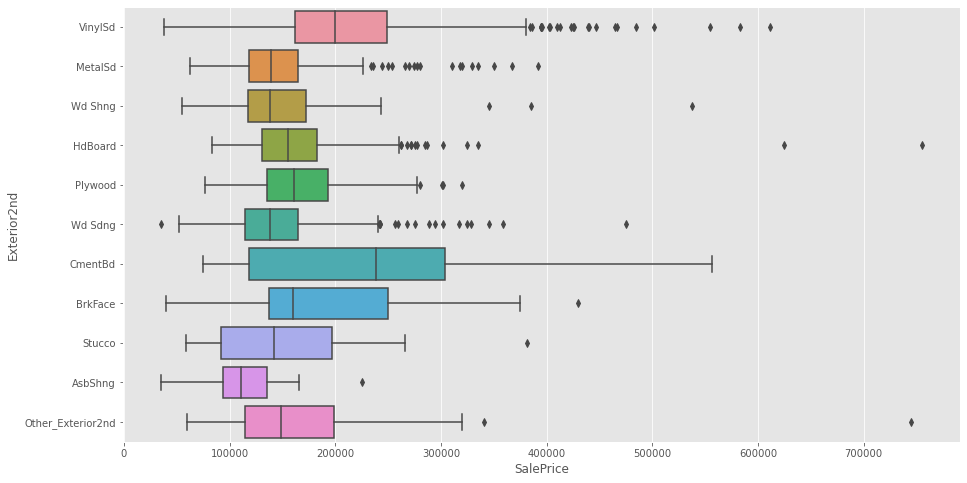

-------------------------------------- MasVnrType - SalePrice Boxplot--------------------------------------


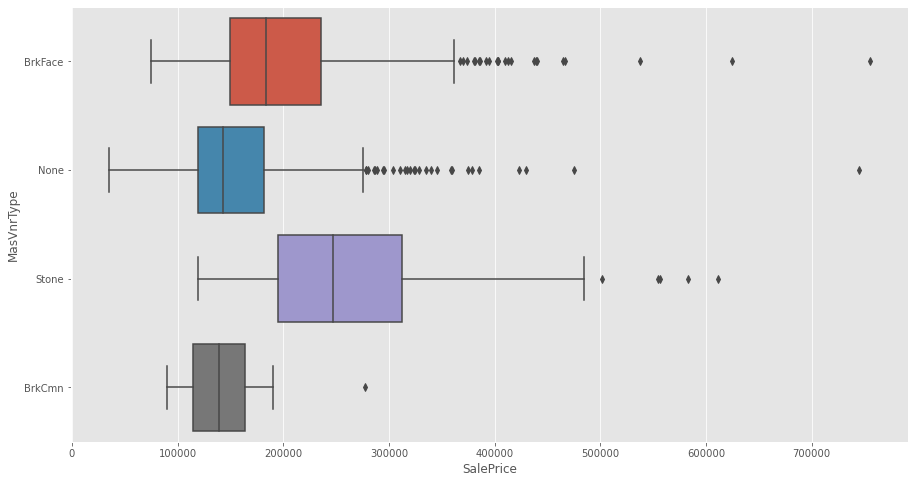

-------------------------------------- ExterQual - SalePrice Boxplot--------------------------------------


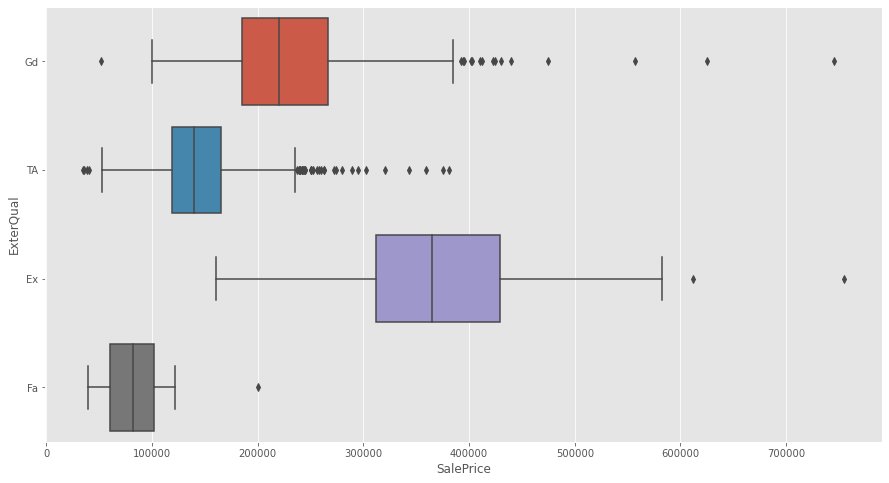

-------------------------------------- ExterCond - SalePrice Boxplot--------------------------------------


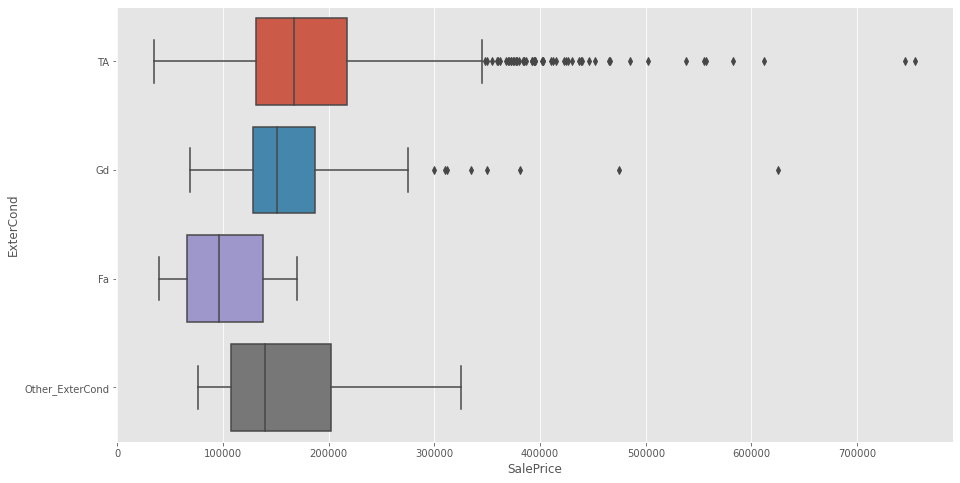

-------------------------------------- Foundation - SalePrice Boxplot--------------------------------------


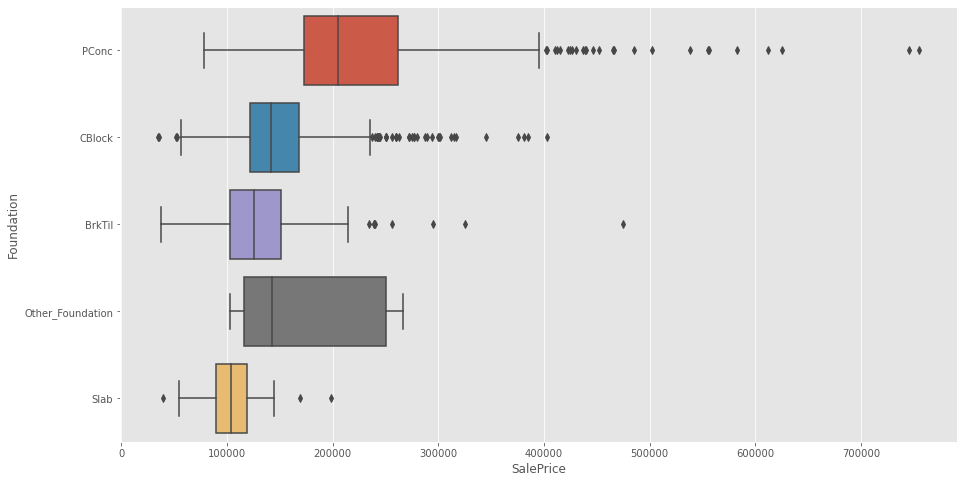

-------------------------------------- BsmtQual - SalePrice Boxplot--------------------------------------


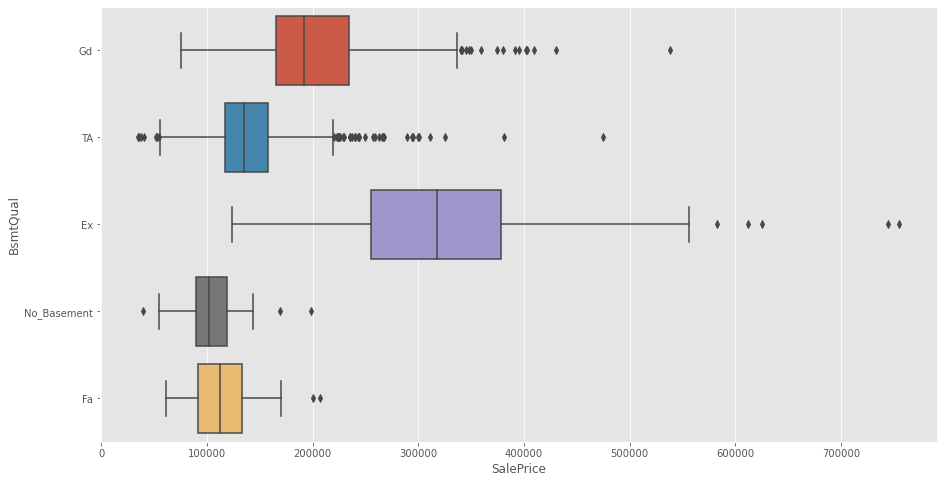

-------------------------------------- BsmtCond - SalePrice Boxplot--------------------------------------


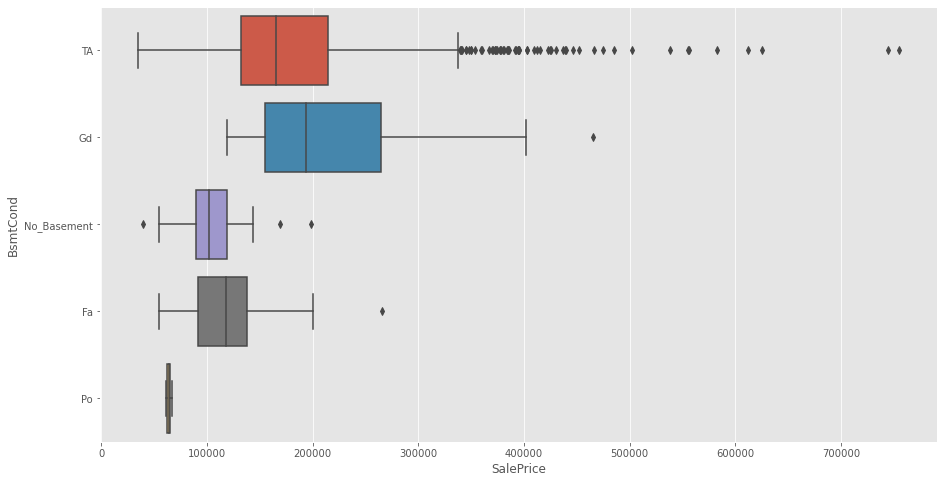

-------------------------------------- BsmtExposure - SalePrice Boxplot--------------------------------------


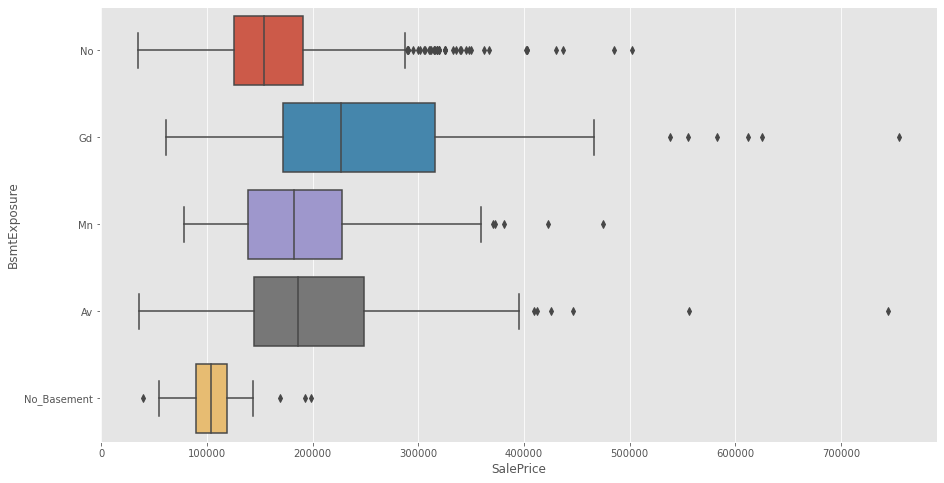

-------------------------------------- BsmtFinType1 - SalePrice Boxplot--------------------------------------


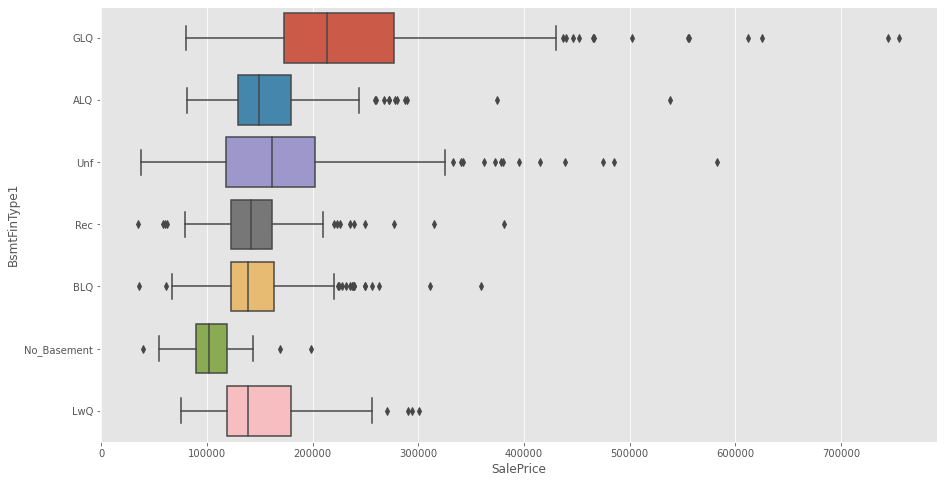

-------------------------------------- BsmtFinType2 - SalePrice Boxplot--------------------------------------


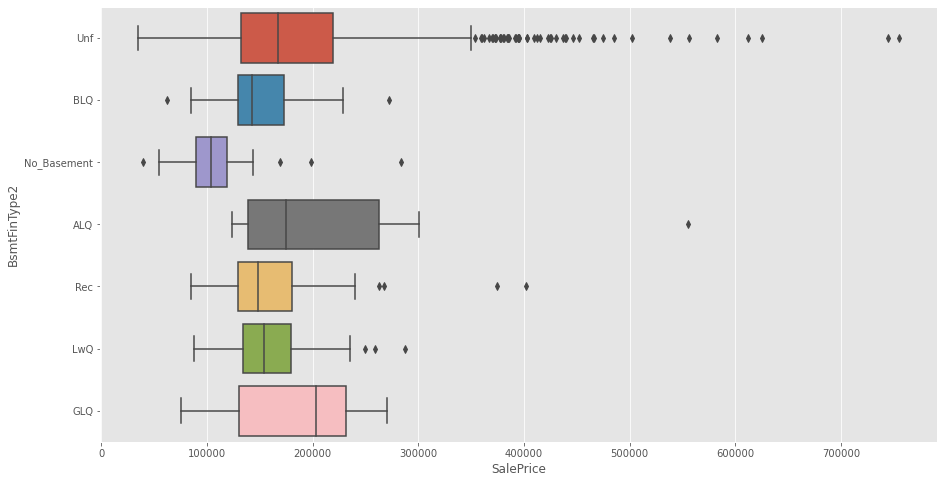

-------------------------------------- Heating - SalePrice Boxplot--------------------------------------


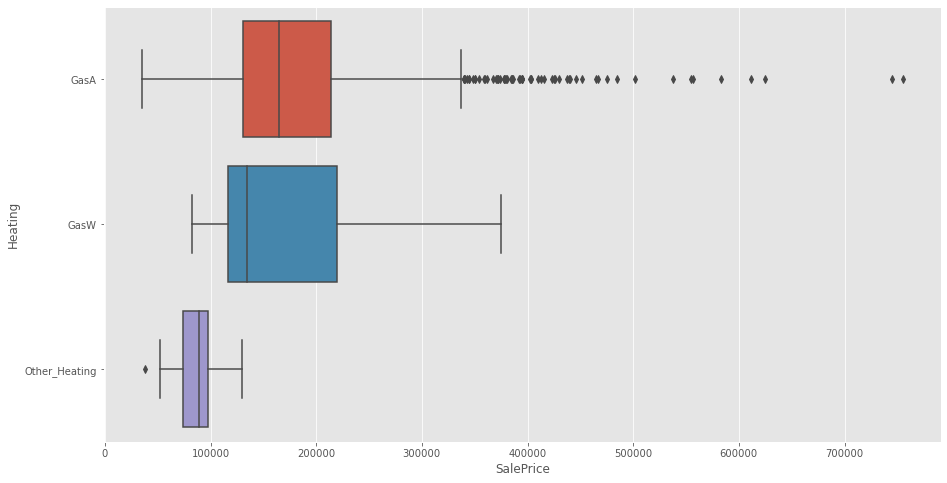

-------------------------------------- HeatingQC - SalePrice Boxplot--------------------------------------


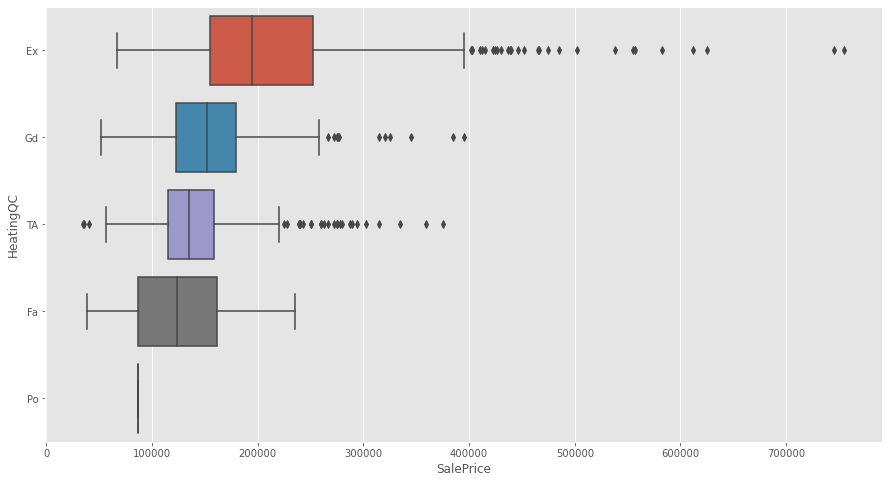

-------------------------------------- CentralAir - SalePrice Boxplot--------------------------------------


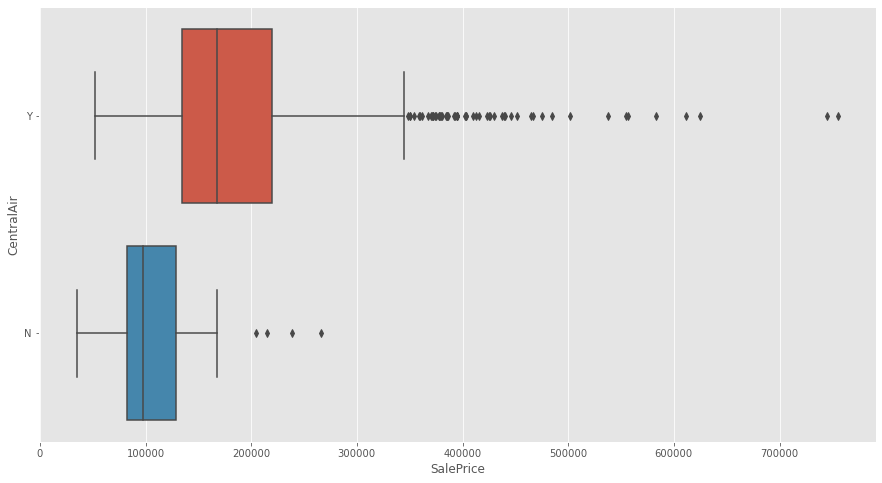

-------------------------------------- Electrical - SalePrice Boxplot--------------------------------------


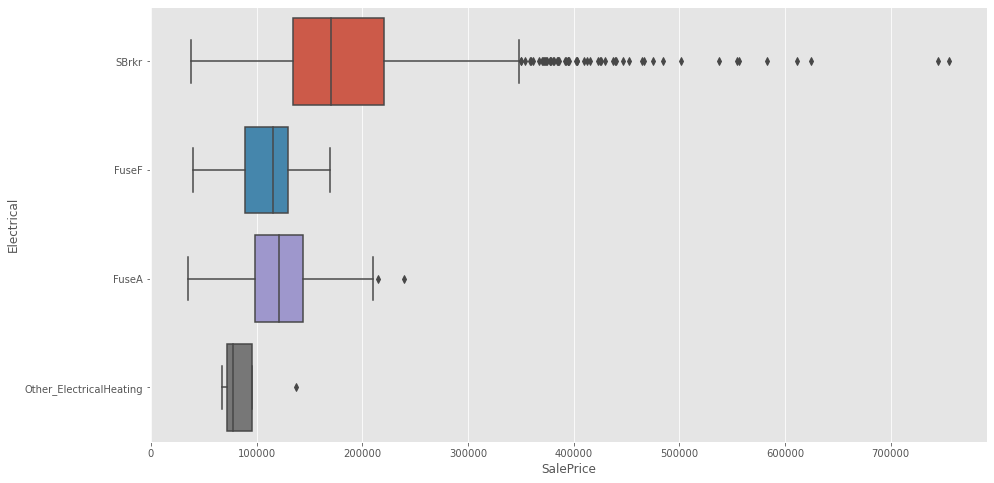

-------------------------------------- BsmtFullBath - SalePrice Boxplot--------------------------------------


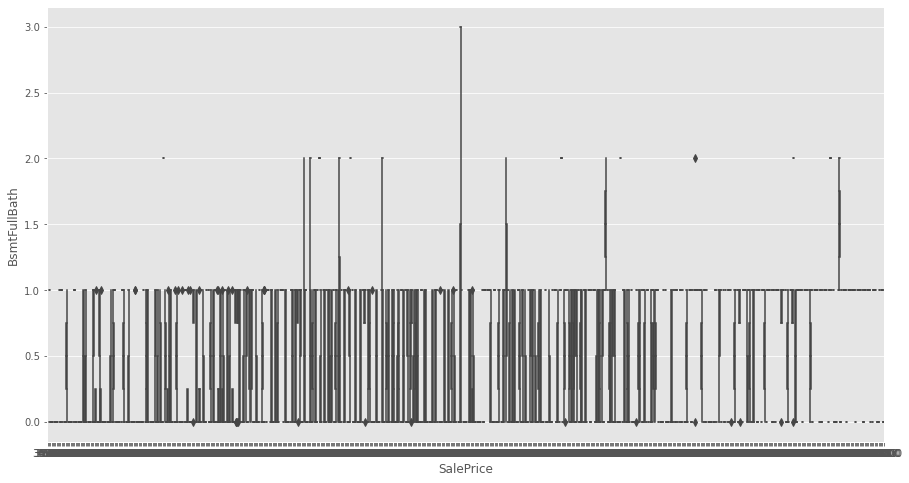

-------------------------------------- BsmtHalfBath - SalePrice Boxplot--------------------------------------


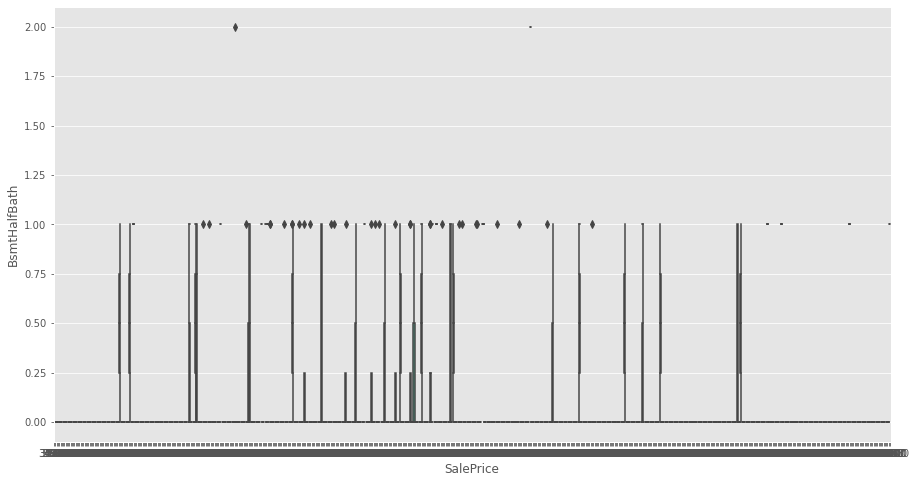

-------------------------------------- FullBath - SalePrice Boxplot--------------------------------------


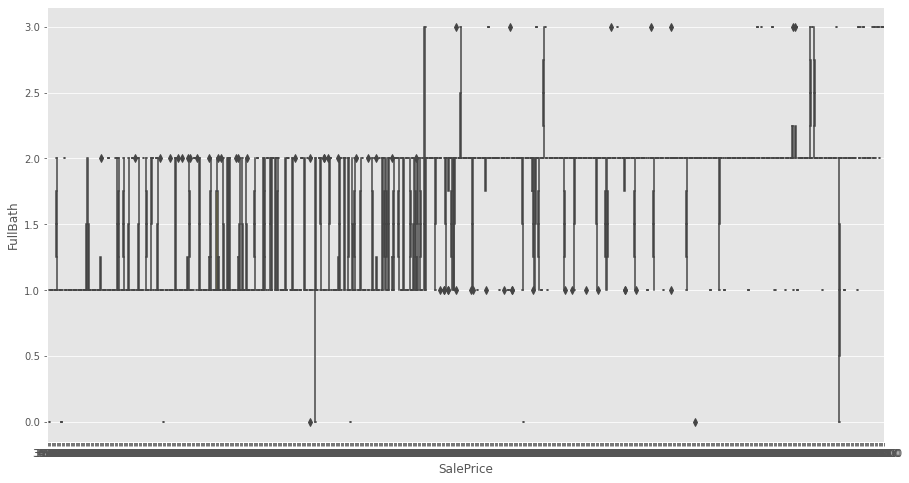

-------------------------------------- HalfBath - SalePrice Boxplot--------------------------------------


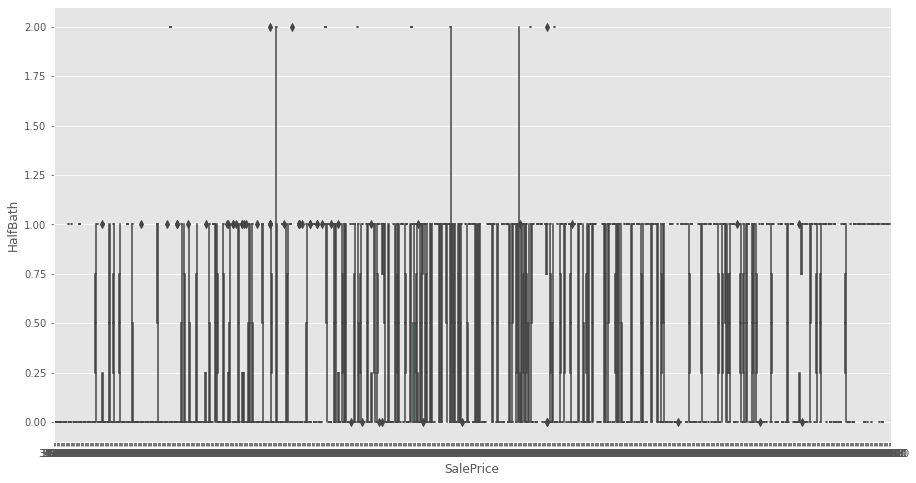

-------------------------------------- BedroomAbvGr - SalePrice Boxplot--------------------------------------


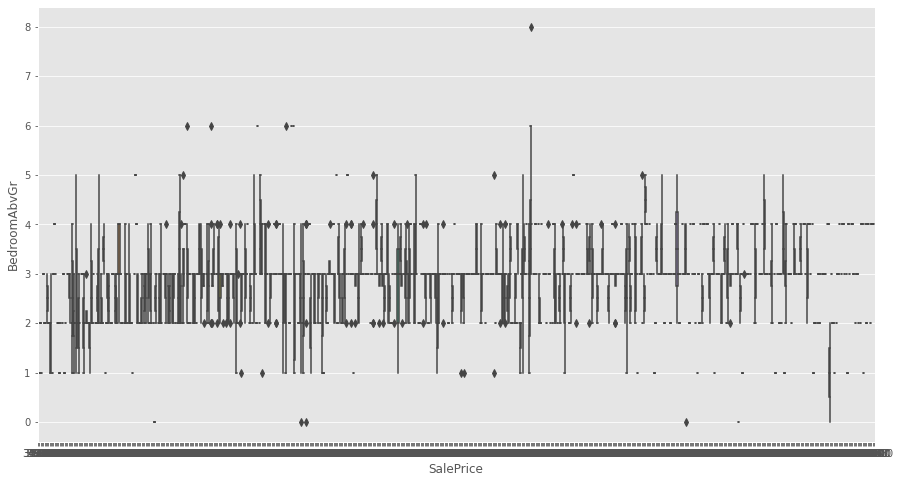

-------------------------------------- KitchenAbvGr - SalePrice Boxplot--------------------------------------


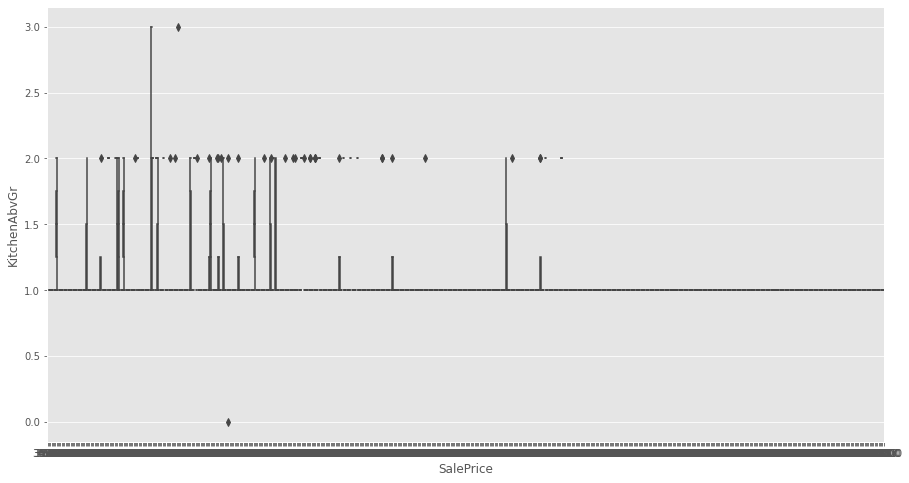

-------------------------------------- KitchenQual - SalePrice Boxplot--------------------------------------


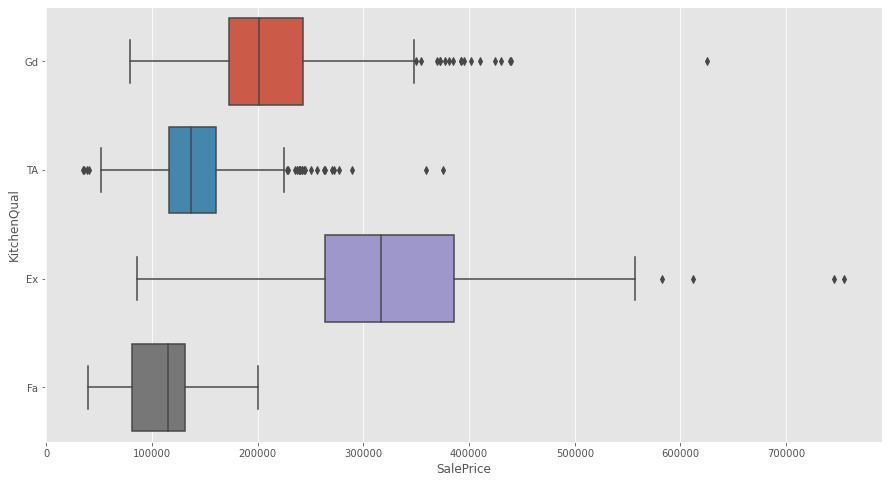

-------------------------------------- TotRmsAbvGrd - SalePrice Boxplot--------------------------------------


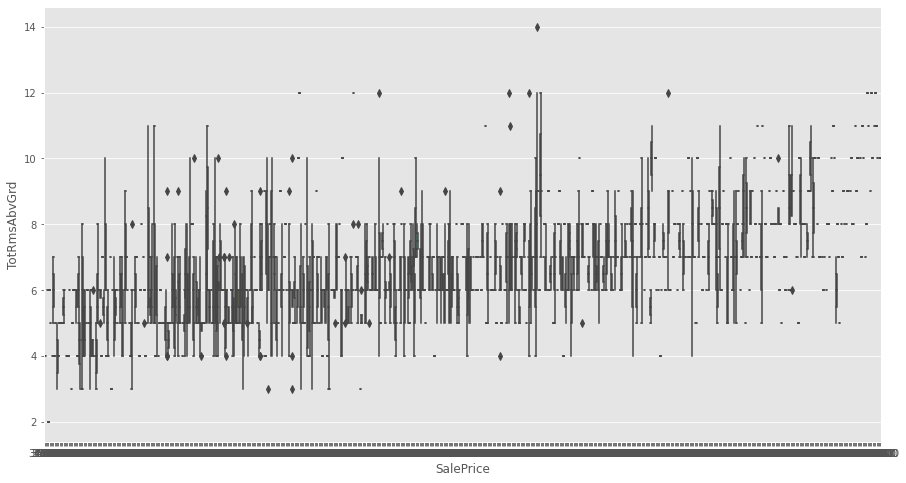

-------------------------------------- Functional - SalePrice Boxplot--------------------------------------


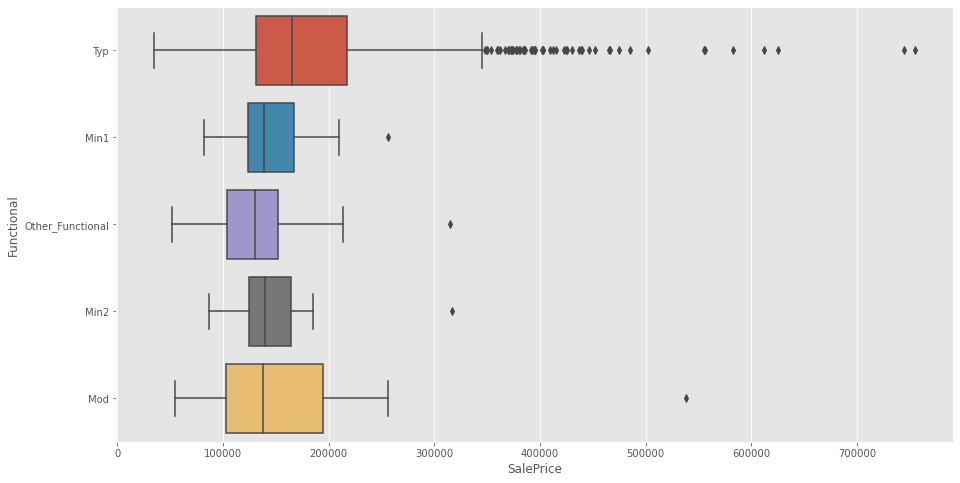

-------------------------------------- Fireplaces - SalePrice Boxplot--------------------------------------


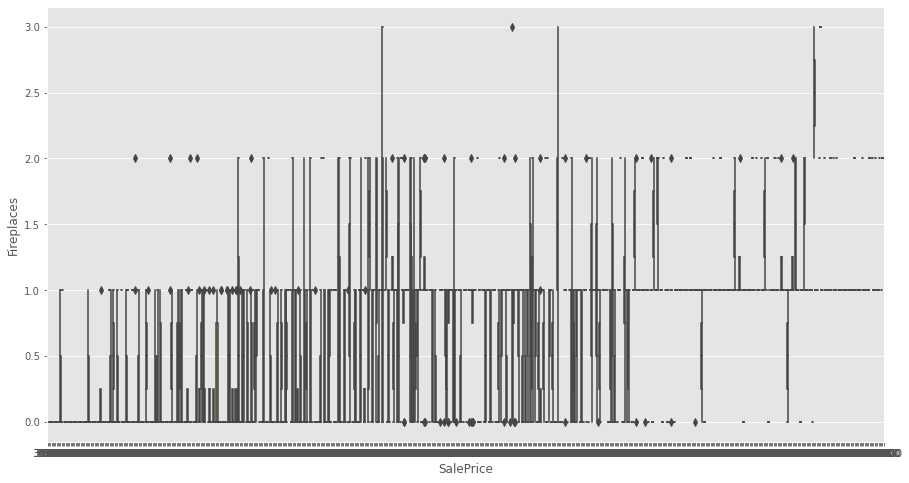

-------------------------------------- GarageType - SalePrice Boxplot--------------------------------------


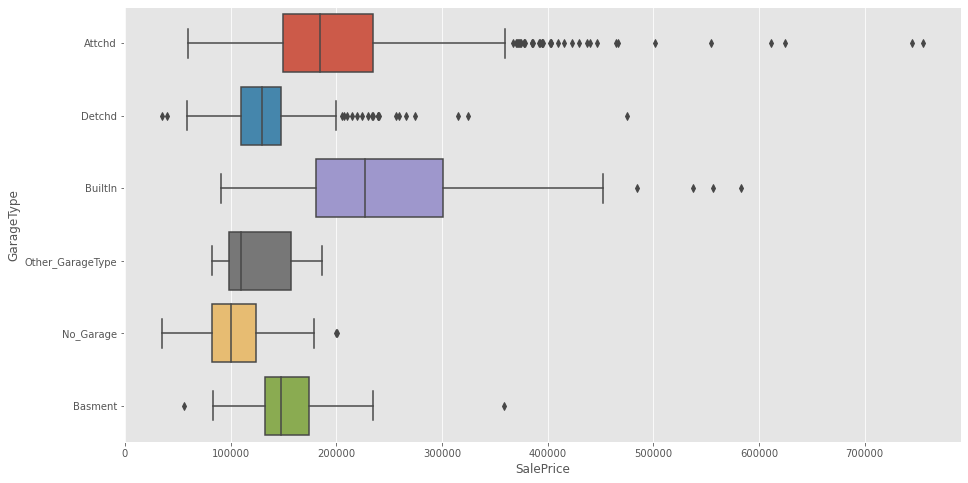

-------------------------------------- GarageFinish - SalePrice Boxplot--------------------------------------


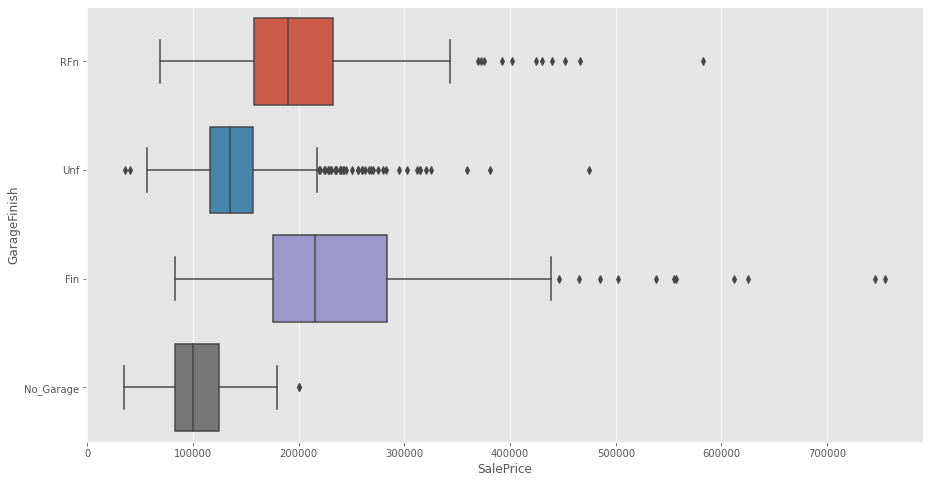

-------------------------------------- GarageCars - SalePrice Boxplot--------------------------------------


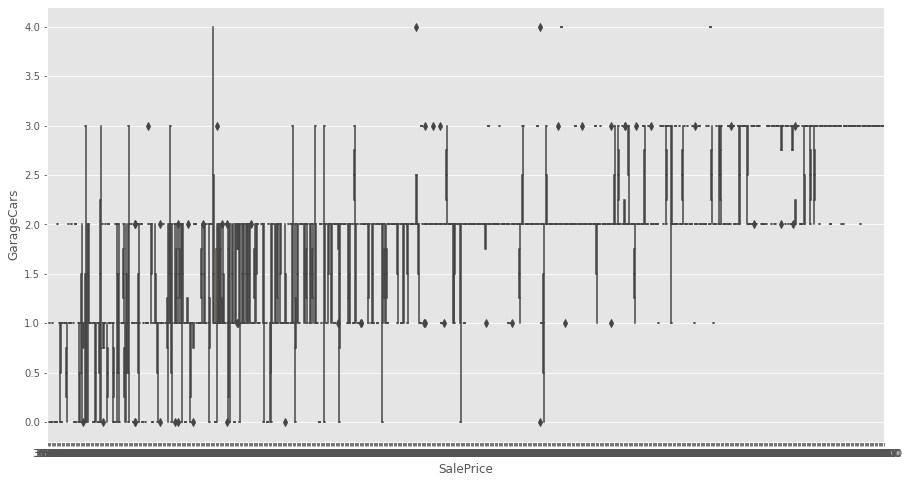

-------------------------------------- GarageQual - SalePrice Boxplot--------------------------------------


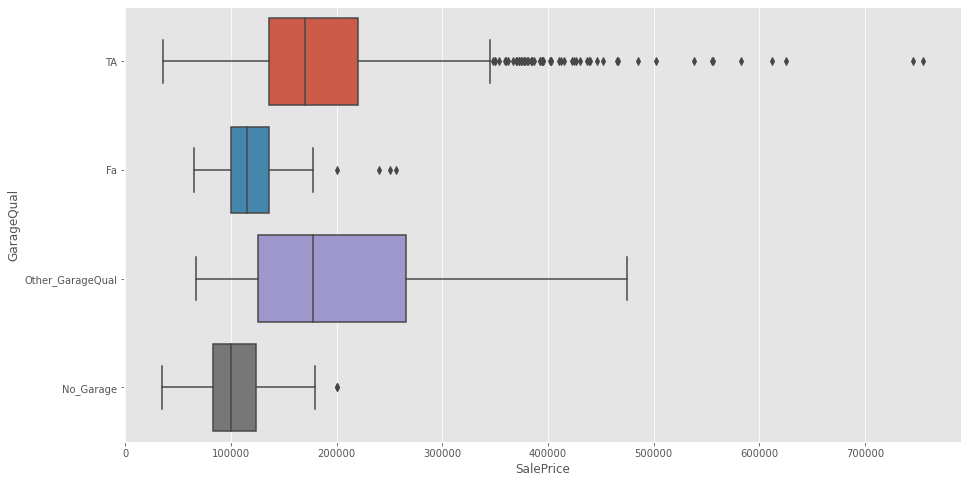

-------------------------------------- GarageCond - SalePrice Boxplot--------------------------------------


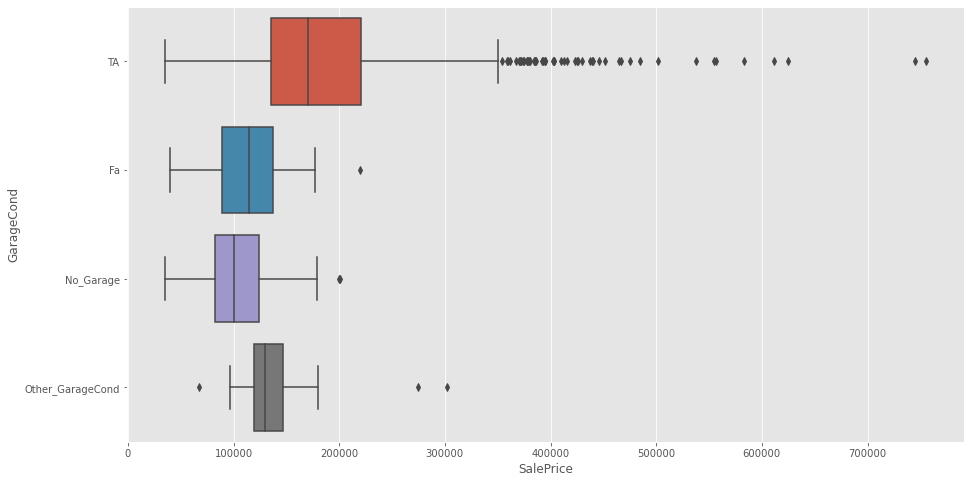

-------------------------------------- PavedDrive - SalePrice Boxplot--------------------------------------


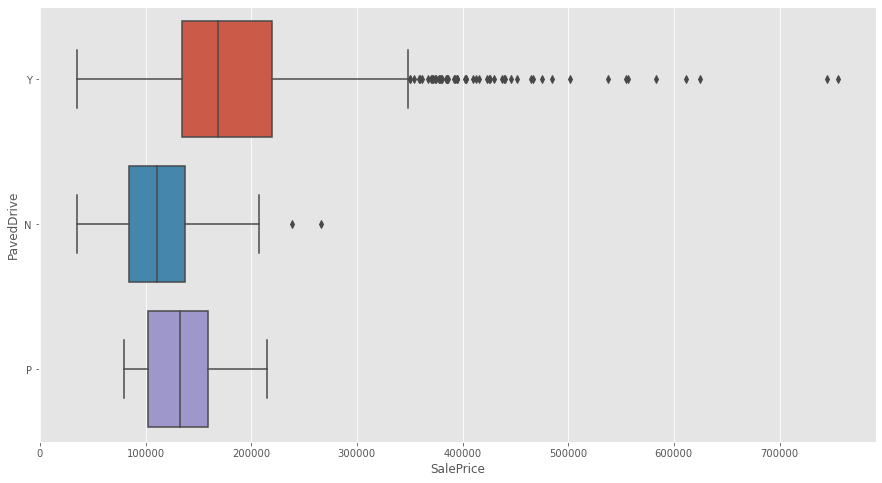

-------------------------------------- SaleType - SalePrice Boxplot--------------------------------------


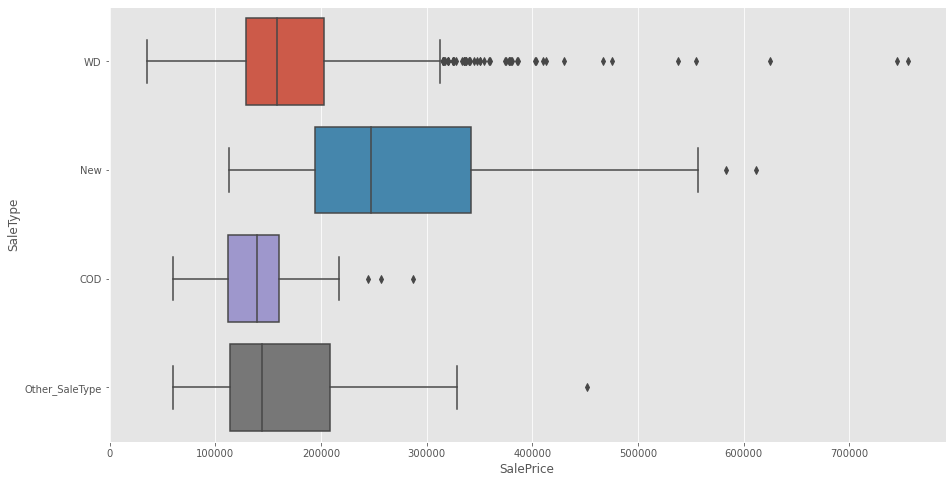

-------------------------------------- SaleCondition - SalePrice Boxplot--------------------------------------


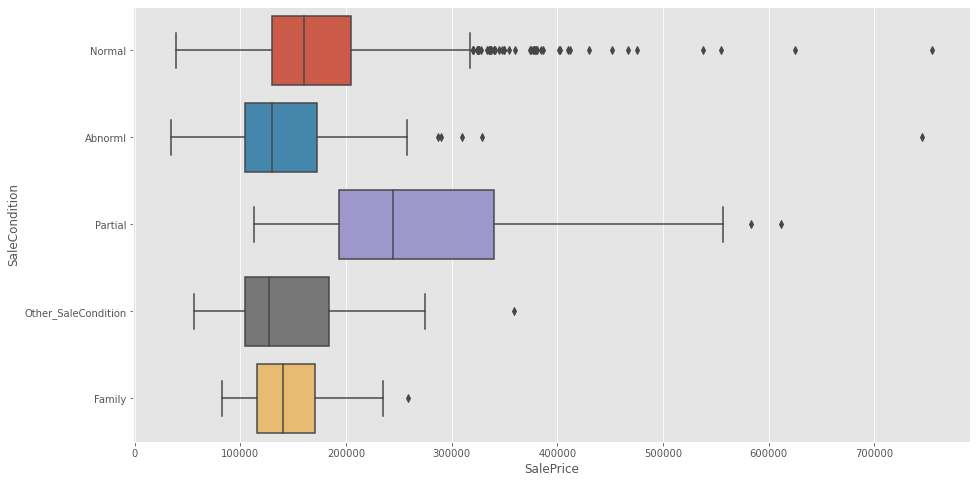

In [38]:
# Creating a function for Categorical-Continuous Boxplots

def bivariate_boxplots(col):
    print("--------------------------------------",col,"- SalePrice Boxplot--------------------------------------")
    plt.style.use('ggplot')
    plt.figure(figsize = (15,8))
    sns.boxplot(x = 'SalePrice', y = col,data = housing_dataset)
    plt.show()
    
# Boxplot for Categorical-Continuous Variables

for col in housing_dataset.select_dtypes('object').columns:
    bivariate_boxplots(col)

#### Observations: 

There are many outliers present for all the variables with respect to SalePrice

- SalePrice is hig for 'RoofStyle' - Hip, HouseStyle - 2Story, BlgType- 1Fam,
- Exterior1st, Exterior2nd - CementBD,
- MasVnrType - Stone, ExterQual - Ex, ExterCond - TA, Foundation - PConc, BsmtQual - Ex,
- BsmtFinType1 - GLQ, BsmtFinType2 - Unf, Heating - GasA, HeatingQC - Ex , 
- CetnralAir - Y, GarageCondition- TA , GarageFinish - Fn, GarageType- Attchd
- PaveDriv- Yes,SaleType - New, SaleCondition - Partial, 

### Multivariate Analysis

#### Correlation Matrix - Heatmap

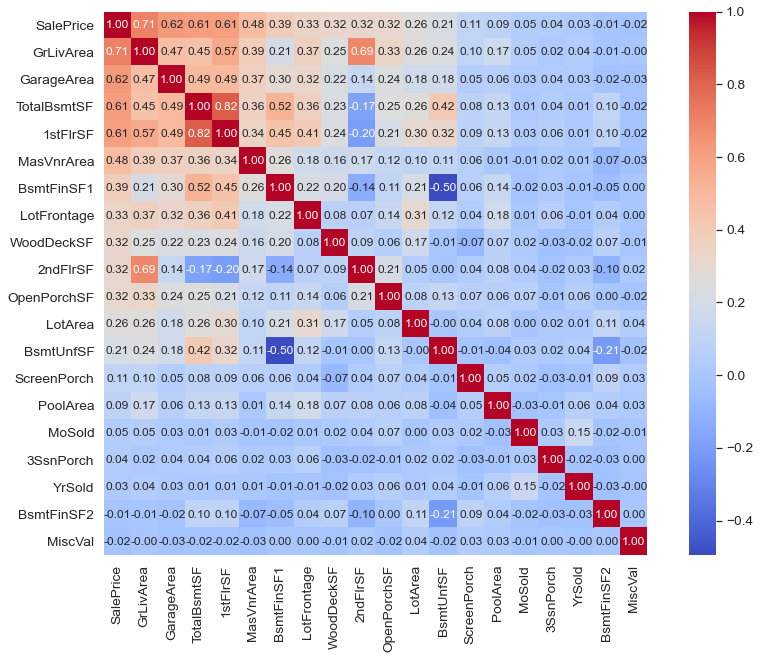

In [39]:
# Lets select the top 20 best features to plot pairplot
# Lets plot Heatmap to understand the highly correlated variables with the Taarget 'SalesPrice Variable'

k = 20
cols = housing_dataset.corr().nlargest(k,'SalePrice')['SalePrice'].index
cols_list = cols.values
cmatrix = np.corrcoef(housing_dataset[cols].values.T)
sns.set(font_scale = 1.25)
plt.figure(figsize = (15,10))
sns.heatmap(cmatrix, cbar = True, annot = True, square = True, fmt = '.2f', annot_kws = {'size':12},
            yticklabels = cols.values, xticklabels = cols.values, cmap = 'coolwarm')
plt.show()

#### Observations:
- Correlation matrix represents the correlation between the target & the variables 

###  Pairplot

<Figure size 1800x1080 with 0 Axes>

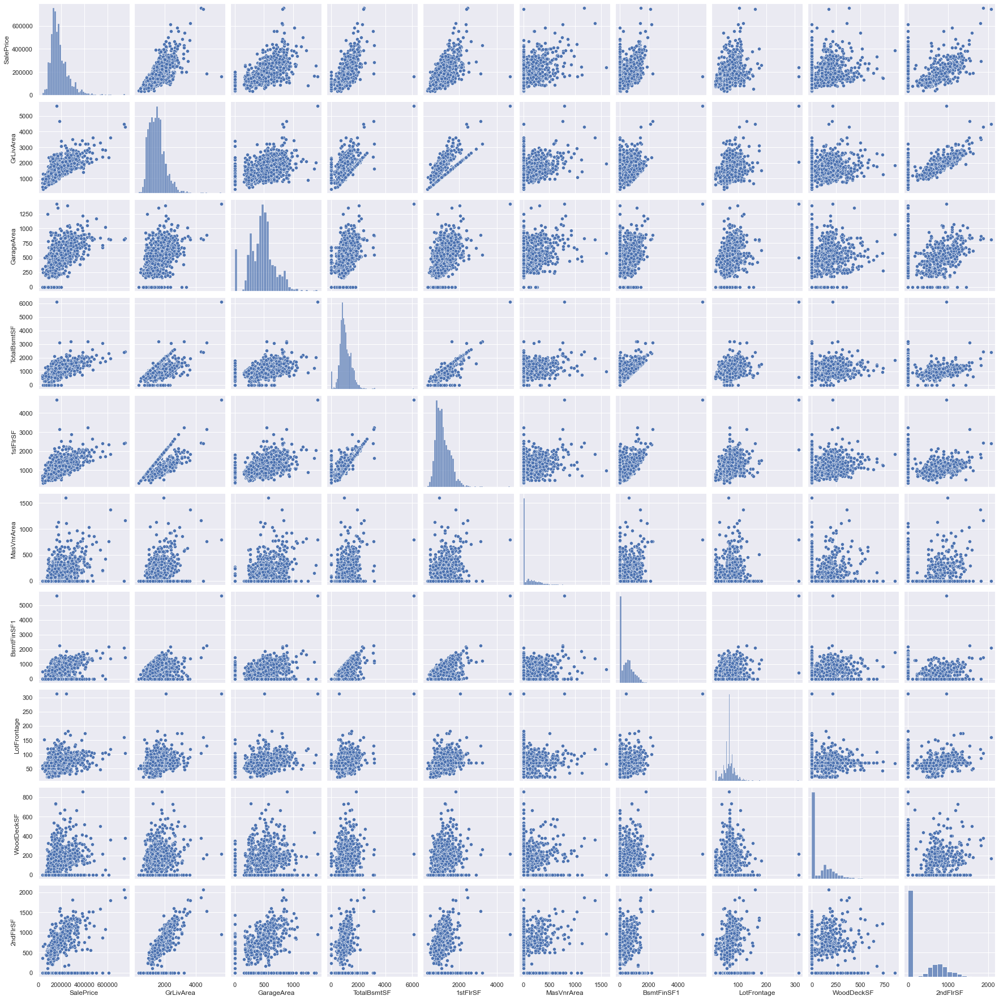

In [40]:
sns.set()
cols = housing_dataset.corr().nlargest(10,'SalePrice')['SalePrice'].index
cols_list = cols.values
plt.figure(figsize = (25,15))
sns.pairplot(housing_dataset[cols_list] , size = 2.5)
plt.show()

#### Observations:
- pairplot shows there is no much positive linear relaitionship between the variables
- All the data points are clustered or scattered.

#### Transforming the Target Variable using Log Transformation :

In [41]:
housing_dataset['Transformed_SalePrice'] = np.log(housing_dataset['SalePrice'])

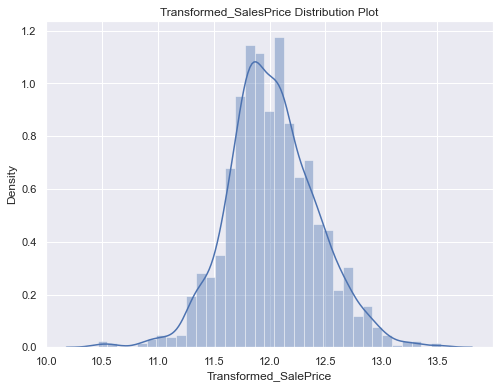

In [42]:
plt.figure(figsize = (8,6))
plt.title("Transformed_SalesPrice Distribution Plot")
sns.distplot(housing_dataset['Transformed_SalePrice'])
plt.show()

## 5. Data Preprocessing

#### Binary variables encoding

In [44]:
# Lets check the unique subclasses for each variable
housing_dataset.nunique().sort_values()

RoofMatl                    2
Condition2                  2
CentralAir                  2
PavedDrive                  3
RoofStyle                   3
HalfBath                    3
LandSlope                   3
Heating                     3
BsmtHalfBath                3
Electrical                  4
MasVnrType                  4
SaleType                    4
ExterCond                   4
GarageCond                  4
BsmtFullBath                4
GarageFinish                4
GarageQual                  4
FullBath                    4
LandContour                 4
LotShape                    4
KitchenAbvGr                4
KitchenQual                 4
Fireplaces                  4
ExterQual                   4
GarageCars                  5
HeatingQC                   5
Functional                  5
YrSold                      5
BsmtExposure                5
BsmtQual                    5
Foundation                  5
MSZoning                    5
SaleCondition               5
LotConfig 

In [45]:
# Only 'CentralAir' feature has the 2 subclasses
housing_dataset['CentralAir'] = housing_dataset['CentralAir'].map({'N':0 , 'Y':1})

#### Dummy Encoding

In [46]:
# Lets create a list of categorical variables
categorical_columns = housing_dataset.select_dtypes('object').columns

# Lets create dummies_df for all the categorical variables in housing_dataset 
dummies_df = pd.get_dummies(housing_dataset[categorical_columns] , drop_first = True)

# Concat housing_dataset & dummies_df
housing_dataset = pd.concat([housing_dataset , dummies_df] , axis = 1)

# Lets drop the categorical_columns variables for which the dummies has been created
housing_dataset.drop(categorical_columns, axis = 1 , inplace = True)

In [47]:
# Lets check the head of the dataset
housing_dataset.head()

,Id,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,Transformed_SalePrice,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Other_Neighborhood,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_Timber,Condition1_Feedr,Condition1_Norm,Condition1_Other_Condition1,Condition1_PosN,Condition1_RRAn,Condition2_Other_Condition2,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Other_HouseStyle,HouseStyle_SFoyer,HouseStyle_SLvl,OverallQual_2,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallQual_10,OverallCond_2,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,RoofStyle_Hip,RoofStyle_Other_RoofStyle,RoofMatl_Other_RoofMatl,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Other_Exterior1st,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Other_Exterior2nd,Exterior2nd_Plywood,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Gd,ExterCond_Other_ExterCond,ExterCond_TA,Foundation_CBlock,Foundation_Other_Foundation,Foundation_PConc,Foundation_Slab,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No_Basement,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No_Basement,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_No_Basement,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No_Basement,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No_Basement,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasW,Heating_Other_Heating,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,Electrical_FuseF,Electrical_Other_ElectricalHeating,Electrical_SBrkr,BsmtFullBath_1,BsmtFullBath_2,BsmtFullBath_3,BsmtHalfBath_1,BsmtHalfBath_2,FullBath_1,FullBath_2,FullBath_3,HalfBath_1,HalfBath_2,BedroomAbvGr_1,BedroomAbvGr_2,BedroomAbvGr_3,BedroomAbvGr_4,BedroomAbvGr_5,BedroomAbvGr_6,BedroomAbvGr_8,KitchenAbvGr_1,KitchenAbvGr_2,KitchenAbvGr_3,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,TotRmsAbvGrd_3,TotRmsAbvGrd_4,TotRmsAbvGrd_5,TotRmsAbvGrd_6,TotRmsAbvGrd_7,TotRmsAbvGrd_8,TotRmsAbvGrd_9,TotRmsAbvGrd_10,TotRmsAbvGrd_11,TotRmsAbvGrd_12,TotRmsAbvGrd_14,Functional_Min2,Functional_Mod,Functional_Other_Functional,Functional_Typ,Fireplaces_1,Fireplaces_2,Fireplaces_3,GarageType_Basment,GarageType_BuiltIn,GarageType_Detchd,GarageType_No_Garage,GarageType_Other_GarageType,GarageFinish_No_Garage,GarageFinish_RFn,GarageFinish_Unf,GarageCars_1,GarageCars_2,GarageCars_3,GarageCars_4,GarageQual_No_Garage,GarageQual_Other_GarageQual,GarageQual_TA,GarageCond_No_Garage,GarageCond_Other_GarageCond,GarageCond_TA,PavedDrive_P,PavedDrive_Y,SaleType_New,SaleType_Other_SaleType,SaleType_WD,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Other_SaleCondition,SaleCondition_Partial
0,1,65.0,8450,18,18,196.0,

In [48]:
# Lets check the shape of the dataset
housing_dataset.shape

(1460, 243)

In [49]:
# Lets check the column names & dtypes of the dataset
housing_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Columns: 243 entries, Id to SaleCondition_Partial
dtypes: float64(4), int64(24), uint8(215)
memory usage: 626.0 KB


In [50]:
# Lets check the Outliers in the data
housing_dataset.describe(percentiles = [0.05,0.25,0.5,0.75,0.95,0.99]).T

,count,mean,std,min,5%,25%,50%,75%,95%,99%,max
Id,1460.0,730.500000,421.610009,1.000000,73.950000,365.750000,730.500000,1095.250000,1387.050000,1445.410000,1460.000000
LotFrontage,1460.0,70.049958,22.024023,21.000000,35.950000,60.000000,70.049958,79.000000,104.000000,137.410000,313.000000
LotArea,1460.0,10516.828082,9981.264932,1300.000000,3311.700000,7553.500000,9478.500000,11601.500000,17401.150000,37567.640000,215245.000000
YearBuilt,1460.0,49.732192,30.202904,11.000000,14.000000,21.000000,48.000000,67.000000,105.000000,121.820000,149.000000
YearRemodAdd,1460.0,36.134247,20.645407,11.000000,14.000000,17.000000,27.000000,54.000000,71.000000,71.000000,71.000000
MasVnrArea,1460.0,103.685262,180.569112,0.000000,0.000000,0.000000,0.000000,164.250000,456.000000,791.280000,1600.000000
BsmtFinSF1,1460.0,443.639726,456.098091,0.000000,0.000000,0.000000,383.500000,712.250000,1274.000000,1572.410000,5644.000000
BsmtFinSF2,1460.0,46.549315,161.319273,0.000000,0.000000,0.000000,0.000000,0.000000,396.200000,830.380000,1474.000000
BsmtUnfSF,1460.0,567.240411,441.866955,0.000000,0.000000,223.000000,477.500000,808.000000,1468.000000,1797.050000,2336.000000
TotalBsmtSF,1460.0,1057.429452,438.705324,0.000000,519.300000,795.750000,991.500000,1298.250000,1753.000000,2155.050000,6110.000000


#### Checking for missing values

In [51]:
# Lets check the missing values after dummies encoding
housing_dataset.isnull().sum()/len(housing_dataset.index) * 100

Id                                    0.0
LotFrontage                           0.0
LotArea                               0.0
YearBuilt                             0.0
YearRemodAdd                          0.0
MasVnrArea                            0.0
BsmtFinSF1                            0.0
BsmtFinSF2                            0.0
BsmtUnfSF                             0.0
TotalBsmtSF                           0.0
CentralAir                            0.0
1stFlrSF                              0.0
2ndFlrSF                              0.0
LowQualFinSF                          0.0
GrLivArea                             0.0
GarageYrBlt                           0.0
GarageArea                            0.0
WoodDeckSF                            0.0
OpenPorchSF                           0.0
EnclosedPorch                         0.0
3SsnPorch                             0.0
ScreenPorch                           0.0
PoolArea                              0.0
MiscVal                           

## 6. Model Building - Linear Regression Model

#### Divide the data into X & y variables

In [52]:
# Lets divide the predictiors to 'X' variable & drop unnecessary features like 'Id',SalePrice & 'Transformed_SalePrice'
X = housing_dataset.drop(['Id','SalePrice','Transformed_SalePrice'] , axis = 1)

# Lets assign Target or response variable as 'y'
y = housing_dataset['Transformed_SalePrice']

#### Split the data into Train & Test sets

In [53]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .3, random_state = 100 )

In [54]:
# Lets check the shape of train & test sets
print("Shape of X_train is :", X_train.shape)
print("Shape of X_test is :", X_test.shape)
print("Shape of y_train is :", y_train.shape)
print("Shape of y_test is :", y_test.shape)

Shape of X_train is : (1022, 240)
Shape of X_test is : (438, 240)
Shape of y_train is : (1022,)
Shape of y_test is : (438,)


In [55]:
# Lets check the head of X_train:
X_train.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Other_Neighborhood,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_Timber,Condition1_Feedr,Condition1_Norm,Condition1_Other_Condition1,Condition1_PosN,Condition1_RRAn,Condition2_Other_Condition2,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Other_HouseStyle,HouseStyle_SFoyer,HouseStyle_SLvl,OverallQual_2,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallQual_10,OverallCond_2,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,RoofStyle_Hip,RoofStyle_Other_RoofStyle,RoofMatl_Other_RoofMatl,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Other_Exterior1st,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Other_Exterior2nd,Exterior2nd_Plywood,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Gd,ExterCond_Other_ExterCond,ExterCond_TA,Foundation_CBlock,Foundation_Other_Foundation,Foundation_PConc,Foundation_Slab,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No_Basement,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No_Basement,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_No_Basement,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No_Basement,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No_Basement,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasW,Heating_Other_Heating,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,Electrical_FuseF,Electrical_Other_ElectricalHeating,Electrical_SBrkr,BsmtFullBath_1,BsmtFullBath_2,BsmtFullBath_3,BsmtHalfBath_1,BsmtHalfBath_2,FullBath_1,FullBath_2,FullBath_3,HalfBath_1,HalfBath_2,BedroomAbvGr_1,BedroomAbvGr_2,BedroomAbvGr_3,BedroomAbvGr_4,BedroomAbvGr_5,BedroomAbvGr_6,BedroomAbvGr_8,KitchenAbvGr_1,KitchenAbvGr_2,KitchenAbvGr_3,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,TotRmsAbvGrd_3,TotRmsAbvGrd_4,TotRmsAbvGrd_5,TotRmsAbvGrd_6,TotRmsAbvGrd_7,TotRmsAbvGrd_8,TotRmsAbvGrd_9,TotRmsAbvGrd_10,TotRmsAbvGrd_11,TotRmsAbvGrd_12,TotRmsAbvGrd_14,Functional_Min2,Functional_Mod,Functional_Other_Functional,Functional_Typ,Fireplaces_1,Fireplaces_2,Fireplaces_3,GarageType_Basment,GarageType_BuiltIn,GarageType_Detchd,GarageType_No_Garage,GarageType_Other_GarageType,GarageFinish_No_Garage,GarageFinish_RFn,GarageFinish_Unf,GarageCars_1,GarageCars_2,GarageCars_3,GarageCars_4,GarageQual_No_Garage,GarageQual_Other_GarageQual,GarageQual_TA,GarageCond_No_Garage,GarageCond_Other_GarageCond,GarageCond_TA,PavedDrive_P,PavedDrive_Y,SaleType_New,SaleType_Other_SaleType,SaleType_WD,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Other_SaleCondition,SaleCondition_Partial
210,67.0,5604,96,71,0.0,468,0,396,864,0,864,0,0,864,41.0,0,0,

In [56]:
# Lets check the head of X_test:
X_test.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Other_Neighborhood,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_Timber,Condition1_Feedr,Condition1_Norm,Condition1_Other_Condition1,Condition1_PosN,Condition1_RRAn,Condition2_Other_Condition2,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Other_HouseStyle,HouseStyle_SFoyer,HouseStyle_SLvl,OverallQual_2,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallQual_10,OverallCond_2,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,RoofStyle_Hip,RoofStyle_Other_RoofStyle,RoofMatl_Other_RoofMatl,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Other_Exterior1st,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Other_Exterior2nd,Exterior2nd_Plywood,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Gd,ExterCond_Other_ExterCond,ExterCond_TA,Foundation_CBlock,Foundation_Other_Foundation,Foundation_PConc,Foundation_Slab,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No_Basement,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No_Basement,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_No_Basement,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No_Basement,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No_Basement,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasW,Heating_Other_Heating,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,Electrical_FuseF,Electrical_Other_ElectricalHeating,Electrical_SBrkr,BsmtFullBath_1,BsmtFullBath_2,BsmtFullBath_3,BsmtHalfBath_1,BsmtHalfBath_2,FullBath_1,FullBath_2,FullBath_3,HalfBath_1,HalfBath_2,BedroomAbvGr_1,BedroomAbvGr_2,BedroomAbvGr_3,BedroomAbvGr_4,BedroomAbvGr_5,BedroomAbvGr_6,BedroomAbvGr_8,KitchenAbvGr_1,KitchenAbvGr_2,KitchenAbvGr_3,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,TotRmsAbvGrd_3,TotRmsAbvGrd_4,TotRmsAbvGrd_5,TotRmsAbvGrd_6,TotRmsAbvGrd_7,TotRmsAbvGrd_8,TotRmsAbvGrd_9,TotRmsAbvGrd_10,TotRmsAbvGrd_11,TotRmsAbvGrd_12,TotRmsAbvGrd_14,Functional_Min2,Functional_Mod,Functional_Other_Functional,Functional_Typ,Fireplaces_1,Fireplaces_2,Fireplaces_3,GarageType_Basment,GarageType_BuiltIn,GarageType_Detchd,GarageType_No_Garage,GarageType_Other_GarageType,GarageFinish_No_Garage,GarageFinish_RFn,GarageFinish_Unf,GarageCars_1,GarageCars_2,GarageCars_3,GarageCars_4,GarageQual_No_Garage,GarageQual_Other_GarageQual,GarageQual_TA,GarageCond_No_Garage,GarageCond_Other_GarageCond,GarageCond_TA,PavedDrive_P,PavedDrive_Y,SaleType_New,SaleType_Other_SaleType,SaleType_WD,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Other_SaleCondition,SaleCondition_Partial
1436,60.0,9000,50,50,0.0,616,0,248,864,1,864,0,0,864,47.0,528

In [57]:
# Lets check the head of y_train:
y_train.head()

210     11.492723
318     12.468437
239     11.635143
986     11.669929
1416    11.715866
Name: Transformed_SalePrice, dtype: float64

In [58]:
# Lets check the head of y_test:
y_test.head()

1436    11.699405
57      12.188418
780     12.078239
382     12.271392
1170    12.049419
Name: Transformed_SalePrice, dtype: float64

#### Features Scaling using StandardScaler

In [59]:
# Lets scale the features using MinMaxScaler

#Instantiate StandardScaler
# scaler = StandardScaler()
scaler = MinMaxScaler()

# Creating a list of continuous features
num_cols = X_train.select_dtypes(include = ['float64', 'int64']).columns

# Fit_Transform the scaler on the continuous variables
X_train[num_cols] = scaler.fit_transform(X_train[num_cols])

# Lets transform the features on X_test
X_test[num_cols] = scaler.transform(X_test[num_cols])

# Lets check the head of the X_train
X_train.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Other_Neighborhood,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_Timber,Condition1_Feedr,Condition1_Norm,Condition1_Other_Condition1,Condition1_PosN,Condition1_RRAn,Condition2_Other_Condition2,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Other_HouseStyle,HouseStyle_SFoyer,HouseStyle_SLvl,OverallQual_2,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallQual_10,OverallCond_2,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,RoofStyle_Hip,RoofStyle_Other_RoofStyle,RoofMatl_Other_RoofMatl,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Other_Exterior1st,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Other_Exterior2nd,Exterior2nd_Plywood,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Gd,ExterCond_Other_ExterCond,ExterCond_TA,Foundation_CBlock,Foundation_Other_Foundation,Foundation_PConc,Foundation_Slab,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No_Basement,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No_Basement,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_No_Basement,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No_Basement,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No_Basement,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasW,Heating_Other_Heating,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,Electrical_FuseF,Electrical_Other_ElectricalHeating,Electrical_SBrkr,BsmtFullBath_1,BsmtFullBath_2,BsmtFullBath_3,BsmtHalfBath_1,BsmtHalfBath_2,FullBath_1,FullBath_2,FullBath_3,HalfBath_1,HalfBath_2,BedroomAbvGr_1,BedroomAbvGr_2,BedroomAbvGr_3,BedroomAbvGr_4,BedroomAbvGr_5,BedroomAbvGr_6,BedroomAbvGr_8,KitchenAbvGr_1,KitchenAbvGr_2,KitchenAbvGr_3,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,TotRmsAbvGrd_3,TotRmsAbvGrd_4,TotRmsAbvGrd_5,TotRmsAbvGrd_6,TotRmsAbvGrd_7,TotRmsAbvGrd_8,TotRmsAbvGrd_9,TotRmsAbvGrd_10,TotRmsAbvGrd_11,TotRmsAbvGrd_12,TotRmsAbvGrd_14,Functional_Min2,Functional_Mod,Functional_Other_Functional,Functional_Typ,Fireplaces_1,Fireplaces_2,Fireplaces_3,GarageType_Basment,GarageType_BuiltIn,GarageType_Detchd,GarageType_No_Garage,GarageType_Other_GarageType,GarageFinish_No_Garage,GarageFinish_RFn,GarageFinish_Unf,GarageCars_1,GarageCars_2,GarageCars_3,GarageCars_4,GarageQual_No_Garage,GarageQual_Other_GarageQual,GarageQual_TA,GarageCond_No_Garage,GarageCond_Other_GarageCond,GarageCond_TA,PavedDrive_P,PavedDrive_Y,SaleType_New,SaleType_Other_SaleType,SaleType_WD,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Other_SaleCondition,SaleCondition_Partial
210,0.157534,0.019306,0.615942,1.000000,0.00,0.082920,0.0,0.1

### MultiCollinearity in Predictors

#### Dropping the highly correlated variables from X_train & X_test

In [60]:
# Check the top correlated variables with correlation coefficient above 0.8

corr_1 = X_train.corr()
corr_df1 = corr_1.where(np.triu(np.ones(corr_1.shape),k=1).astype(np.bool))
corr_df1 = corr_df1.unstack().reset_index()
corr_df1.columns = ['Var1','Var2','Corr_Value']
corr_df1.dropna(subset = ['Corr_Value'],inplace = True)
corr_df1['Corr_Value'] = round(corr_df1['Corr_Value'] ,2).abs()
corr_df1.sort_values( 'Corr_Value' , ascending = False).head(40)

,Var1,Var2,Corr_Value
18754,BldgType_Duplex,MSSubClass_90,1.00
37104,BsmtFinType1_No_Basement,BsmtCond_No_Basement,1.00
54936,GarageCond_No_Garage,GarageType_No_Garage,1.00
37101,BsmtFinType1_No_Basement,BsmtQual_No_Basement,1.00
34701,BsmtCond_No_Basement,BsmtQual_No_Basement,1.00
52536,GarageFinish_No_Garage,GarageType_No_Garage,1.00
54945,GarageCond_No_Garage,GarageQual_No_Garage,1.00
18518,BldgType_2fmCon,MSSubClass_190,1.00
54218,GarageQual_No_Garage,GarageFinish_No_Garage,1.00
54938,GarageCond_No_Garage,GarageFinish_No_Garage,1.00


In [61]:
# Lets create a list of the highly correlated variables to a list & delete them

var1_list = corr_df1[corr_df1['Corr_Value'] >= 0.8]['Var1'].to_list()
var2_list = corr_df1[corr_df1['Corr_Value'] >= 0.8]['Var2'].to_list()

# Lets create a list of higly correlated variables present in var1 and not in var2

col_to_drop = []
for i in var1_list:
    if i not in var2_list:
        col_to_drop.append(i)
        
print("Variables to count is :" ,len(col_to_drop) )
print("Variables to be dropped:",col_to_drop)

Variables to count is : 27
Variables to be dropped: ['1stFlrSF', 'MSZoning_RM', 'Neighborhood_Somerst', 'BldgType_2fmCon', 'BldgType_Duplex', 'HouseStyle_2Story', 'HouseStyle_SLvl', 'Exterior2nd_CmentBd', 'Exterior2nd_HdBoard', 'Exterior2nd_MetalSd', 'Exterior2nd_VinylSd', 'Exterior2nd_Wd Sdng', 'MasVnrType_None', 'ExterQual_TA', 'ExterCond_TA', 'BsmtFinType2_No_Basement', 'BsmtFinType2_No_Basement', 'BsmtFinType2_No_Basement', 'BsmtFinType2_No_Basement', 'FullBath_2', 'KitchenAbvGr_2', 'KitchenQual_TA', 'TotRmsAbvGrd_14', 'GarageCond_No_Garage', 'GarageCond_No_Garage', 'GarageCond_No_Garage', 'SaleCondition_Partial']


In [62]:
# Lets drop the variables form X_train & X_test
X_train = X_train.drop(col_to_drop, axis = 1)
X_test = X_test.drop(col_to_drop, axis = 1)

#### Correlation Matrix 

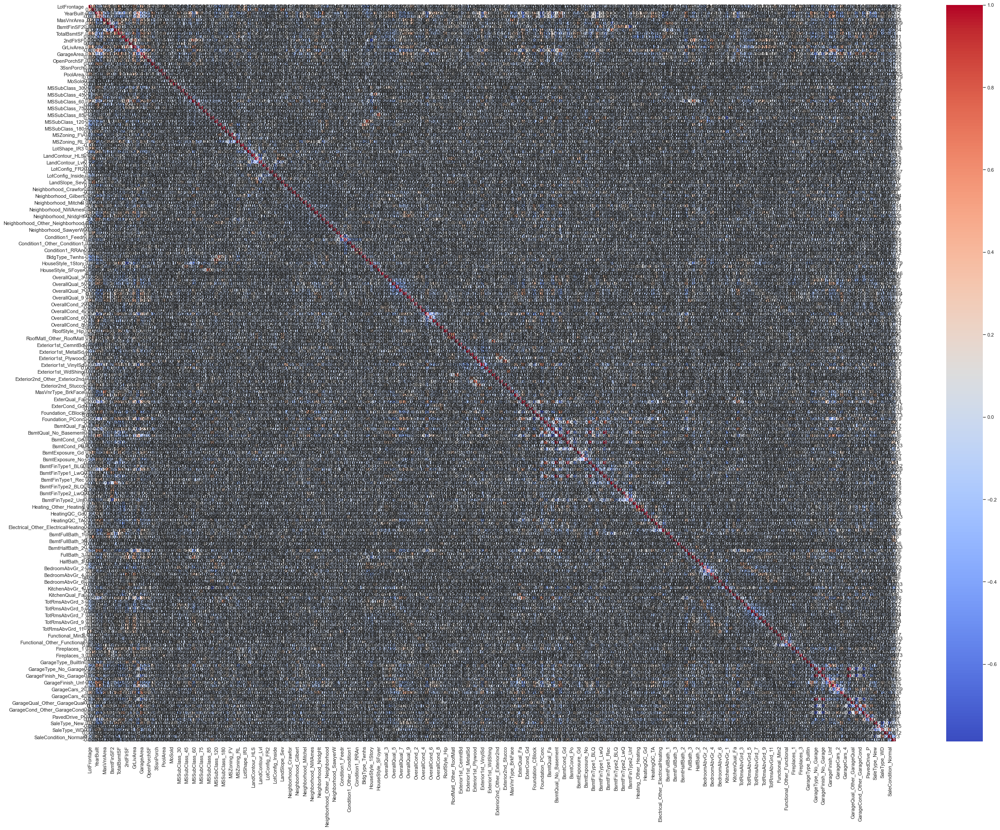

In [63]:
# Plotting Correlation heatmap to understand the highly correlated variables

plt.figure(figsize= (40,30))
sns.heatmap(X_train.corr() , annot = True, cmap = 'coolwarm')
plt.show()

Heatmap shows no multi-collinearity between the predictor varibales.

#### Lets Build the Model using RFE

In [64]:
# Instantiate LinearRegression object
lm = LinearRegression()

# Fitting the Linear regression object  with X_train & y_train
lm.fit(X_train,y_train)

LinearRegression()

In [65]:
# Running RFE with top 30 features
rfe = RFE(lm, 30)
rfe = rfe.fit(X_train, y_train)

In [66]:
# Lets print the top 30 features selected by RFE
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('LotFrontage', False, 104),
 ('LotArea', True, 1),
 ('YearBuilt', True, 1),
 ('YearRemodAdd', False, 31),
 ('MasVnrArea', False, 165),
 ('BsmtFinSF1', True, 1),
 ('BsmtFinSF2', True, 1),
 ('BsmtUnfSF', False, 13),
 ('TotalBsmtSF', True, 1),
 ('CentralAir', False, 86),
 ('2ndFlrSF', False, 99),
 ('LowQualFinSF', False, 143),
 ('GrLivArea', True, 1),
 ('GarageYrBlt', False, 158),
 ('GarageArea', False, 90),
 ('WoodDeckSF', False, 36),
 ('OpenPorchSF', False, 169),
 ('EnclosedPorch', False, 61),
 ('3SsnPorch', True, 1),
 ('ScreenPorch', False, 35),
 ('PoolArea', True, 1),
 ('MiscVal', False, 58),
 ('MoSold', False, 185),
 ('YrSold', False, 170),
 ('MSSubClass_30', False, 68),
 ('MSSubClass_40', False, 96),
 ('MSSubClass_45', False, 183),
 ('MSSubClass_50', False, 107),
 ('MSSubClass_60', False, 43),
 ('MSSubClass_70', False, 125),
 ('MSSubClass_75', False, 128),
 ('MSSubClass_80', False, 108),
 ('MSSubClass_85', False, 184),
 ('MSSubClass_90', False, 133),
 ('MSSubClass_120', False, 91)

In [67]:
# Creating a list of the top 30 features  for Model Building  with these features
col = X_train.columns[rfe.support_]
col

Index(['LotArea', 'YearBuilt', 'BsmtFinSF1', 'BsmtFinSF2', 'TotalBsmtSF',
       'GrLivArea', '3SsnPorch', 'PoolArea', 'MSSubClass_160',
       'MSSubClass_180', 'LotShape_IR3', 'Condition2_Other_Condition2',
       'OverallQual_2', 'OverallQual_8', 'OverallQual_9', 'OverallQual_10',
       'OverallCond_3', 'OverallCond_4', 'OverallCond_9', 'ExterQual_Fa',
       'ExterCond_Other_ExterCond', 'BsmtCond_No_Basement', 'BsmtCond_Po',
       'BsmtFullBath_3', 'TotRmsAbvGrd_11', 'TotRmsAbvGrd_12', 'Fireplaces_3',
       'GarageType_Other_GarageType', 'GarageCars_4', 'GarageQual_No_Garage'],
      dtype='object')

In [68]:
# Lets check the variables not suitable for model building
X_train.columns[~rfe.support_]

Index(['LotFrontage', 'YearRemodAdd', 'MasVnrArea', 'BsmtUnfSF', 'CentralAir',
       '2ndFlrSF', 'LowQualFinSF', 'GarageYrBlt', 'GarageArea', 'WoodDeckSF',
       ...
       'GarageCond_Other_GarageCond', 'GarageCond_TA', 'PavedDrive_P',
       'PavedDrive_Y', 'SaleType_New', 'SaleType_Other_SaleType',
       'SaleType_WD', 'SaleCondition_Family', 'SaleCondition_Normal',
       'SaleCondition_Other_SaleCondition'],
      dtype='object', length=188)

#### Building Model_1

In [69]:
# Creating X_train dataframe using RFE Selected features
X_train_rfe = X_train[col]

# Adding Constant to the X_train_rfe
X_train_sm = sm.add_constant(X_train_rfe)

# Running a fitted Linear Model_1using OLS
lm_1 = sm.OLS(y_train , X_train_sm).fit()

# Lets check the Statistical summary of the model
print(lm_1.summary())

                              OLS Regression Results                             
Dep. Variable:     Transformed_SalePrice   R-squared:                       0.844
Model:                               OLS   Adj. R-squared:                  0.839
Method:                    Least Squares   F-statistic:                     178.5
Date:                   Wed, 27 Oct 2021   Prob (F-statistic):               0.00
Time:                           11:29:58   Log-Likelihood:                 444.00
No. Observations:                   1022   AIC:                            -826.0
Df Residuals:                        991   BIC:                            -673.2
Df Model:                             30                                         
Covariance Type:               nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------

#### Observations on Model_1
- R-Squares = 0.844
- Adj R- Squared = 0.839
- 'BsmtCond_Po' features p-value is very high - 0.344
- Lets drop he feature 'BsmtCond_Po' & rebuild a new model

#### Building Model_2

In [70]:
# Lets drop the insignificant feature 'BsmtCond_Po'
X_train_rfe = X_train_rfe.drop(['BsmtCond_Po'] , axis = 1)

# Building Model_2
X_train_sm = sm.add_constant(X_train_rfe)
lm_2 = sm.OLS(y_train , X_train_sm).fit()
print(lm_2.summary())

                              OLS Regression Results                             
Dep. Variable:     Transformed_SalePrice   R-squared:                       0.844
Model:                               OLS   Adj. R-squared:                  0.839
Method:                    Least Squares   F-statistic:                     184.7
Date:                   Wed, 27 Oct 2021   Prob (F-statistic):               0.00
Time:                           11:31:05   Log-Likelihood:                 443.54
No. Observations:                   1022   AIC:                            -827.1
Df Residuals:                        992   BIC:                            -679.2
Df Model:                             29                                         
Covariance Type:               nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------

#### Observations on Model_2
- R-Squares = 0.844
- Adj R- Squared = 0.839
- 'BsmtFullBath_3' features p-value is very high - 0.191
- Lets drop he feature 'BsmtFullBath_3' & rebuild a new model

#### Building Model-3

In [71]:
# Lets drop the insignificant feature 'BsmtFullBath_3'
X_train_rfe = X_train_rfe.drop(['BsmtFullBath_3'] , axis = 1)

# Building Model-3
X_train_sm = sm.add_constant(X_train_rfe)
lm_3 = sm.OLS(y_train , X_train_sm).fit()
print(lm_3.summary())

                              OLS Regression Results                             
Dep. Variable:     Transformed_SalePrice   R-squared:                       0.843
Model:                               OLS   Adj. R-squared:                  0.839
Method:                    Least Squares   F-statistic:                     191.1
Date:                   Wed, 27 Oct 2021   Prob (F-statistic):               0.00
Time:                           11:32:26   Log-Likelihood:                 442.66
No. Observations:                   1022   AIC:                            -827.3
Df Residuals:                        993   BIC:                            -684.4
Df Model:                             28                                         
Covariance Type:               nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------

#### Observations on Model_3
- R-Squares = 0.843
- Adj R- Squared = 0.839
- 'ExterCond_Other_ExterCond' features p-value is very high - 0.123
- Lets drop he feature 'ExterCond_Other_ExterCond' & rebuild a new model

#### Building Model-4

In [72]:
# Lets drop the insignificant feature 'ExterCond_Other_ExterCond'
X_train_rfe = X_train_rfe.drop(['ExterCond_Other_ExterCond'] , axis = 1)

# Building Model-4
X_train_sm = sm.add_constant(X_train_rfe)
lm_4 = sm.OLS(y_train , X_train_sm).fit()
print(lm_4.summary())

                              OLS Regression Results                             
Dep. Variable:     Transformed_SalePrice   R-squared:                       0.843
Model:                               OLS   Adj. R-squared:                  0.839
Method:                    Least Squares   F-statistic:                     197.8
Date:                   Wed, 27 Oct 2021   Prob (F-statistic):               0.00
Time:                           11:33:31   Log-Likelihood:                 441.43
No. Observations:                   1022   AIC:                            -826.9
Df Residuals:                        994   BIC:                            -688.8
Df Model:                             27                                         
Covariance Type:               nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------

#### Observations on Model-4
- R-Squares = 0.843
- Adj R- Squared = 0.839
- All features P-Values are <0.05
- Lets Check VIF & rebuild a new model

### Lets check VIF:

In [73]:
# Creating a function to check VIF

def check_vif(X):
    # Creating dataframe for vif
    vif = pd.DataFrame()
    X = X_train_rfe
    vif['Features'] = X.columns
    vif['VIF'] = [variance_inflation_factor(X.values,i) for i in range(X.shape[1])]
    vif['VIF'] = round(vif['VIF'],2)
    vif = vif.sort_values('VIF' , ascending = False)
    return vif

# Call the function to check VIF Values for the last model-4
check_vif(X_train_rfe)

,Features,VIF
4,TotalBsmtSF,10.15
5,GrLivArea,8.22
2,BsmtFinSF1,2.99
1,YearBuilt,2.68
0,LotArea,2.27
13,OverallQual_8,1.54
15,OverallQual_10,1.29
26,GarageQual_No_Garage,1.21
20,BsmtCond_No_Basement,1.19
14,OverallQual_9,1.19


#### Observations:
- TotalBsmtSF has VIF of 10.15
- GrLivArea - 8.22
- Lets drop TotalBsmtSF feature & rebuild a new model

#### Building Model-5

In [74]:
# Lets drop the insignificant feature 'TotalBsmtSF'
X_train_rfe = X_train_rfe.drop(['TotalBsmtSF'] , axis = 1)

# Building Model-5
X_train_sm = sm.add_constant(X_train_rfe)
lm_5 = sm.OLS(y_train , X_train_sm).fit()
print(lm_5.summary())

                              OLS Regression Results                             
Dep. Variable:     Transformed_SalePrice   R-squared:                       0.842
Model:                               OLS   Adj. R-squared:                  0.838
Method:                    Least Squares   F-statistic:                     204.0
Date:                   Wed, 27 Oct 2021   Prob (F-statistic):               0.00
Time:                           11:37:23   Log-Likelihood:                 438.13
No. Observations:                   1022   AIC:                            -822.3
Df Residuals:                        995   BIC:                            -689.2
Df Model:                             26                                         
Covariance Type:               nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------

In [75]:
# Call the function to check VIF Values for the last model-5
check_vif(X_train_rfe)

,Features,VIF
4,GrLivArea,4.71
1,YearBuilt,2.60
2,BsmtFinSF1,2.24
0,LotArea,2.23
12,OverallQual_8,1.50
14,OverallQual_10,1.29
25,GarageQual_No_Garage,1.21
9,LotShape_IR3,1.17
13,OverallQual_9,1.16
6,PoolArea,1.16


#### Observations on Model-5
- R-Squares = 0.842
- Adj R- Squared = 0.838
- p-values < 0.05 for all variables & VIF <5 for all variables

####  Linear Model:
- Hence this is the final Model & lets make predictions
- The top Significant features from the RFE Linear regression model are :
GrLivArea , LotArea, OverallQual_9, BsmtFinSF1, BsmtFinSF2, 3SsnPorch, OverallQual_8, OverallQual_9, OverallQual_10, OverallCond_9 , GarageCars_4

## 7.Making Predictions

In [76]:
# Lets make predictions on X_test

X_test_new = X_test[X_train_rfe.columns]

# Add a constant to the variable
X_test_new = sm.add_constant(X_test_new)

# Making predictions 
y_pred = lm_5.predict(X_test_new)

In [77]:
# R-Squared on test set :
r2_train = 0.842
r2_test = r2_score(y_test , y_pred)
print("R-Squared on Train:", r2_train)
print("R-Squared on Test :", r2_test)

R-Squared on Train: 0.842
R-Squared on Test : 0.8030832578558312


#### Model Evaluation

In [81]:
# Lets make prediction on r2 score on train & test set 

y_pred_train = lm.predict(X_train)
y_pred_test = lm.predict(X_test)

metric = []

# r2_score on trainset
r2_train_lr = r2_score(y_train,y_pred_train)
print("R-Squared score on Train set :", r2_train_lr)
metric.append(r2_train_lr)

# r2_score on test set
r2_test_lr =  r2_score(y_test,y_pred_test)
print("R-Squared Score on Test set : ", r2_test_lr)
metric.append(r2_test_lr)

# Residual sum of squares on Train
rss1_lr = np.sum(np.square(y_train - y_pred_train))
print("Residual Sum of Squares in Train set :", rss1_lr)
metric.append(rss1_lr)

# Residual sum of squares on Test
rss2_lr = np.sum(np.square(y_test - y_pred_test))
print("Residual Sum of Squares in Test set :", rss2_lr)
metric.append(rss2_lr)

# Mean Squared Error on Train
mse_train_lr = mean_squared_error(y_train , y_pred_train)
print("mean Squared Error on Train :" , mse_train_lr)
metric.append(mse_train_lr ** 0.5)

# Mean Squared Error on Test
mse_test_lr = mean_squared_error(y_test , y_pred_test)
print("mean Squared Error on Test :" , mse_test_lr)
metric.append(mse_test_lr ** 0.5)

R-Squared score on Train set : 0.9355999667850026
R-Squared Score on Test set :  -2.317578724256319e+20
Residual Sum of Squares in Train set : 10.350727969279657
Residual Sum of Squares in Test set : 1.6702458692816362e+22
mean Squared Error on Train : 0.010127913864265809
mean Squared Error on Test : 3.813346733519717e+19


## 8. Ridge and Lasso Regularaisation

Let's now try to predict the SalesPrice on the housing_dataset using in simple linear regression, to perform Ridge & Lasso regression

### Ridge Regression

In [82]:
# List of alphas to tune-if value too high it will lead to Underfitting else it will not handle underfitting issue

params = {'alpha' : [0.0001, 0.001, 0.01, 0.05, 0.01, 
                    0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 
                    1.0, 2.0 ,3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 
                    10.0, 20, 50, 100, 500, 1000 ]}

# Instantiate Ridge object
ridge = Ridge()

# Cross Validation
folds = 5
model_cv = GridSearchCV( estimator = ridge,
                         param_grid = params, 
                         scoring = 'neg_mean_absolute_error', 
                         cv = folds, 
                         return_train_score = True, 
                         verbose = 1)
model_cv.fit(X_train, y_train)


Fitting 5 folds for each of 29 candidates, totalling 145 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 145 out of 145 | elapsed:    1.4s finished


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.01, 0.1, 0.2,
                                   0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0,
                                   3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20,
                                   50, 100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [83]:
# Printing the best hyper parameter alpha 
print(model_cv.best_params_)

{'alpha': 2.0}


In [84]:
# Printing the best hyper parameter alpha 
alpha = 2.0
ridge = Ridge(alpha = alpha)

ridge.fit(X_train, y_train)
ridge.coef_

array([ 0.00168609,  0.14822979, -0.11047403, -0.09339191,  0.02583552,
        0.11156894,  0.10148534,  0.09119616,  0.16240896,  0.07870011,
        0.19159608,  0.02612017,  0.40533598,  0.02102205,  0.08755252,
        0.09034809,  0.02416338,  0.03873688,  0.09154704,  0.0692503 ,
       -0.06118646,  0.01709039,  0.00118136,  0.01091093, -0.09121146,
       -0.04860838, -0.01243216,  0.00058591, -0.07750089,  0.01654474,
        0.00362314, -0.02187153,  0.01185155,  0.02035353, -0.00701051,
       -0.08186178, -0.07255623, -0.02373267,  0.10533396,  0.07578281,
        0.05919702,  0.03302976, -0.02096454,  0.00290422,  0.0278442 ,
        0.0387917 ,  0.04255128,  0.03627103, -0.05013232, -0.00681753,
       -0.01306202,  0.03465911,  0.00632535, -0.03865217,  0.06878885,
       -0.11755461, -0.05517184, -0.11023382, -0.06738289, -0.0487714 ,
       -0.0535289 ,  0.03732872,  0.04403012, -0.06139518, -0.02343538,
       -0.0729941 , -0.03041791, -0.06007563,  0.01748445,  0.05

#### Lets calculate some metrics such as R2_score, RSS & RMSE on Ridge Regression

In [85]:
y_pred_train = ridge.predict(X_train)
y_pred_test = ridge.predict(X_test)

metric2 = []

# r2_score on trainset
r2_train_lr = r2_score(y_train,y_pred_train)
print("R-Squared score on Train set :", r2_train_lr)
metric2.append(r2_train_lr)

# r2_score on test set
r2_test_lr =  r2_score(y_test,y_pred_test)
print("R-Squared Score on Test set : ", r2_test_lr)
metric2.append(r2_test_lr)

# Residual sum of squares on Train
rss1_lr = np.sum(np.square(y_train - y_pred_train))
print("Residual Sum of Squares in Train set :", rss1_lr)
metric2.append(rss1_lr)

# Residual sum of squares on Test
rss2_lr = np.sum(np.square(y_test - y_pred_test))
print("Residual Sum of Squares in Test set :", rss2_lr)
metric2.append(rss2_lr)

# Mean Squared Error on Train
mse_train_lr = mean_squared_error(y_train , y_pred_train)
print("mean Squared Error on Train :" , mse_train_lr)
metric2.append(mse_train_lr ** 0.5)

# Mean Squared Error on Test
mse_test_lr = mean_squared_error(y_test , y_pred_test)
print("mean Squared Error on Test :" , mse_test_lr)
metric2.append(mse_test_lr ** 0.5)

R-Squared score on Train set : 0.928669968145117
R-Squared Score on Test set :  0.8695103226588374
Residual Sum of Squares in Train set : 11.46455551203049
Residual Sum of Squares in Test set : 9.404204581352793
mean Squared Error on Train : 0.011217764688875234
mean Squared Error on Test : 0.021470786715417335


### Lasso Regresssion

In [86]:
# Lets instantiate Lasso object
lasso = Lasso()

# Cross Validation
model_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring = 'neg_mean_absolute_error', 
                        cv = folds,
                        return_train_score = True, 
                        verbose = 1)
model_cv.fit(X_train,y_train)

Fitting 5 folds for each of 29 candidates, totalling 145 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 145 out of 145 | elapsed:    1.4s finished


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.01, 0.1, 0.2,
                                   0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0,
                                   3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20,
                                   50, 100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [87]:
# Printing the best hyperparameter alpha 
print(model_cv.best_params_)

{'alpha': 0.001}


In [88]:
# Fitting Ridge model for alpha = 100 and printing coefficients which has been penalised

alpha = 0.001
lasso = Lasso(alpha = alpha)
lasso.fit(X_train, y_train)


Lasso(alpha=0.001)

In [89]:
lasso.coef_

array([ 0.00000000e+00,  0.00000000e+00, -4.85860777e-02, -1.15050576e-01,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  1.96219290e-02,
        3.84020711e-02,  8.49265276e-02,  0.00000000e+00, -0.00000000e+00,
        9.76945748e-01, -0.00000000e+00,  8.42242653e-02,  5.46306550e-02,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  2.19116077e-02,
       -0.00000000e+00, -0.00000000e+00, -0.00000000e+00,  4.19402250e-03,
       -1.18988863e-01, -0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
       -1.21323782e-02,  1.42305035e-03,  0.00000000e+00, -0.00000000e+00,
        0.00000000e+00, -0.00000000e+00, -0.00000000e+00, -4.68293673e-02,
       -0.00000000e+00, -0.00000000e+00,  9.95402232e-02,  0.00000000e+00,
        5.20594485e-02,  5.92380227e-03, -0.00000000e+00, -0.00000000e+00,
        0.00000000e+00,  8.93361116e-03,  5.38597211e-03,  5.68783657e-02,
       -0.00000000e+00, -0.00000000e+00, -0.00000000e+00,  0.00000000e+00,
        0.00000000e+00, -

#### Lets calculate some metrics such as R2_score, RSS & RMSE on Lasso Regression

In [90]:
y_pred_train = lasso.predict(X_train)
y_pred_test = lasso.predict(X_test)

metric3 = []

# r2_score on trainset
r2_train_lr = r2_score(y_train,y_pred_train)
print("R-Squared score on Train set :", r2_train_lr)
metric3.append(r2_train_lr)

# r2_score on test set
r2_test_lr =  r2_score(y_test,y_pred_test)
print("R-Squared Score on Test set : ", r2_test_lr)
metric3.append(r2_test_lr)

# Residual sum of squares on Train
rss1_lr = np.sum(np.square(y_train - y_pred_train))
print("Residual Sum of Squares in Train set :", rss1_lr)
metric3.append(rss1_lr)

# Residual sum of squares on Test
rss2_lr = np.sum(np.square(y_test - y_pred_test))
print("Residual Sum of Squares in Test set :", rss2_lr)
metric3.append(rss2_lr)

# Mean Squared Error on Train
mse_train_lr = mean_squared_error(y_train , y_pred_train)
print("mean Squared Error on Train :" , mse_train_lr)
metric3.append(mse_train_lr ** 0.5)

# Mean Squared Error on Test
mse_test_lr = mean_squared_error(y_test , y_pred_test)
print("mean Squared Error on Test :" , mse_test_lr)
metric3.append(mse_test_lr ** 0.5)

R-Squared score on Train set : 0.9046822355760116
R-Squared Score on Test set :  0.8745554560821751
Residual Sum of Squares in Train set : 15.319995983524208
Residual Sum of Squares in Test set : 9.04060902483039
mean Squared Error on Train : 0.014990211334172415
mean Squared Error on Test : 0.020640659874041987


#### Lets create a table which contain all Metrics

In [91]:
# Lets create a Linear Regression , Ridge & Lasso metrics dataframe
lr_table = {'Metric': ['R2_Score (Train)', 'R2_Score (Test)',
                       'RSS (Train)' , 'RSS (Test)',
                       'MSE (Train)' , 'MSE (Test)'],
           'LinearRegression' : metric , 
           }
lr_metric = pd.DataFrame(lr_table, columns = ['Metric' , 'LinearRegression'])
rg_metric = pd.Series(metric2 , name = 'Ridge Regression')
ls_metric = pd.Series(metric3 , name  = 'Lasso Regression')

# Concat all teh metrics to a Dataframe
final_metric = pd.concat([lr_metric, rg_metric , ls_metric] , axis = 1)

# Lets check the final_metric
final_metric

,Metric,LinearRegression,Ridge Regression,Lasso Regression
0,R2_Score (Train),9.356000e-01,0.928670,0.904682
1,R2_Score (Test),-2.317579e+20,0.869510,0.874555
2,RSS (Train),1.035073e+01,11.464556,15.319996
3,RSS (Test),1.670246e+22,9.404205,9.040609
4,MSE (Train),1.006375e-01,0.105914,0.122435
5,MSE (Test),6.175230e+09,0.146529,0.143669


#### Let's compare the scatter plot  y_test Vs y_pred for Linear, Ridge & Lasso Models

In [92]:
ridge_pred = ridge.predict(X_test)
lasso_pred = lasso.predict(X_test)

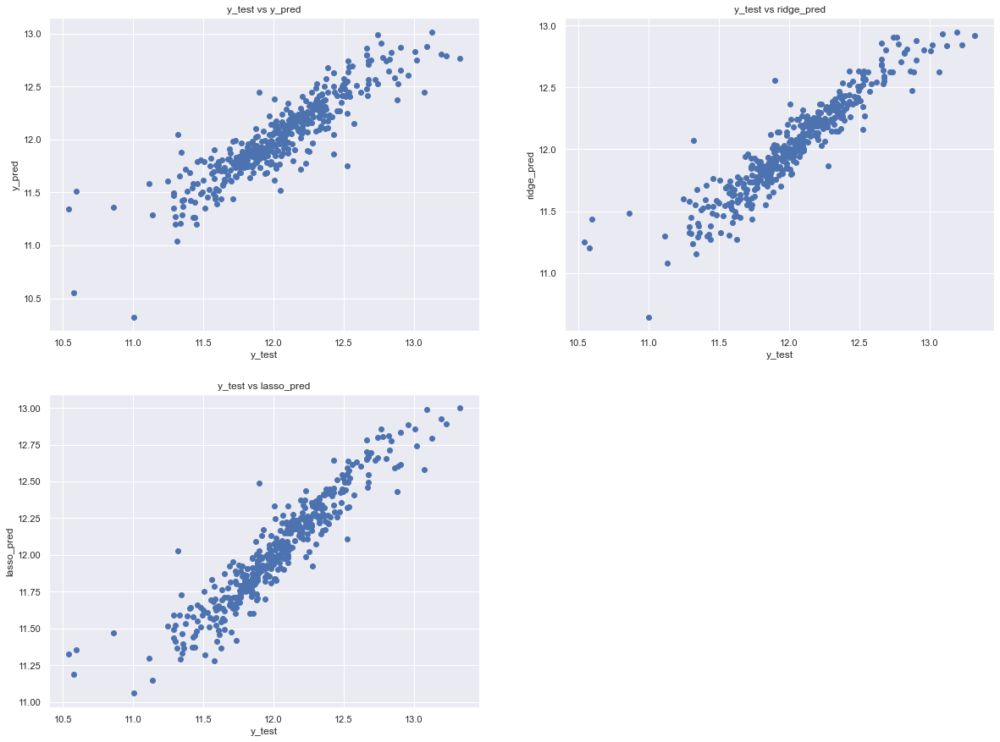

In [93]:
# Plotting scatter plots between y_pred & y_test
plt.figure(figsize = (20,15))

plt.subplot(2,2,1)
plt.scatter(y_test, y_pred)
plt.title("y_test vs y_pred")
plt.xlabel("y_test")
plt.ylabel("y_pred")

plt.subplot(2,2,2)
plt.scatter(y_test, ridge_pred)
plt.title("y_test vs ridge_pred")
plt.xlabel("y_test")
plt.ylabel("ridge_pred")

plt.subplot(2,2,3)
plt.scatter(y_test, lasso_pred)
plt.title("y_test vs lasso_pred")
plt.xlabel("y_test")
plt.ylabel("lasso_pred")

plt.show()

#### Lets compare the Residuals -Error Terms for all Linear, Ridge & Lasso Models

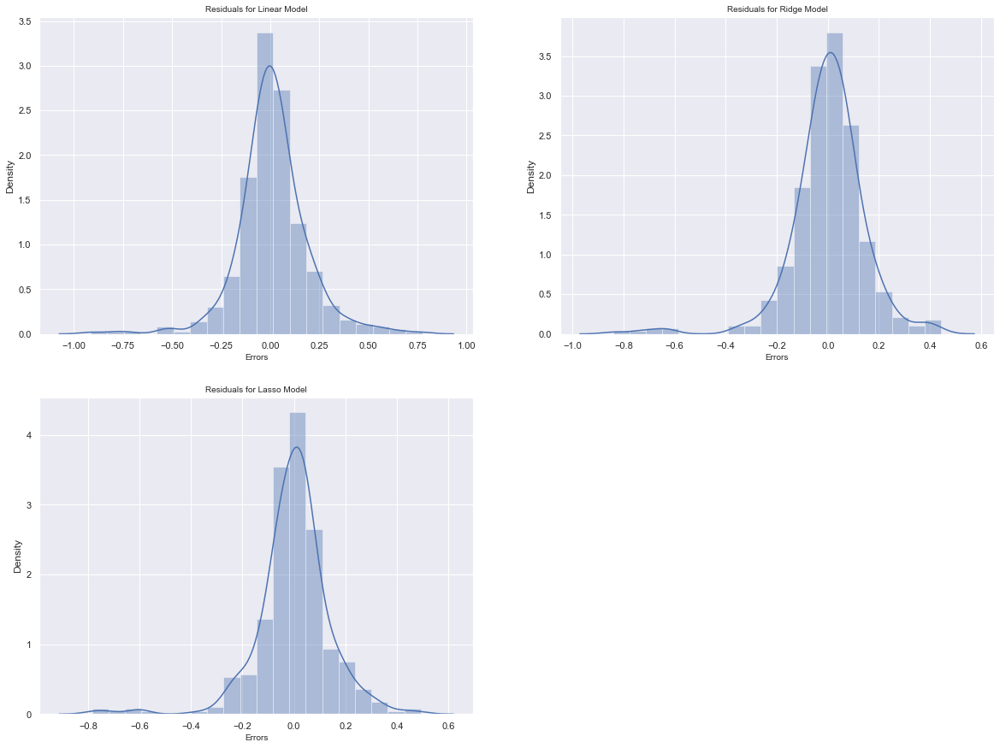

In [94]:
# Lets check the Error Terms for the Linear, Ridge & Lasso
ridge_pred = ridge.predict(X_test)
lasso_pred = lasso.predict(X_test)

residuals_linear = y_test - y_pred
residuals_Ridge = y_test - ridge_pred
residuals_Lasso = y_test - lasso_pred

# Plot Distribution plots for the models 
plt.figure(figsize = (20,15))

plt.subplot(2,2,1)
sns.distplot(residuals_linear, bins = 20)
plt.title("Residuals for Linear Model" , fontsize = 10)
plt.xlabel("Errors" , fontsize = 10)

plt.subplot(2,2,2)
sns.distplot(residuals_Ridge, bins = 20)
plt.title("Residuals for Ridge Model" , fontsize = 10)
plt.xlabel("Errors" , fontsize = 10)

plt.subplot(2,2,3)
sns.distplot(residuals_Lasso, bins = 20)
plt.title("Residuals for Lasso Model" , fontsize = 10)
plt.xlabel("Errors" , fontsize = 10)

plt.show()

### Lets Observe the changes in the coefficients /weights after Regularaization

In [95]:
betas = pd.DataFrame(index = X_train.columns)
betas.rows = X_train.columns
betas['Linear'] = lm.coef_
betas['Ridge'] = ridge.coef_
betas['Lasso'] = lasso.coef_

# Lets print the 100 rows of the dataframe.
print(betas.head(100))

# Lets print the top 30 significant features as per the Lasso regression
betas = betas['Lasso'].sort_values(ascending = False)
betas.head(30)

                                       Linear     Ridge     Lasso
LotFrontage                     -4.727214e-02  0.001686  0.000000
LotArea                          3.912401e-01  0.148230  0.000000
YearBuilt                       -2.237597e-01 -0.110474 -0.048586
YearRemodAdd                    -7.499902e-02 -0.093392 -0.115051
MasVnrArea                      -1.855511e-02  0.025836  0.000000
BsmtFinSF1                      -1.543528e+11  0.111569  0.000000
BsmtFinSF2                      -4.031112e+10  0.101485  0.000000
BsmtUnfSF                       -6.388520e+10  0.091196  0.019622
TotalBsmtSF                      1.670970e+11  0.162409  0.038402
CentralAir                       5.588818e-02  0.078700  0.084927
2ndFlrSF                         1.024208e-01  0.191596  0.000000
LowQualFinSF                    -2.497101e-02  0.026120 -0.000000
GrLivArea                        1.251970e+00  0.405336  0.976946
GarageYrBlt                      1.346016e-02  0.021022 -0.000000
GarageArea

GrLivArea               0.976946
OverallQual_9           0.239882
OverallQual_8           0.137826
Fireplaces_2            0.124155
MSZoning_FV             0.099540
BsmtExposure_Gd         0.091508
Neighborhood_Crawfor    0.086637
CentralAir              0.084927
GarageArea              0.084224
SaleType_New            0.077931
Neighborhood_NridgHt    0.073267
GarageCars_3            0.072532
FullBath_3              0.068757
Exterior1st_BrkFace     0.062050
TotRmsAbvGrd_10         0.060978
OverallQual_10          0.058874
Fireplaces_1            0.058412
LotConfig_CulDSac       0.056878
WoodDeckSF              0.054631
OverallQual_7           0.054274
MSZoning_RL             0.052059
KitchenAbvGr_1          0.051809
Functional_Typ          0.046506
Condition1_Norm         0.045630
GarageCond_TA           0.043371
SaleCondition_Normal    0.042523
BsmtCond_TA             0.041626
TotalBsmtSF             0.038402
Neighborhood_NoRidge    0.037339
HouseStyle_1Story       0.037149
Name: Lass

In [97]:
# Lets make a list of top 30 significant features
top_30_Lasso_1_features = ['GrLivArea','OverallQual_9', 'OverallQual_8','Fireplaces_2', 'MSZoning_FV','BsmtExposure_Gd',
                           'Neighborhood_Crawfor','CentralAir','GarageArea','SaleType_New','Neighborhood_NridgHt',
                           'GarageCars_3','FullBath_3','Exterior1st_BrkFace','TotRmsAbvGrd_10','OverallQual_10',
                           'Fireplaces_1','LotConfig_CulDSac','WoodDeckSF','OverallQual_7','MSZoning_RL','KitchenAbvGr_1',
                           'Functional_Typ','Condition1_Norm','GarageCond_TA','SaleCondition_Normal','BsmtCond_TA',
                           'TotalBsmtSF','TotalBsmtSF','Neighborhood_NoRidge','HouseStyle_1Story']

top_30_Lasso_1_features

['GrLivArea',
 'OverallQual_9',
 'OverallQual_8',
 'Fireplaces_2',
 'MSZoning_FV',
 'BsmtExposure_Gd',
 'Neighborhood_Crawfor',
 'CentralAir',
 'GarageArea',
 'SaleType_New',
 'Neighborhood_NridgHt',
 'GarageCars_3',
 'FullBath_3',
 'Exterior1st_BrkFace',
 'TotRmsAbvGrd_10',
 'OverallQual_10',
 'Fireplaces_1',
 'LotConfig_CulDSac',
 'WoodDeckSF',
 'OverallQual_7',
 'MSZoning_RL',
 'KitchenAbvGr_1',
 'Functional_Typ',
 'Condition1_Norm',
 'GarageCond_TA',
 'SaleCondition_Normal',
 'BsmtCond_TA',
 'TotalBsmtSF',
 'TotalBsmtSF',
 'Neighborhood_NoRidge',
 'HouseStyle_1Story']

### Conclusion

1. The final RFE Linear Regression Model is  statistically fit with the most significant features

- R-Squared on Train: 0.842
- R-Squared on Test : 0.8030832578558312

2. The Basic Linear Regression Model is
- R-Squared score on Train set : 0.9355999667850026
- R-Squared Score on Test set :  -2.317578724256319e+20

3. Ridge Regression Model has the below scores on Train & Test
- R-Squared (Train) : 0.928670
- R-Squared (Test) : 0.869510

4. Lasso Regression Model has the below Score on Train & Test
- R-Squared (Train) : 0.904682
- R-Squared (Test) : 0.874555


On comparing all the models, Lasso model has slightly best performance than the Ridge Regression

### The company wants to know the following things about the prospective properties:

#### 1. Which variables are significant in predicting the price of a house


In [ ]:
for i in top_30_Lasso_1_features:
    print(i)

#### 2. How well those variables describe the price of a house.


         Metric------Ridge Regression ---------Lasso Regression
R2_Score (Train) ---------0.928670 -------------0.904682

R2_Score (Test)	 ---------0.869510 -------------0.874555

#### Determine the optimal value of lambda for ridge and lasso regression.

Ridge : 'alpha': 2.0

Lasso : 'alpha': 0.001

- Lasso is the best model over the other models

## Problem Statement - Part II

### Assignment Part-II

#### Question 1

What is the optimal value of alpha for ridge and lasso regression? What will be the changes in the model if you choose double the value of alpha for both ridge and lasso? What will be the most important predictor variables after the change is implemented?

#### 1.a The Optimal Value of aplhas for Ridge & Lasso is:

Ridge : 2.0
Lasso : 0.001

   Metric------Ridge Regression ---------Lasso Regression
   
R2_Score (Train) ---------0.928670 -------------0.904682

R2_Score (Test) ---------0.869510 -------------0.874555

In [98]:
# 1.b Lets Double the alpha for ridge from 2.0 to 4.0
alpha  = 4.0
ridge_2 = Ridge(alpha = alpha)
ridge_2.fit(X_train, y_train)

Ridge(alpha=4.0)

In [99]:
y_pred_train_ridge = ridge_2.predict(X_train)
y_pred_test_ridge = ridge_2.predict(X_test)

metric_2 = []

# r2_score on trainset
r2_train_lr = r2_score(y_train,y_pred_train_ridge)
print("R-Squared score on Train set :", r2_train_lr)
metric_2.append(r2_train_lr)

# r2_score on test set
r2_test_lr =  r2_score(y_test,y_pred_test_ridge)
print("R-Squared Score on Test set : ", r2_test_lr)
metric_2.append(r2_test_lr)

# Residual sum of squares on Train
rss1_lr = np.sum(np.square(y_train - y_pred_train_ridge))
print("Residual Sum of Squares in Train set :", rss1_lr)
metric_2.append(rss1_lr)

# Residual sum of squares on Test
rss2_lr = np.sum(np.square(y_test - y_pred_test_ridge))
print("Residual Sum of Squares in Test set :", rss2_lr)
metric_2.append(rss2_lr)

# Mean Squared Error on Train
mse_train_lr = mean_squared_error(y_train , y_pred_train_ridge)
print("mean Squared Error on Train :" , mse_train_lr)
metric_2.append(mse_train_lr ** 0.5)

# Mean Squared Error on Test
mse_test_lr = mean_squared_error(y_test , y_pred_test_ridge)
print("mean Squared Error on Test :" , mse_test_lr)
metric_2.append(mse_test_lr ** 0.5)

R-Squared score on Train set : 0.9238553824531999
R-Squared Score on Test set :  0.8720076775661351
Residual Sum of Squares in Train set : 12.238382236862309
Residual Sum of Squares in Test set : 9.224223781805943
mean Squared Error on Train : 0.01197493369555999
mean Squared Error on Test : 0.021059871647958774


In [100]:
# 1.C Lets Double the alpha for Lasso from 0.001 to 0.002

alpha = 0.002
lasso_2 = Lasso(alpha = alpha)
lasso_2.fit(X_train, y_train)

Lasso(alpha=0.002)

In [101]:
y_pred_train_lasso = lasso.predict(X_train)
y_pred_test_lasso = lasso.predict(X_test)

metric_3 = []

# r2_score on trainset
r2_train_lr = r2_score(y_train,y_pred_train_lasso)
print("R-Squared score on Train set :", r2_train_lr)
metric_3.append(r2_train_lr)

# r2_score on test set
r2_test_lr =  r2_score(y_test,y_pred_test_lasso)
print("R-Squared Score on Test set : ", r2_test_lr)
metric_3.append(r2_test_lr)

# Residual sum of squares on Train
rss1_lr = np.sum(np.square(y_train - y_pred_train_lasso))
print("Residual Sum of Squares in Train set :", rss1_lr)
metric_3.append(rss1_lr)

# Residual sum of squares on Test
rss2_lr = np.sum(np.square(y_test - y_pred_test_lasso))
print("Residual Sum of Squares in Test set :", rss2_lr)
metric3.append(rss2_lr)

# Mean Squared Error on Train
mse_train_lr = mean_squared_error(y_train , y_pred_train_lasso)
print("mean Squared Error on Train :" , mse_train_lr)
metric3.append(mse_train_lr ** 0.5)

# Mean Squared Error on Test
mse_test_lr = mean_squared_error(y_test , y_pred_test_lasso)
print("mean Squared Error on Test :" , mse_test_lr)
metric3.append(mse_test_lr ** 0.5)

R-Squared score on Train set : 0.9046822355760116
R-Squared Score on Test set :  0.8745554560821751
Residual Sum of Squares in Train set : 15.319995983524208
Residual Sum of Squares in Test set : 9.04060902483039
mean Squared Error on Train : 0.014990211334172415
mean Squared Error on Test : 0.020640659874041987


#### Observations

The Optimal Value of aplhas for Ridge & Lasso is:

Ridge : 2.0 Lasso : 0.001

   Metric------Ridge Regression ---------Lasso Regression
   
R2_Score (Train) ---------0.928670 -------------0.904682

R2_Score (Test) ---------0.869510 -------------0.874555


#### On Doubling alphas

Ridge : alpha = 4.0
- R-Squared score on Train set : 0.923855
- R-Squared Score on Test set :  0.872007

--> On doubling the alpha on ridge model, R2 score has reduced both on Train & Test set.

Lasso: alpha = 0.002
- R-Squared score on Train set : 0.904682
- R-Squared Score on Test set :  0.874555

--> On doubling the alpha on ridge model, R2 score is same on both Train & Test set.

####  1.c The most important predictor variables after the change is implemented

In [102]:
# Important predictor variables 
betas = pd.DataFrame(X_train.columns)
betas.rows  =  X_train.columns
betas['Ridge_4.0'] = ridge_2.coef_
betas['Ridge_2.0'] = ridge.coef_
betas['Lasso_0.002'] = lasso_2.coef_
betas['Lasso_0.001'] = lasso.coef_
betas = betas.set_index(0)
print(betas.head(50))

# Lets print the top 30 features 
betas = betas['Lasso_0.002'].sort_values(ascending = False)
print("The top significant 30 features & Betas are ")
betas.head(30)

                   Ridge_4.0  Ridge_2.0  Lasso_0.002  Lasso_0.001
0                                                                
LotFrontage         0.017419   0.001686     0.000000     0.000000
LotArea             0.101855   0.148230     0.000000     0.000000
YearBuilt          -0.082101  -0.110474    -0.000000    -0.048586
YearRemodAdd       -0.099539  -0.093392    -0.136173    -0.115051
MasVnrArea          0.036357   0.025836     0.000000     0.000000
BsmtFinSF1          0.092346   0.111569     0.000000     0.000000
BsmtFinSF2          0.077462   0.101485     0.000000     0.000000
BsmtUnfSF           0.090317   0.091196     0.017701     0.019622
TotalBsmtSF         0.138521   0.162409     0.000000     0.038402
CentralAir          0.082419   0.078700     0.103307     0.084927
2ndFlrSF            0.157148   0.191596     0.000000     0.000000
LowQualFinSF        0.023405   0.026120    -0.000000    -0.000000
GrLivArea           0.291129   0.405336     0.899309     0.976946
GarageYrBl

0
GrLivArea               0.899309
OverallQual_9           0.194583
Fireplaces_2            0.136176
OverallQual_8           0.126266
GarageArea              0.123779
CentralAir              0.103307
BsmtExposure_Gd         0.101037
GarageCars_3            0.095377
MSZoning_RL             0.070880
MSZoning_FV             0.069993
Fireplaces_1            0.066131
Neighborhood_Crawfor    0.063800
GarageCond_TA           0.061281
SaleType_New            0.060511
Neighborhood_NridgHt    0.057364
OverallQual_7           0.048080
TotRmsAbvGrd_10         0.047735
LotConfig_CulDSac       0.047610
FullBath_3              0.045335
BsmtFinType1_GLQ        0.041478
Functional_Typ          0.041338
HalfBath_1              0.041066
Condition1_Norm         0.040533
BsmtFullBath_1          0.038310
KitchenAbvGr_1          0.037221
OverallCond_7           0.034977
HouseStyle_1Story       0.031631
ExterQual_Gd            0.027571
Foundation_PConc        0.024329
BedroomAbvGr_4          0.022889
Name: La

#### The significant features on doubling alpha are 
-GrLivArea,OverallQual_9,Fireplaces_2,OverallQual_8,GarageArea,CentralAir,BsmtExposure_Gd,GarageCars_3,MSZoning_RL,MSZoning_FV,
Fireplaces_1,Neighborhood_Crawfor,GarageCond_TA,SaleType_New,Neighborhood_NridgHt,OverallQual_7,TotRmsAbvGrd_10,
LotConfig_CulDSac,FullBath_3,BsmtFinType1_GLQ,Functional_Typ,HalfBath_1,Condition1_Norm,BsmtFullBath_1,KitchenAbvGr_1,
OverallCond_7,HouseStyle_1Story,ExterQual_Gd,Foundation_PConc,BedroomAbvGr_4

#### Question 2

You have determined the optimal value of lambda for ridge and lasso regression during the assignment. Now, which one will you choose to apply and why?

- R2 Score of Lasso is slighthly higher than the Ridge model on the housing_dataset.
- So we can choose Lasso over Ridge regression model

#### Question 3

After building the model, you realised that the five most important predictor variables in the lasso model are not available in the incoming data. You will now have to create another model excluding the five most important predictor variables. Which are the five most important predictor variables now?

In [103]:
# The top 5 predictors from the first Lasso model are :
print(top_30_Lasso_1_features[:5])

['GrLivArea', 'OverallQual_9', 'OverallQual_8', 'Fireplaces_2', 'MSZoning_FV']


In [104]:
# Lets drop these 5 variables & rebuild the new Lasso model

X_train_Q3 = X_train.drop(['GrLivArea', 'OverallQual_9', 'OverallQual_8', 'Fireplaces_2', 'MSZoning_FV'] , axis = 1)
X_test_Q3 =  X_test.drop(['GrLivArea', 'OverallQual_9', 'OverallQual_8', 'Fireplaces_2', 'MSZoning_FV'] , axis = 1)

In [105]:
# Lets buid a Lasso Model

alpha = 0.001
lasso_Q3 = Lasso(alpha = alpha)
lasso_Q3.fit(X_train_Q3, y_train)

Lasso(alpha=0.001)

In [106]:
# Lets calculate the metrics on the new Lasso model
y_train_pred_Q3 = lasso_Q3.predict(X_train_Q3)
y_test_pred_Q3 = lasso_Q3.predict(X_test_Q3)

metric_Q3 = []

# r2_score on trainset
r2_train_lr = r2_score(y_train,y_train_pred_Q3)
print("R-Squared score on Train set :", r2_train_lr)
metric_Q3.append(r2_train_lr)

# r2_score on test set
r2_test_lr =  r2_score(y_test,y_test_pred_Q3)
print("R-Squared Score on Test set : ", r2_test_lr)
metric_Q3.append(r2_test_lr)

# Residual sum of squares on Train
rss1_lr = np.sum(np.square(y_train - y_train_pred_Q3))
print("Residual Sum of Squares in Train set :", rss1_lr)
metric_Q3.append(rss1_lr)

# Residual sum of squares on Test
rss2_lr = np.sum(np.square(y_test - y_test_pred_Q3))
print("Residual Sum of Squares in Test set :", rss2_lr)
metric_Q3.append(rss2_lr)

# Mean Squared Error on Train
mse_train_lr = mean_squared_error(y_train , y_train_pred_Q3)
print("mean Squared Error on Train :" , mse_train_lr)
metric_Q3.append(mse_train_lr ** 0.5)

# Mean Squared Error on Test
mse_test_lr = mean_squared_error(y_test , y_test_pred_Q3)
print("mean Squared Error on Test :" , mse_test_lr)
metric_Q3.append(mse_test_lr ** 0.5)

R-Squared score on Train set : 0.8908860846045172
R-Squared Score on Test set :  0.8507929144230305
Residual Sum of Squares in Train set : 17.537389338777892
Residual Sum of Squares in Test set : 10.753141446466026
mean Squared Error on Train : 0.017159872151446078
mean Squared Error on Test : 0.02455055124763933


#### R-Squared with top 5 features

Lasso Regression Model has the below Score on Train & Test

- R-Squared (Train) : 0.904682
- R-Squared (Test) : 0.874555
    
#### R-Squared without top 5 features 

Lasso Regression Model has the below Score on Train & Test

- R-Squared score on Train set : 0.8908860846045172
- R-Squared Score on Test set :  0.8507929144230305

##### There is a slight drop in the R2-scores after dropping the top 5 significant features

#                                                  Thank You 